In [1]:
# basic stuff
import scipy.io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab import files
import os
import math
import copy

# dim reduction and visualization
import sklearn
from sklearn.decomposition import PCA
# !pip install umap
# !pip install umap-learn
# import umap.umap_ as umap
from sklearn.manifold import TSNE

# torch stuff
import torch
from torch.utils.data import Dataset, DataLoader, Subset
from torch import nn

# Get Data

The csvs are structured as so:

* Each trial is one row (160 rows/trials for each csv)
* Each trial has a different number of timestamps - some trials take longer than others
* The number of columns is determined by the trial with the max number of timestamps in that session
* The number of columns equals: max_timestamps*(gloveinput_dim+neuraloutput_dim+cursor_dim+timestamp_dim)
* The longest trial has no null values, all other trials have null values where they have no timestamps (the shorter, the more null values)

I restructured the data in the following way:

* For each trial (i.e. each row), I got rid of all null values. Then I extracted each of the data types (glove, neural, etc) separately, and reshaped them to dim x num_timestamps, where dim is the dimensionality of that particular data type.

In [2]:
# get data from each session - 16,17,18,19
# csvs were obtained from matlab object (code in matlab)
trialdata16 = np.genfromtxt('trialdata16.csv', delimiter = ',')[1:,1:]
trialdata17 = np.genfromtxt('trialdata17.csv', delimiter = ',')[1:,1:]
trialdata18 = np.genfromtxt('trialdata18.csv', delimiter = ',')[1:,1:]
trialdata19 = np.genfromtxt('trialdata19.csv', delimiter = ',')[1:,1:]

In [3]:
trialdata16.shape, trialdata17.shape, trialdata18.shape, trialdata19.shape

((160, 65132), (160, 62811), (160, 36582), (160, 25350))

In [4]:
# number of timestamps for each trial; 160 trials
# timestamps obtained by copying and pasting size of timestamps - not sure how to extract from MatlabOpaque object...
timestamps_list16 = [72,47,81,52,73,46,69,116,102,52,55,60,58,49,112,42,61,37,64,58,47,53,55,46,42,40,76,35,60,52,53,49,51,51,57,48,138,35,77,70,87,46,53,857,57,37,67,37,48,43,48,368,135,44,61,40,44,45,54,46,45,47,54,69,201,67,64,40,55,65,49,44,92,62,51,37,51,46,38,41,57,46,72,65,87,56,69,50,66,39,115,70,57,71,60,40,67,115,96,123,45,40,49,40,193,154,56,67,49,48,137,53,79,59,93,43,53,43,71,74,50,39,80,69,42,39,59,237,56,50,39,42,56,45,51,41,37,52,78,25,130,71,66,47,68,71,72,56,60,63,70,58,62,116,51,101,58,60,48,47]
timestamps_list17 = [61,103,51,131,60,84,46,142,122,37,62,80,41,45,55,52,52,39,135,41,198,56,71,78,52,172,51,52,180,43,168,73,44,40,51,63,51,37,74,55,52,35,57,59,48,38,51,53,60,40,52,265,52,53,68,41,49,60,53,46,53,33,43,50,51,36,72,28,50,40,50,48,62,45,46,58,58,31,54,110,69,88,44,43,56,80,52,40,46,49,44,35,61,48,67,39,65,27,54,50,190,139,74,39,53,52,68,43,47,117,91,36,71,49,57,119,65,94,56,41,42,46,55,205,99,22,60,34,57,47,111,42,58,53,185,454,50,37,67,41,68,33,33,62,56,44,54,42,60,49,55,36,50,42,39,57,182,997,50,51]
timestamps_list18 = [113,546,140,114,68,176,24,188,104,94,114,65,123,48,113,80,98,119,105,79,70,93,73,54,68,94,93,100,108,37,85,110,67,43,140,57,104,109,97,158,59,94,51,64,78,32,91,40,62,158,46,63,71,56,86,75,68,63,106,56,43,89,53,101,126,63,67,129,63,83,81,75,71,50,36,80,115,45,71,56,46,58,39,89,35,102,86,75,27,96,49,99,106,84,62,68,115,54,76,84,66,54,101,53,80,56,49,46,62,81,41,48,42,86,43,67,95,42,82,118,86,99,36,76,66,68,31,117,47,61,39,55,48,59,93,58,52,54,51,30,185,64,72,62,85,85,93,63,66,40,54,60,35,82,58,36,42,70,59,69]
timestamps_list19 = [61,236,63,67,68,71,105,105,62,62,77,34,67,60,68,48,66,155,78,43,104,120,82,310,71,53,61,53,71,98,64,93,83,36,69,37,49,55,42,47,71,53,109,74,56,507,67,32,130,60,46,45,63,41,115,185,47,253,110,52,96,42,191,137,48,50,56,52,193,165,88,58,33,216,31,65,56,39,71,59,190,89,57,64,85,56,110,65,65,82,82,34,52,90,86,61,56,73,38,85,83,50,53,137,38,49,48,54,101,44,181,46,78,46,52,87,57,108,185,26,46,112,63,54,130,37,115,126,57,76,56,129,65,80,55,64,101,36,36,45,162,55,74,38,185,110,59,155,35,54,88,58,42,71,63,42,175,62,74,68]
# shape of glove position array, neural output array, cursor position array, timestamp array
# only dimensionality of neural output array varies with each session
shapes_list16 = [19, 54, 2, 1]
shapes_list17 = [19, 41, 2, 1]
shapes_list18 = [19, 45, 2, 1]
shapes_list19 = [19, 28, 2, 1]
neuraloutputs_shapes_list = [54,41,45,28]

In [5]:
def organize_trial_data(trialdata, timestamps_list, shapes_list):
  # The purpose of this function is to extract all of the data from the csv for each session
  # Each trial's data - including glove, neural, timestamp, and cursor data - is stored in one row
  # This function extracts 
    session_organized = []
    neural_output_shape = shapes_list[1]

    for trial, num_timestamps in zip(trialdata, timestamps_list):
        new_data = trial[~np.isnan(trial)]

        gloveinput = new_data[:19*num_timestamps].reshape((19, num_timestamps), order = 'F')
        neuraloutput = new_data[19*num_timestamps:(19+neural_output_shape)*num_timestamps].reshape((neural_output_shape, num_timestamps), order = 'F')
        cursorposition = new_data[(19+neural_output_shape)*num_timestamps:(19+neural_output_shape+2)*num_timestamps].reshape((2, num_timestamps), order = 'F')
        timestamps = new_data[(19+neural_output_shape+2)*num_timestamps:]

        # trial_sorted contains all of the data for each trial
        # trial_sorted is a list of length 160, each element represents one trial
        # each element is a tuple of length 4, containing gloveinput, neuraloutput, cursorposition, and timestamps
        session_organized.append([gloveinput, neuraloutput, cursorposition, timestamps])

    return(session_organized)

In [6]:
sessions = [trialdata16, trialdata17, trialdata18, trialdata19]
sessions_timestamps = [timestamps_list16, timestamps_list17, timestamps_list18, timestamps_list19]
sessions_shapes = [shapes_list16, shapes_list17, shapes_list18, shapes_list19]
sessions_names = ['trialdata16', 'trialdata17', 'trialdata18', 'trialdata19']
sessions_organized = []

for session, timestamps_list, session_shape, name in zip(sessions, sessions_timestamps, sessions_shapes,sessions_names):
    print(name)
    sessions_organized.append(organize_trial_data(session, timestamps_list, session_shape))

trialdata16
trialdata17
trialdata18
trialdata19


In [7]:
# 4 sessions - 16, 17, 18, 19
len(sessions_organized)

4

In [8]:
# 160 trials per session
len(sessions_organized[0])

160

In [9]:
# 4 elements per session - glove, neural, cursor, timestamp
len(sessions_organized[0][0])

4

In [10]:
# the first trial's glove input (72 timestamps)
sessions_organized[0][0][0].shape

(19, 72)

In [11]:
sessions_organized[0][0][0]

array([[145., 145., 145., ..., 147., 147., 159.],
       [135., 135., 135., ..., 117., 117., 122.],
       [139., 139., 139., ..., 116., 116., 112.],
       ...,
       [164., 164., 164., ...,  76.,  76., 158.],
       [126., 126., 126., ...,  97.,  97., 119.],
       [132., 132., 132., ..., 141., 141., 121.]])

# Build Dataset

In [12]:
class CustomDataset(Dataset):
    def __init__(self, session_num, normalize_inputs = True, shuffle = False):
        if type(session_num == int):
            self.session_num = session_num
            s = session_num-16
            self.session = sessions_organized[s]
        elif type(session_num == list):
            s = [i-16 for i in session_num]
            self.session = sessions_organized[s]

        gloveinput_l = []
        neuraloutput_l = []
        trialnums = []

        for trialnum, trial in enumerate(self.session):
            gloveinput_l.append(trial[0].T)
            neuraloutput_l.append(trial[1].T)
            for i in range(len(trial[0].T)):
                trialnums.append(trialnum)
        
        self.gloveinputs = np.vstack(gloveinput_l)
        self.neuraloutputs = np.vstack(neuraloutput_l)
        self.trialnums = np.array(trialnums)
        self.samplenums = np.arange(len(self.gloveinputs))

        def normalize_inputs(g):
            mean = np.mean(g, axis = 0)
            var = np.var(g, axis = 0)
            normalized_g = (g-mean)/var

            return(normalized_g)

        def shuffle_data(g, n, t, sn):
            assert len(g) == len(n)
            assert len(g) == len(t)
            assert len(g) == len(sn)
            p = np.random.permutation(len(g))
            return(g[p], n[p], t[p], sn[p])

        if normalize_inputs == True:
            self.gloveinputs = normalize_inputs(self.gloveinputs)

        if shuffle == True:
            self.gloveinputs, self.neuraloutputs, self.trialnums, self.samplenums = \
                shuffle_data(self.gloveinputs, self.neuraloutputs, self.trialnums, self.samplenums)
            

    def __len__(self):
        assert len(self.gloveinputs) == len(self.neuraloutputs)
        return len(self.gloveinputs)

    def __getitem__(self, idx):
        gloveinput = torch.from_numpy(self.gloveinputs[idx])
        neuraloutput = torch.from_numpy(self.neuraloutputs[idx])
        samplenum = self.samplenums[idx]
        trialnum = self.trialnums[idx]

        return gloveinput, neuraloutput, samplenum, trialnum, self.session_num

In [13]:
np.random.seed(1)

session16_dataset = CustomDataset(session_num = 16, normalize_inputs = True, shuffle = True)
session17_dataset = CustomDataset(session_num = 17, normalize_inputs = True, shuffle = True)
session18_dataset = CustomDataset(session_num = 18, normalize_inputs = True, shuffle = True)
session19_dataset = CustomDataset(session_num = 19, normalize_inputs = True, shuffle = True)

sessions_dataset_list = [session16_dataset, session17_dataset, session18_dataset, session19_dataset]

In [14]:
session16_dataset[0][0].shape

torch.Size([19])

In [15]:
session16_dataset[0][0]

tensor([140., 103., 103.,  81., 124.,  64.,  22., 124.,  61.,  95., 167., 117.,
         67.,  90., 157., 111.,  56., 105., 138.], dtype=torch.float64)

In [16]:
for i, session_dataset in enumerate(sessions_dataset_list):
  print(session_dataset.neuraloutputs.shape)

(11305, 54)
(11681, 41)
(12555, 45)
(13252, 28)


Visualize Distribution of Outputs in Histograms

In [ ]:
def visualize_neuraloutputs_histogram(dataset, nrows, ncols):
    fig, ax = plt.subplots(nrows = nrows, ncols = ncols)
    fig.set_size_inches(30, 40)
    fig.suptitle('Session Dataset {}'.format(dataset.session_num))
    fig.tight_layout(pad=1.5)
    fig.subplots_adjust(top=0.95)
    for i in range(nrows*ncols):
      j = math.floor(i/ncols)
      k = i%ncols
      if (dataset.session_num == 17) and (i == 41):
        ax[j][k].hist(np.zeros(dim_vals.shape[0]), bins = 300)
      else:
        dim_vals = dataset.neuraloutputs[:,i]
        ax[j][k].hist(dim_vals, bins = 300)
      ax[j][k].set_title('Electrode {}'.format(i))
      
    plt.show()

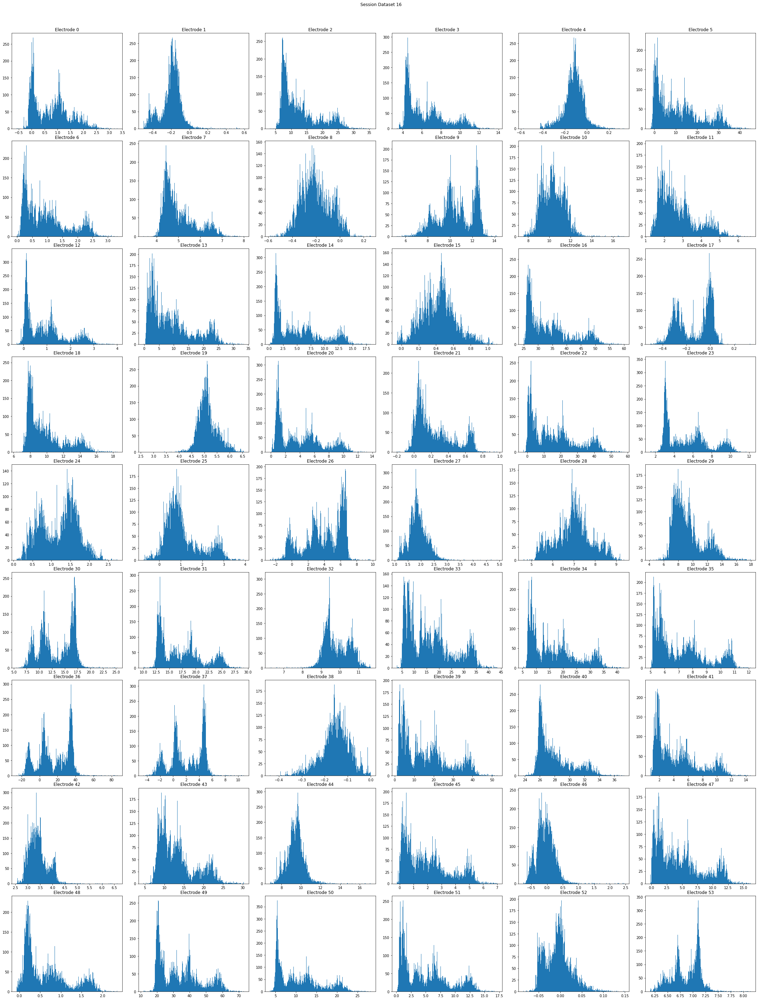

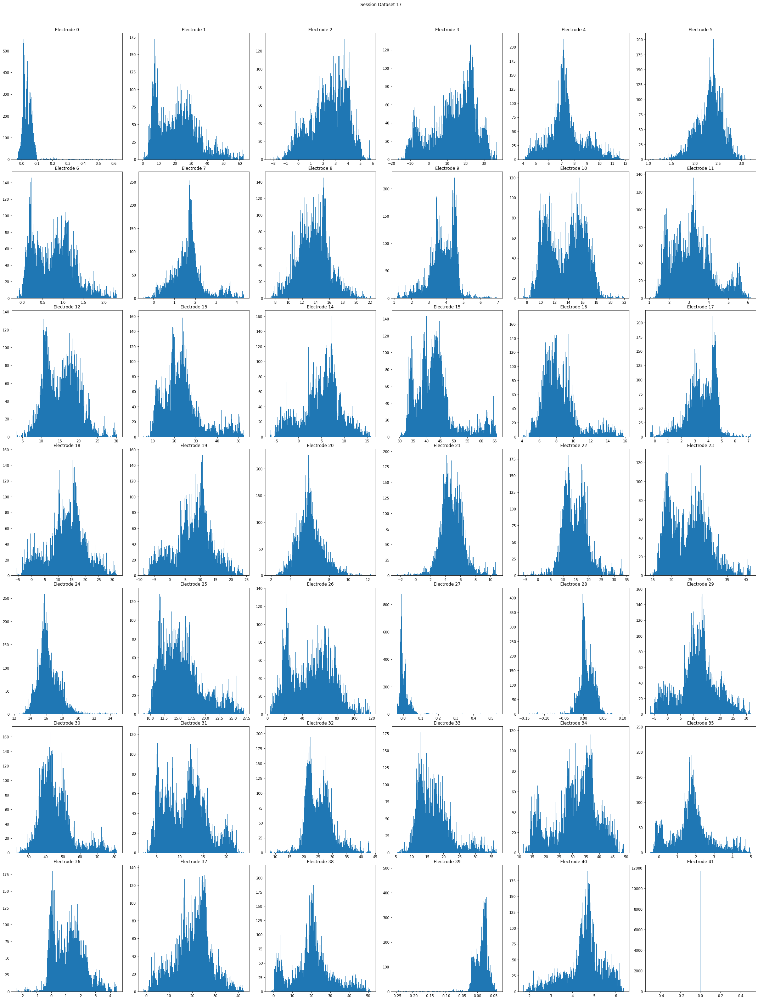

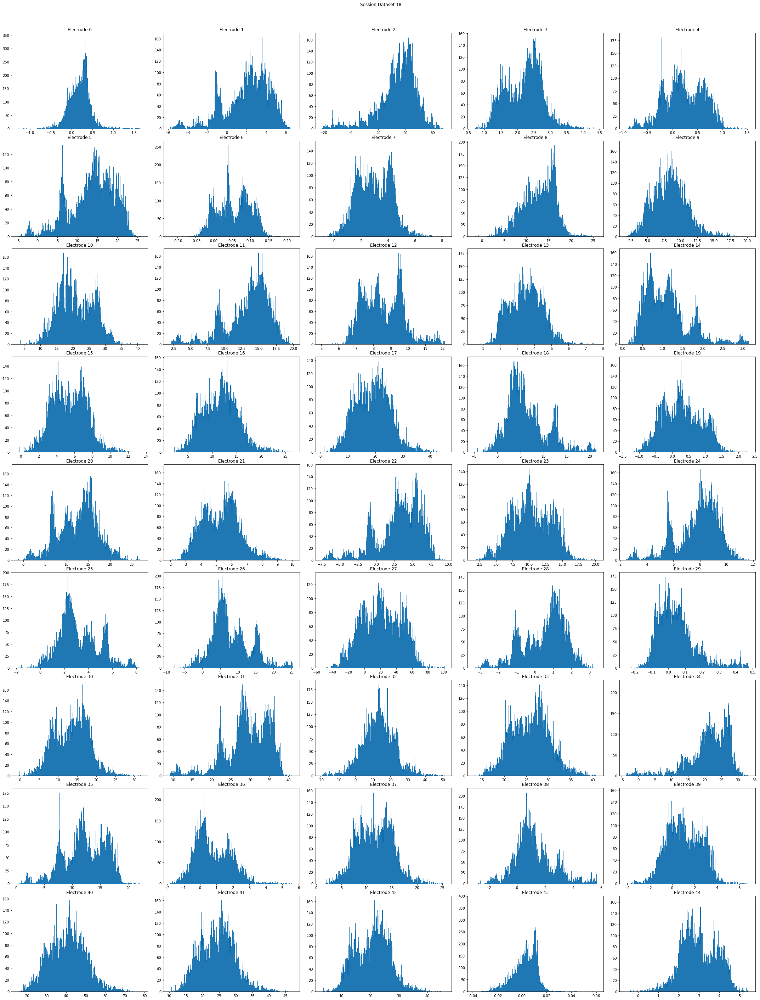

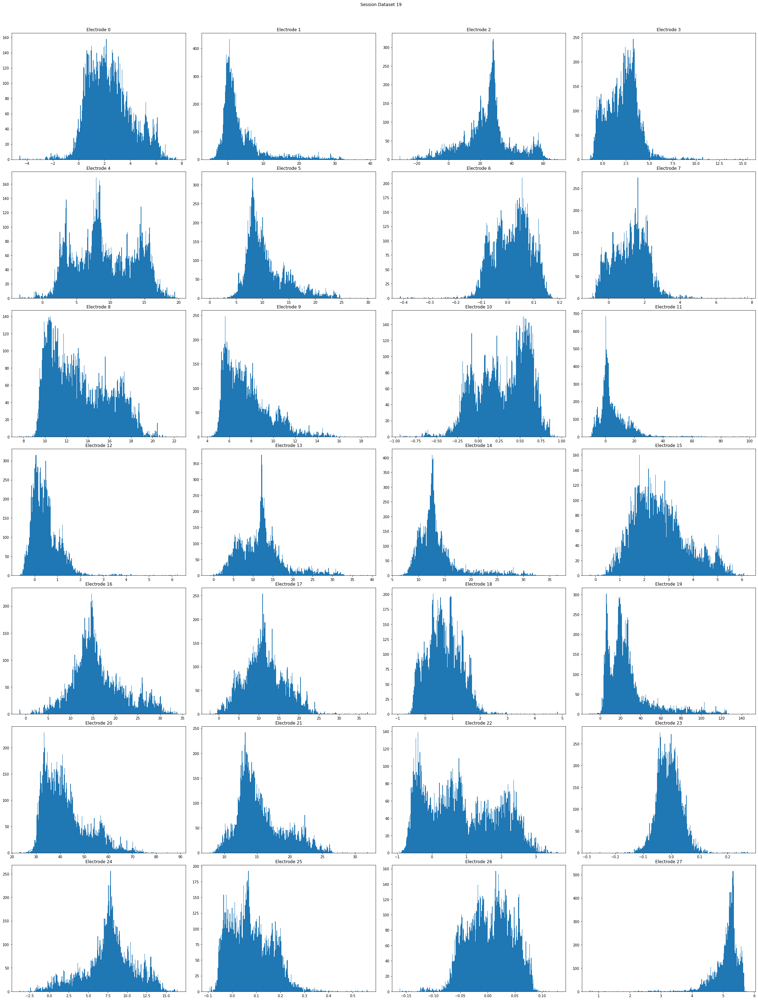

In [ ]:
hist_shapes_list = [(9,6),(7,6),(9,5),(7,4)]
for i, session_dataset in enumerate(sessions_dataset_list):
    nrows, ncols = hist_shapes_list[i]
    visualize_neuraloutputs_histogram(session_dataset, nrows, ncols)

Session number: 16
Total dataset size: 11305
Number of train instances: 6783, Number of validation instances: 2261, Number of test instances: 2261
Glove Variance PC1: 0.4883, Glove Variance PC2: 0.3716
Neural Variance PC1: 0.9693, Neural Variance PC2: 0.0278


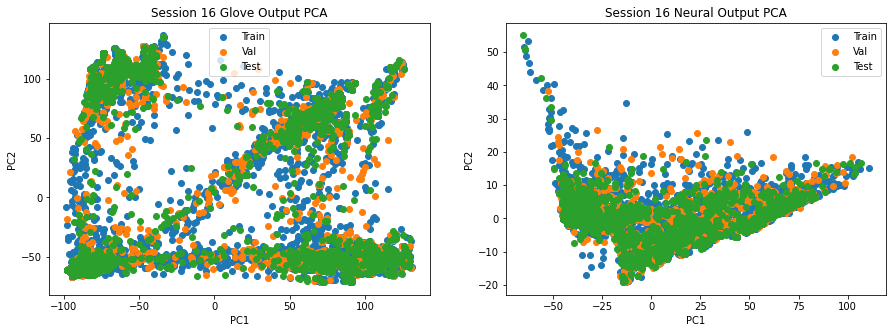



Session number: 17
Total dataset size: 11681
Number of train instances: 7008, Number of validation instances: 2336, Number of test instances: 2337
Glove Variance PC1: 0.4873, Glove Variance PC2: 0.336
Neural Variance PC1: 0.5918, Neural Variance PC2: 0.3706


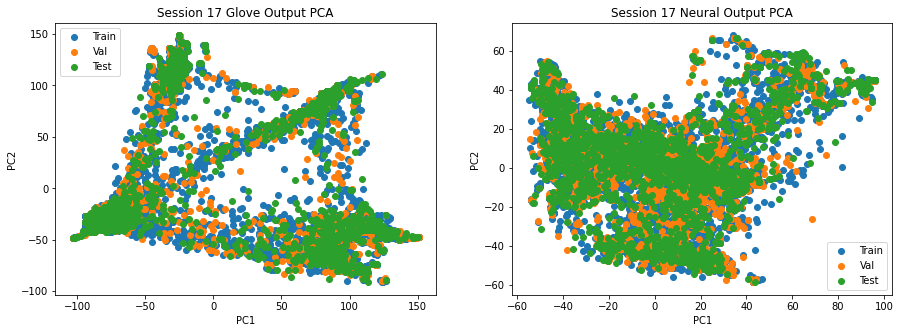



Session number: 18
Total dataset size: 12555
Number of train instances: 7533, Number of validation instances: 2511, Number of test instances: 2511
Glove Variance PC1: 0.5635, Glove Variance PC2: 0.2667
Neural Variance PC1: 0.6667, Neural Variance PC2: 0.2139


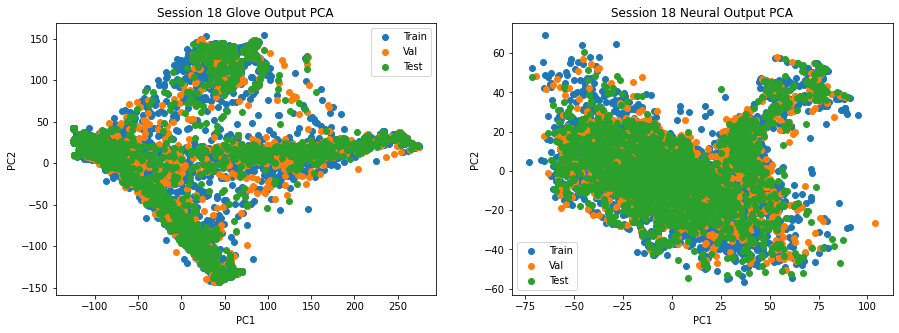



Session number: 19
Total dataset size: 13252
Number of train instances: 7951, Number of validation instances: 2650, Number of test instances: 2651
Glove Variance PC1: 0.4183, Glove Variance PC2: 0.4118
Neural Variance PC1: 0.6151, Neural Variance PC2: 0.2775


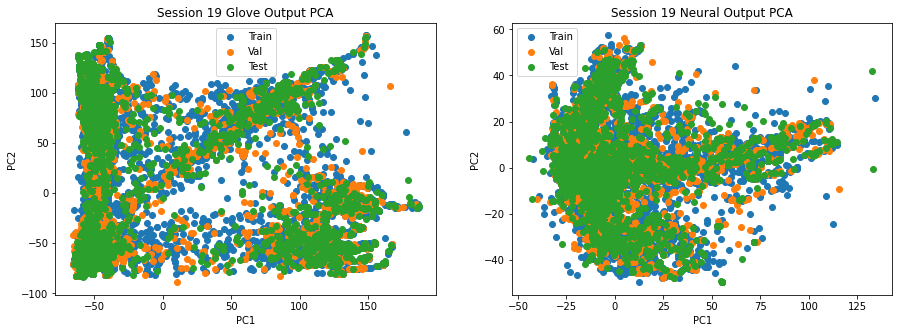

In [17]:
torch.manual_seed(1)

train_loaders_list = []
val_loaders_list = []
test_loaders_list = []
toy_loaders_list = []

train_pca_neural_features = []
val_pca_neural_features = []
test_pca_neural_features = []

train_pca_glove_features = []
val_pca_glove_features = []
test_pca_glove_features = []

# 60/20/20 split for each session
for i, session_dataset in enumerate(sessions_dataset_list):
    num_instances = len(session_dataset)
    train_split = int(num_instances*.6)
    val_split = int(num_instances*.2)

    train_dataset = Subset(session_dataset, np.arange(num_instances)[:train_split])
    val_dataset = Subset(session_dataset, np.arange(num_instances)[train_split:train_split+val_split])
    test_dataset = Subset(session_dataset, np.arange(num_instances)[train_split+val_split:])
    # this is used to make sure the network can achieve zero loss on a single instance
    toy_dataset = Subset(session_dataset, np.arange(num_instances)[:1])

    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, pin_memory=True, sampler=None)
    val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, pin_memory=True)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, pin_memory=True)
    # this is used to make sure the network can achieve zero loss on a single instance
    toy_loader = torch.utils.data.DataLoader(toy_dataset, batch_size=32, pin_memory=True)

    train_loaders_list.append(train_loader)
    val_loaders_list.append(val_loader)
    test_loaders_list.append(test_loader)
    toy_loaders_list.append(toy_loader)

    print('Session number: {}'.format(i+16))
    print('Total dataset size: {}'.format(len(session_dataset)))
    print('Number of train instances: {}, Number of validation instances: {}, Number of test instances: {}'\
          .format(len(train_dataset), len(val_dataset), len(test_dataset)))

    # PCA - visualization
    fig, ax = plt.subplots(nrows = 1, ncols = 2)

    pca_glove = PCA(n_components=2)
    pca_neural = PCA(n_components=2)

    pca_glove_features = pca_glove.fit_transform(session_dataset.gloveinputs)
    pca_neural_features = pca_neural.fit_transform(session_dataset.neuraloutputs)
    
    pca_glove_var = pca_glove.explained_variance_ratio_
    pca_neural_var = pca_neural.explained_variance_ratio_

    pca1_glove_var, pca2_glove_var = round(pca_glove_var[0],4), round(pca_glove_var[1],4)
    pca1_neural_var, pca2_neural_var = round(pca_neural_var[0],4), round(pca_neural_var[1],4)

    print('Glove Variance PC1: {}, Glove Variance PC2: {}'.format(pca1_glove_var, pca2_glove_var))
    print('Neural Variance PC1: {}, Neural Variance PC2: {}'.format(pca1_neural_var, pca2_neural_var))
    
    fig.set_size_inches(15, 5)
    ax[0].scatter(pca_glove_features[:train_split,0], pca_glove_features[:train_split,1], label='Train')
    ax[0].scatter(pca_glove_features[train_split:train_split+val_split,0], pca_glove_features[train_split:train_split+val_split,1], label='Val')
    ax[0].scatter(pca_glove_features[train_split+val_split:,0], pca_glove_features[train_split+val_split:,1], label='Test')

    ax[1].scatter(pca_neural_features[:train_split,0], pca_neural_features[:train_split,1],label='Train')
    ax[1].scatter(pca_neural_features[train_split:train_split+val_split,0], pca_neural_features[train_split:train_split+val_split,1], label='Val')
    ax[1].scatter(pca_neural_features[train_split+val_split:,0], pca_neural_features[train_split+val_split:,1], label='Test')

    ax[0].set_xlabel('PC1')
    ax[0].set_ylabel('PC2')
    ax[1].set_xlabel('PC1')
    ax[1].set_ylabel('PC2')

    ax[0].set_title('Session {} Glove Output PCA'.format(i+16))
    ax[1].set_title('Session {} Neural Output PCA'.format(i+16))

    ax[0].legend()
    ax[1].legend()

    plt.show()

    train_pca_neural_features.append(pca_neural_features[:train_split,:])
    val_pca_neural_features.append((pca_neural_features[train_split:train_split+val_split,:]))
    test_pca_neural_features.append((pca_neural_features[train_split+val_split:,:]))

    train_pca_glove_features.append(pca_glove_features[:train_split,:])
    val_pca_glove_features.append((pca_glove_features[train_split:train_split+val_split,:]))
    test_pca_glove_features.append((pca_glove_features[train_split+val_split:,:]))

    print('\n')

#### Ensure dimensionality of input and output for each dataset makes sense and that the samples are shuffled

In [18]:
for i in range(len(train_loaders_list)): 
    input, target, samplenum, trialnum, session_num  = iter(train_loaders_list[i]).next()
    print('\n') 
    print('Session Number: {}'.format(session_num[0].item()))
    
    print('Object Shapes: ')
    print(input.shape, target.shape, samplenum.shape, trialnum.shape, session_num.shape)
    print('Sample nums in first batch: ')
    print(samplenum)
    print('Trial nums in first batch: ')
    print(trialnum)

AttributeError: ignored

In [ ]:
for i in range(len(toy_loaders_list)):    
    input, target, trialnum, samplenum, session_num = iter(toy_loaders_list[i]).next()
    print(input.shape, target.shape, trialnum.shape, samplenum.shape, session_num.shape)

torch.Size([1, 19]) torch.Size([1, 54]) torch.Size([1]) torch.Size([1]) torch.Size([1])
torch.Size([1, 19]) torch.Size([1, 41]) torch.Size([1]) torch.Size([1]) torch.Size([1])
torch.Size([1, 19]) torch.Size([1, 45]) torch.Size([1]) torch.Size([1]) torch.Size([1])
torch.Size([1, 19]) torch.Size([1, 28]) torch.Size([1]) torch.Size([1]) torch.Size([1])


# Build Model

In [ ]:
class FCNet(torch.nn.Module):
    def __init__(self, input_dim, output_dim, num_layers, hidden_layer_dim):
        super(FCNet, self).__init__()
        self.net = nn.ModuleList()
        assert num_layers >= 2
        self.num_layers = num_layers
        self.hidden_layer_dim = hidden_layer_dim

        if type(hidden_layer_dim == int):
            # input layer
            self.net.append(nn.Linear(input_dim, hidden_layer_dim))
            self.net.append(nn.ReLU())
            # hidden layers
            for i in range(num_layers-2):
                self.net.append(nn.Linear(hidden_layer_dim, hidden_layer_dim))
                self.net.append(nn.ReLU())
            # output layer
            self.net.append(nn.Linear(hidden_layer_dim, output_dim))
        
        elif type(hidden_layer_dim == list):
            assert len(hidden_layer_dim) == num_layers-1

            self.net.append(nn.Linear(input_dim, hidden_layer_dim[0]))
            self.net.append(nn.ReLU())
            for i in range(len(hidden_layer_dim)-1):
                self.net.append(nn.Linear(hidden_layer_dim[i], hidden_layer_dim[i+1]))
                self.net.append(nn.ReLU())
            self.net.append(nn.Linear(hidden_layer_dim[-1], output_dim))
    
    def forward(self, x):
        for layer in self.net:
            x = layer(x)
        return(x)

In [ ]:
def train(loader, model, optimizer, criterion):
    model.train()
    batch_losses = []
    # gloveinput, neuraloutput, samplenum, trialnum, self.session_num
    for i, (input, target, samplenum, trialnum, session_num) in enumerate(loader):
        input = input.to(device, dtype=torch.float)
        target = target.to(device, dtype=torch.float)
        optimizer.zero_grad()
        pred = model(input)

        loss = criterion(pred, target)  # calculate loss
        mean_batch_loss = loss.item()
        batch_losses.append(mean_batch_loss)

        loss.backward()  # one backward pass
        optimizer.step()  # update the parameters

    avg_loss_epoch = sum(batch_losses)/len(batch_losses)
    return(avg_loss_epoch)

def test(loader, model, optimizer, criterion):
    model.eval()
    batch_losses = []

    with torch.no_grad():
        for i, (input, target, samplenum, trialnum, session_num) in enumerate(loader):
            input = input.to(device, dtype=torch.float)
            target = target.to(device, dtype=torch.float)
            pred = model(input)

            loss = criterion(pred, target)  
            mean_batch_loss = loss.item()
            batch_losses.append(mean_batch_loss)

    avg_loss_epoch = sum(batch_losses)/len(batch_losses)
    return(avg_loss_epoch)

def get_instance_losses(loader, model, criterion = torch.nn.MSELoss(reduction='none')):
    model.eval()
    inputs = []
    targets = []
    preds = []
    trialnums = []
    samplenums = []
    losses = []

    with torch.no_grad():
        for i, (input, target, samplenum, trialnum, session_num) in enumerate(loader):
            input = input.to(device, dtype=torch.float)
            target = target.to(device, dtype=torch.float)

            pred = model(input)
            all_losses_batch = criterion(pred, target)  # calculate loss
            all_losses_batch = all_losses_batch.detach().cpu().data.numpy()
            
            inputs.append(input.cpu().data.numpy())
            targets.append(target.cpu().data.numpy())
            preds.append(pred)
            samplenums.append(samplenum.cpu().data.numpy())
            trialnums.append(trialnum.cpu().data.numpy())
            losses.append(all_losses_batch)


    all_inputs = np.vstack(inputs)
    all_targets = np.vstack(targets)
    all_preds = np.vstack(preds)
    all_samplenums = np.hstack(samplenums)
    all_trialnums = np.hstack(trialnums)
    session_num = session_num[0].item()

    all_losses = np.vstack(losses)
    all_losses = np.mean(all_losses, axis = 1)
    all_data = [all_losses, all_inputs, all_targets, all_preds, all_samplenums, all_trialnums, session_num]
    return(all_data)

# Demonstrate the model can produce 0 loss on single training instance

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
m = FCNet(input_dim = 19, output_dim=neuraloutputs_shapes_list[0], num_layers = 3, hidden_layer_dim = 32)
torch.save(m.state_dict(), 'test.pth')

In [ ]:
loaded_m = FCNet(input_dim = 19, output_dim=neuraloutputs_shapes_list[0], num_layers = 3, hidden_layer_dim = 32)
loaded_m.load_state_dict(torch.load('test.pth'))

<All keys matched successfully>

Epoch: 000, LR: 0.010000, Train Loss: 206.2429352
Epoch: 050, LR: 0.010000, Train Loss: 0.1149052
Epoch: 100, LR: 0.010000, Train Loss: 0.0007723
Epoch: 150, LR: 0.010000, Train Loss: 0.0000036
Epoch: 200, LR: 0.010000, Train Loss: 0.0000000
Epoch: 250, LR: 0.010000, Train Loss: 0.0000000
Epoch: 300, LR: 0.010000, Train Loss: 0.0000000


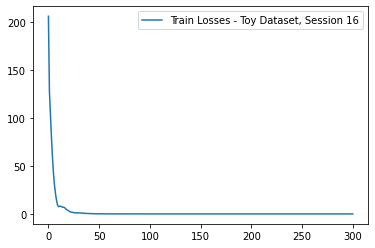

Epoch: 000, LR: 0.010000, Train Loss: 261.4457703
Epoch: 050, LR: 0.010000, Train Loss: 0.0748737
Epoch: 100, LR: 0.010000, Train Loss: 0.0005458
Epoch: 150, LR: 0.010000, Train Loss: 0.0000021
Epoch: 200, LR: 0.010000, Train Loss: 0.0000000
Epoch: 250, LR: 0.010000, Train Loss: 0.0000000
Epoch: 300, LR: 0.010000, Train Loss: 0.0000000


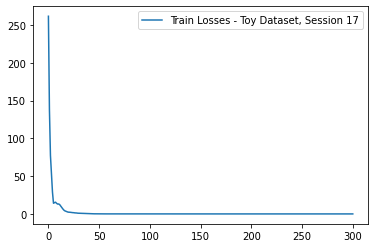

Epoch: 000, LR: 0.010000, Train Loss: 477.8872070
Epoch: 050, LR: 0.010000, Train Loss: 0.1678329
Epoch: 100, LR: 0.010000, Train Loss: 0.0008559
Epoch: 150, LR: 0.010000, Train Loss: 0.0000055
Epoch: 200, LR: 0.010000, Train Loss: 0.0000000
Epoch: 250, LR: 0.010000, Train Loss: 0.0000000
Epoch: 300, LR: 0.010000, Train Loss: 0.0000000


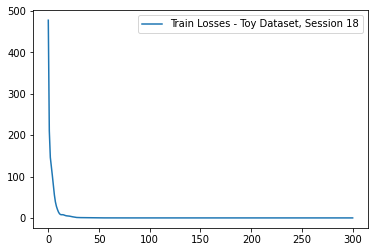

Epoch: 000, LR: 0.010000, Train Loss: 244.6948547
Epoch: 050, LR: 0.010000, Train Loss: 0.0572146
Epoch: 100, LR: 0.010000, Train Loss: 0.0005051
Epoch: 150, LR: 0.010000, Train Loss: 0.0000026
Epoch: 200, LR: 0.010000, Train Loss: 0.0000000
Epoch: 250, LR: 0.010000, Train Loss: 0.0392356
Epoch: 300, LR: 0.010000, Train Loss: 0.0002654


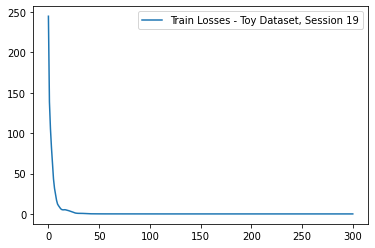

In [ ]:
for i in range(len(toy_loaders_list)):
    model = FCNet(input_dim = 19, output_dim=neuraloutputs_shapes_list[i], num_layers = 3, hidden_layer_dim = 32).to(device)
    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.7, patience=5, min_lr=0.00001)   

    train_losses = []

    for epoch in range(301):
        # torch.cuda.empty_cache()
        lr = scheduler.optimizer.param_groups[0]['lr']
        train_loss = train(toy_loaders_list[i], model, optimizer, criterion)
        if epoch % 50 ==0:
            print('Epoch: {:03d}, LR: {:7f}, Train Loss: {:.7f}'\
                  .format(epoch, lr, train_loss))

        train_losses.append(train_loss)

    plt.plot(train_losses)
    plt.legend(['Train Losses - Toy Dataset, Session {}'.format(i+16)])
    plt.show()

# Train and Test Models

Session Number: 16
Model Number: 0
Num Layers: 3, Hidden Layer Dimensionality: 32, Total Parameters: 3478
Epoch: 000, LR: 0.010000, Train Loss: 13.5363894, Val Loss: 4.9215758, Test Loss: 4.5691277
Epoch: 050, LR: 0.007000, Train Loss: 2.5362622, Val Loss: 2.5501865, Test Loss: 2.2311857
Epoch: 100, LR: 0.000824, Train Loss: 2.0536387, Val Loss: 2.1930326, Test Loss: 1.8673215
Epoch: 150, LR: 0.000824, Train Loss: 2.0225412, Val Loss: 2.1794826, Test Loss: 1.8574461
Epoch: 200, LR: 0.000576, Train Loss: 1.9863986, Val Loss: 2.1603353, Test Loss: 1.8367137
Epoch: 250, LR: 0.000576, Train Loss: 1.9729654, Val Loss: 2.1537880, Test Loss: 1.8279676
Epoch: 300, LR: 0.000198, Train Loss: 1.9303719, Val Loss: 2.1477107, Test Loss: 1.8151224


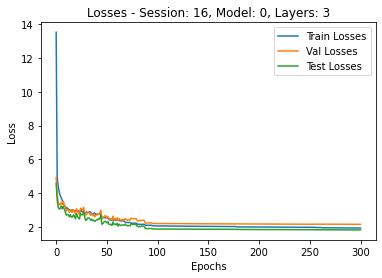

Model Number: 1
Num Layers: 4, Hidden Layer Dimensionality: 32, Total Parameters: 4534
Epoch: 000, LR: 0.010000, Train Loss: 14.4602605, Val Loss: 6.1118113, Test Loss: 5.9268318
Epoch: 050, LR: 0.003430, Train Loss: 2.1920595, Val Loss: 2.1749368, Test Loss: 1.9688544
Epoch: 100, LR: 0.001176, Train Loss: 1.8464577, Val Loss: 2.0143628, Test Loss: 1.7297235
Epoch: 150, LR: 0.000404, Train Loss: 1.6221332, Val Loss: 1.8310137, Test Loss: 1.5401869
Epoch: 200, LR: 0.000282, Train Loss: 1.5723795, Val Loss: 1.7959081, Test Loss: 1.5232173
Epoch: 250, LR: 0.000097, Train Loss: 1.5341564, Val Loss: 1.7704782, Test Loss: 1.5024998
Epoch: 300, LR: 0.000047, Train Loss: 1.5217665, Val Loss: 1.7529021, Test Loss: 1.4882816


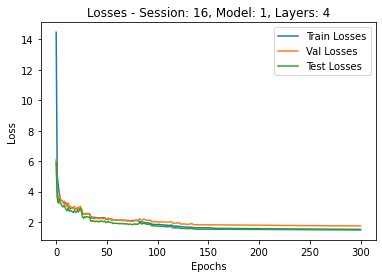

Model Number: 2
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5590
Epoch: 000, LR: 0.010000, Train Loss: 18.3018203, Val Loss: 10.3938281, Test Loss: 10.1113933
Epoch: 050, LR: 0.003430, Train Loss: 2.0686202, Val Loss: 2.4149941, Test Loss: 2.0285066
Epoch: 100, LR: 0.000824, Train Loss: 1.6872623, Val Loss: 2.1254039, Test Loss: 1.6904238
Epoch: 150, LR: 0.000576, Train Loss: 1.5654424, Val Loss: 2.0017709, Test Loss: 1.5881067
Epoch: 200, LR: 0.000576, Train Loss: 1.5065541, Val Loss: 1.9096774, Test Loss: 1.5304778
Epoch: 250, LR: 0.000282, Train Loss: 1.4173854, Val Loss: 1.8417610, Test Loss: 1.4500053
Epoch: 300, LR: 0.000138, Train Loss: 1.3692578, Val Loss: 1.7962833, Test Loss: 1.4087367


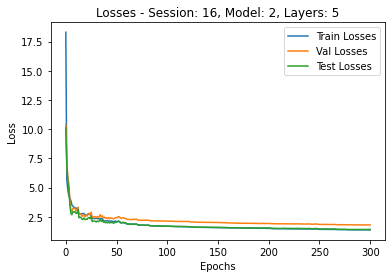

Model Number: 3
Num Layers: 6, Hidden Layer Dimensionality: 32, Total Parameters: 6646
Epoch: 000, LR: 0.010000, Train Loss: 12.4806915, Val Loss: 4.1488190, Test Loss: 3.8211426
Epoch: 050, LR: 0.003430, Train Loss: 2.0880063, Val Loss: 2.2198133, Test Loss: 1.8671742
Epoch: 100, LR: 0.000404, Train Loss: 1.5352485, Val Loss: 1.9226225, Test Loss: 1.5238938
Epoch: 150, LR: 0.000097, Train Loss: 1.4305531, Val Loss: 1.8251927, Test Loss: 1.4479223
Epoch: 200, LR: 0.000023, Train Loss: 1.4046232, Val Loss: 1.8190476, Test Loss: 1.4392805
Epoch: 250, LR: 0.000010, Train Loss: 1.3994442, Val Loss: 1.8192087, Test Loss: 1.4338518
Epoch: 300, LR: 0.000010, Train Loss: 1.3974071, Val Loss: 1.8191186, Test Loss: 1.4320473


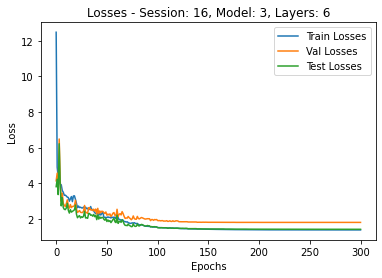

Session Number: 17
Model Number: 0
Num Layers: 3, Hidden Layer Dimensionality: 32, Total Parameters: 3049
Epoch: 000, LR: 0.010000, Train Loss: 24.8705769, Val Loss: 15.5904133, Test Loss: 15.5864289
Epoch: 050, LR: 0.003430, Train Loss: 4.7430828, Val Loss: 4.9705784, Test Loss: 4.7213577
Epoch: 100, LR: 0.001681, Train Loss: 4.2524084, Val Loss: 4.4075396, Test Loss: 4.0708596
Epoch: 150, LR: 0.000282, Train Loss: 3.9354531, Val Loss: 4.2399248, Test Loss: 3.9023497
Epoch: 200, LR: 0.000097, Train Loss: 3.8509106, Val Loss: 3.9663464, Test Loss: 3.6339242
Epoch: 250, LR: 0.000097, Train Loss: 3.8404315, Val Loss: 3.9560153, Test Loss: 3.6246746
Epoch: 300, LR: 0.000097, Train Loss: 3.8318499, Val Loss: 3.9482908, Test Loss: 3.6176594


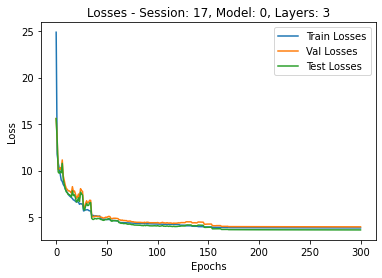

Model Number: 1
Num Layers: 4, Hidden Layer Dimensionality: 32, Total Parameters: 4105
Epoch: 000, LR: 0.010000, Train Loss: 28.3356267, Val Loss: 21.4429382, Test Loss: 20.8859951
Epoch: 050, LR: 0.003430, Train Loss: 4.7109259, Val Loss: 5.9911956, Test Loss: 5.3949416
Epoch: 100, LR: 0.000824, Train Loss: 3.9488097, Val Loss: 4.3448010, Test Loss: 3.9686928
Epoch: 150, LR: 0.000097, Train Loss: 3.6475622, Val Loss: 3.8577941, Test Loss: 3.3570332
Epoch: 200, LR: 0.000047, Train Loss: 3.6170621, Val Loss: 3.8415611, Test Loss: 3.3319340
Epoch: 250, LR: 0.000010, Train Loss: 3.5977624, Val Loss: 3.8359581, Test Loss: 3.3238842
Epoch: 300, LR: 0.000010, Train Loss: 3.5955308, Val Loss: 3.8347899, Test Loss: 3.3223264


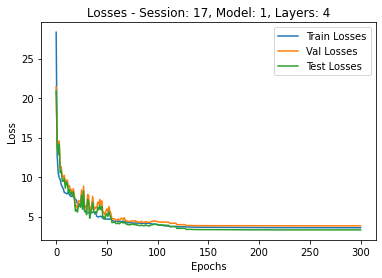

Model Number: 2
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5161
Epoch: 000, LR: 0.010000, Train Loss: 37.8585914, Val Loss: 19.7530761, Test Loss: 19.0114870
Epoch: 050, LR: 0.003430, Train Loss: 4.6007792, Val Loss: 5.6498913, Test Loss: 5.0919524
Epoch: 100, LR: 0.000824, Train Loss: 3.7759076, Val Loss: 4.2550680, Test Loss: 3.8574143
Epoch: 150, LR: 0.000097, Train Loss: 3.4876958, Val Loss: 3.6857465, Test Loss: 3.2873259
Epoch: 200, LR: 0.000047, Train Loss: 3.4550494, Val Loss: 3.6711543, Test Loss: 3.2731900
Epoch: 250, LR: 0.000010, Train Loss: 3.4315830, Val Loss: 3.6641197, Test Loss: 3.2657655
Epoch: 300, LR: 0.000010, Train Loss: 3.4291586, Val Loss: 3.6627730, Test Loss: 3.2645177


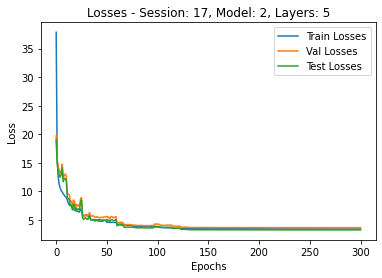

Model Number: 3
Num Layers: 6, Hidden Layer Dimensionality: 32, Total Parameters: 6217
Epoch: 000, LR: 0.010000, Train Loss: 41.8465911, Val Loss: 22.3303257, Test Loss: 21.1660020
Epoch: 050, LR: 0.003430, Train Loss: 4.8663526, Val Loss: 5.3664827, Test Loss: 4.8478470
Epoch: 100, LR: 0.001176, Train Loss: 3.8236296, Val Loss: 4.4670407, Test Loss: 3.9632205
Epoch: 150, LR: 0.000404, Train Loss: 3.4537597, Val Loss: 3.9514524, Test Loss: 3.4707316
Epoch: 200, LR: 0.000068, Train Loss: 3.3209112, Val Loss: 3.6975498, Test Loss: 3.1997689
Epoch: 250, LR: 0.000047, Train Loss: 3.2950063, Val Loss: 3.6788972, Test Loss: 3.1823776
Epoch: 300, LR: 0.000010, Train Loss: 3.2714152, Val Loss: 3.6658879, Test Loss: 3.1690144


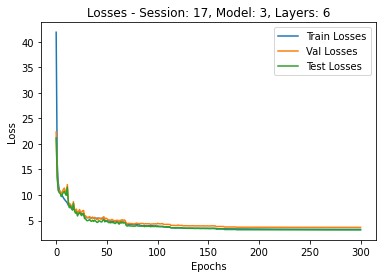

Session Number: 18
Model Number: 0
Num Layers: 3, Hidden Layer Dimensionality: 32, Total Parameters: 3181
Epoch: 000, LR: 0.010000, Train Loss: 20.4011697, Val Loss: 13.4432280, Test Loss: 13.4111833
Epoch: 050, LR: 0.004900, Train Loss: 6.6238225, Val Loss: 7.3306877, Test Loss: 6.8563056
Epoch: 100, LR: 0.000576, Train Loss: 5.9248995, Val Loss: 7.1052235, Test Loss: 6.6296986
Epoch: 150, LR: 0.000282, Train Loss: 5.8538224, Val Loss: 7.0173588, Test Loss: 6.5565142
Epoch: 200, LR: 0.000138, Train Loss: 5.8132120, Val Loss: 6.9727384, Test Loss: 6.5294073
Epoch: 250, LR: 0.000011, Train Loss: 5.7846924, Val Loss: 6.9628849, Test Loss: 6.5332320
Epoch: 300, LR: 0.000010, Train Loss: 5.7836877, Val Loss: 6.9622214, Test Loss: 6.5332431


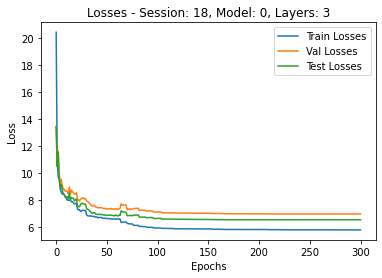

Model Number: 1
Num Layers: 4, Hidden Layer Dimensionality: 32, Total Parameters: 4237
Epoch: 000, LR: 0.010000, Train Loss: 18.8693035, Val Loss: 14.8566597, Test Loss: 14.7850703
Epoch: 050, LR: 0.003430, Train Loss: 5.7109448, Val Loss: 7.0127501, Test Loss: 6.4808495
Epoch: 100, LR: 0.000824, Train Loss: 4.9807995, Val Loss: 6.0396405, Test Loss: 5.8410050
Epoch: 150, LR: 0.000404, Train Loss: 4.7962838, Val Loss: 5.8979141, Test Loss: 5.6923778
Epoch: 200, LR: 0.000198, Train Loss: 4.7008516, Val Loss: 5.7728751, Test Loss: 5.6312189
Epoch: 250, LR: 0.000023, Train Loss: 4.6250838, Val Loss: 5.7235709, Test Loss: 5.5939782
Epoch: 300, LR: 0.000010, Train Loss: 4.6166534, Val Loss: 5.7302406, Test Loss: 5.5904326


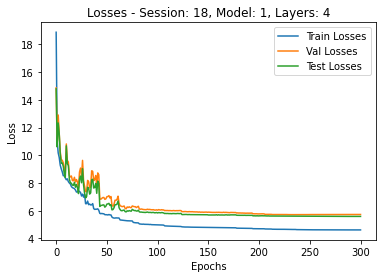

Model Number: 2
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5293
Epoch: 000, LR: 0.010000, Train Loss: 26.6840392, Val Loss: 16.3445069, Test Loss: 16.1070821
Epoch: 050, LR: 0.002401, Train Loss: 5.9171776, Val Loss: 6.9857711, Test Loss: 6.5757634
Epoch: 100, LR: 0.000576, Train Loss: 5.2525444, Val Loss: 6.3747907, Test Loss: 6.0825453
Epoch: 150, LR: 0.000404, Train Loss: 5.1505051, Val Loss: 6.2805678, Test Loss: 6.0395250
Epoch: 200, LR: 0.000033, Train Loss: 5.0365549, Val Loss: 6.2738788, Test Loss: 6.0398296
Epoch: 250, LR: 0.000010, Train Loss: 5.0242894, Val Loss: 6.2718446, Test Loss: 6.0370214
Epoch: 300, LR: 0.000010, Train Loss: 5.0218180, Val Loss: 6.2726441, Test Loss: 6.0354132


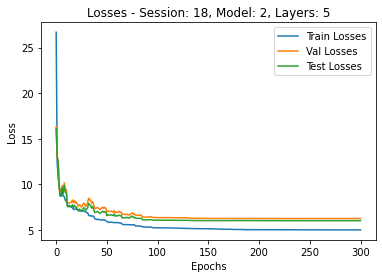

Model Number: 3
Num Layers: 6, Hidden Layer Dimensionality: 32, Total Parameters: 6349
Epoch: 000, LR: 0.010000, Train Loss: 26.5990194, Val Loss: 13.9711302, Test Loss: 13.7328657
Epoch: 050, LR: 0.004900, Train Loss: 6.2795982, Val Loss: 7.5936028, Test Loss: 7.0778254
Epoch: 100, LR: 0.001176, Train Loss: 5.3094853, Val Loss: 6.2352246, Test Loss: 6.0777402
Epoch: 150, LR: 0.000576, Train Loss: 5.0266695, Val Loss: 6.0575918, Test Loss: 5.9498274
Epoch: 200, LR: 0.000047, Train Loss: 4.8840474, Val Loss: 6.0031762, Test Loss: 5.8890861
Epoch: 250, LR: 0.000010, Train Loss: 4.8578026, Val Loss: 5.9853996, Test Loss: 5.8677328
Epoch: 300, LR: 0.000010, Train Loss: 4.8542460, Val Loss: 5.9858897, Test Loss: 5.8664025


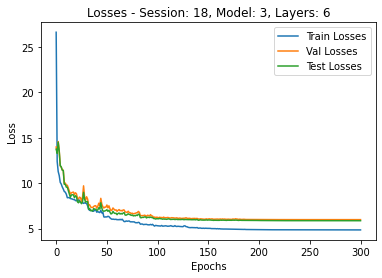

Session Number: 19
Model Number: 0
Num Layers: 3, Hidden Layer Dimensionality: 32, Total Parameters: 2620
Epoch: 000, LR: 0.010000, Train Loss: 26.3363929, Val Loss: 14.8378448, Test Loss: 15.0265451
Epoch: 050, LR: 0.010000, Train Loss: 7.2771034, Val Loss: 6.4167682, Test Loss: 6.5568090
Epoch: 100, LR: 0.003430, Train Loss: 5.5984366, Val Loss: 5.4874770, Test Loss: 5.5102746
Epoch: 150, LR: 0.001176, Train Loss: 5.1972172, Val Loss: 5.2159577, Test Loss: 5.2420575
Epoch: 200, LR: 0.000282, Train Loss: 5.0221199, Val Loss: 5.0872905, Test Loss: 5.1453956
Epoch: 250, LR: 0.000023, Train Loss: 4.9506243, Val Loss: 5.0054125, Test Loss: 5.0567950
Epoch: 300, LR: 0.000010, Train Loss: 4.9454659, Val Loss: 5.0001107, Test Loss: 5.0528933


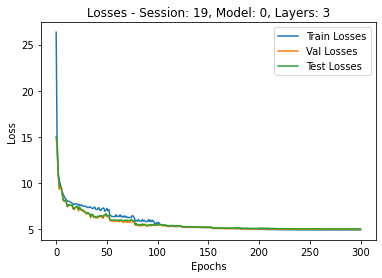

Model Number: 1
Num Layers: 4, Hidden Layer Dimensionality: 32, Total Parameters: 3676
Epoch: 000, LR: 0.010000, Train Loss: 32.8629858, Val Loss: 20.2726477, Test Loss: 20.2724804
Epoch: 050, LR: 0.004900, Train Loss: 6.4766555, Val Loss: 5.8926444, Test Loss: 5.9883174
Epoch: 100, LR: 0.001681, Train Loss: 5.5171596, Val Loss: 5.3694779, Test Loss: 5.5628426
Epoch: 150, LR: 0.000576, Train Loss: 5.1622714, Val Loss: 5.3217137, Test Loss: 5.4468071
Epoch: 200, LR: 0.000033, Train Loss: 4.9535007, Val Loss: 5.1284254, Test Loss: 5.3112698
Epoch: 250, LR: 0.000010, Train Loss: 4.9421617, Val Loss: 5.1205287, Test Loss: 5.3053378
Epoch: 300, LR: 0.000010, Train Loss: 4.9405223, Val Loss: 5.1198156, Test Loss: 5.3054632


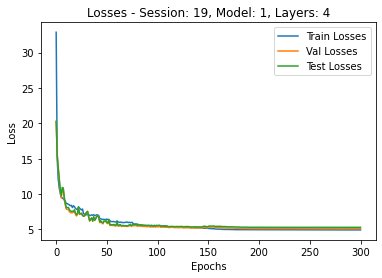

Model Number: 2
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 4732
Epoch: 000, LR: 0.010000, Train Loss: 25.6516593, Val Loss: 18.2230949, Test Loss: 18.4883593
Epoch: 050, LR: 0.003430, Train Loss: 5.7703933, Val Loss: 5.5658608, Test Loss: 5.5946053
Epoch: 100, LR: 0.000824, Train Loss: 4.7972144, Val Loss: 4.9761557, Test Loss: 5.0346277
Epoch: 150, LR: 0.000097, Train Loss: 4.3724842, Val Loss: 4.7351144, Test Loss: 4.7852376
Epoch: 200, LR: 0.000068, Train Loss: 4.3269031, Val Loss: 4.6919362, Test Loss: 4.7276201
Epoch: 250, LR: 0.000010, Train Loss: 4.2918660, Val Loss: 4.6726442, Test Loss: 4.6702209
Epoch: 300, LR: 0.000010, Train Loss: 4.2873588, Val Loss: 4.6742510, Test Loss: 4.6689369


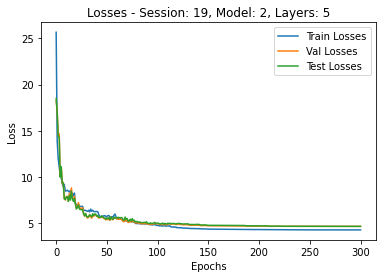

Model Number: 3
Num Layers: 6, Hidden Layer Dimensionality: 32, Total Parameters: 5788
Epoch: 000, LR: 0.010000, Train Loss: 32.5926956, Val Loss: 24.7449230, Test Loss: 25.2853429
Epoch: 050, LR: 0.004900, Train Loss: 6.3260046, Val Loss: 5.9315494, Test Loss: 6.0809970
Epoch: 100, LR: 0.000824, Train Loss: 5.0435888, Val Loss: 5.1735017, Test Loss: 5.1390074
Epoch: 150, LR: 0.000198, Train Loss: 4.6878722, Val Loss: 4.9169398, Test Loss: 4.9320183
Epoch: 200, LR: 0.000068, Train Loss: 4.6095147, Val Loss: 4.8664691, Test Loss: 4.8913801
Epoch: 250, LR: 0.000010, Train Loss: 4.5786541, Val Loss: 4.8592056, Test Loss: 4.8718489
Epoch: 300, LR: 0.000010, Train Loss: 4.5749748, Val Loss: 4.8579026, Test Loss: 4.8712139


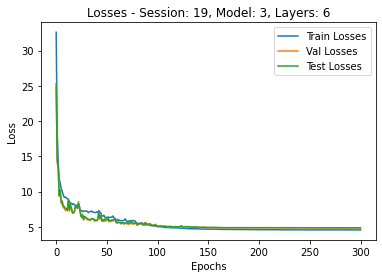

In [ ]:
all_instance_data = []
for j, (train_loader, val_loader, test_loader, output_shape) in enumerate(zip(train_loaders_list, val_loaders_list, test_loaders_list, neuraloutputs_shapes_list)):

    print('Session Number: {}'.format(j+16))

    models_list = [FCNet(input_dim = 19, output_dim=output_shape, num_layers = 3, hidden_layer_dim = 32).to(device),\
                  FCNet(input_dim = 19, output_dim=output_shape, num_layers = 4, hidden_layer_dim = 32).to(device),\
                  FCNet(input_dim = 19, output_dim=output_shape, num_layers = 5, hidden_layer_dim = 32).to(device),\
                  FCNet(input_dim = 19, output_dim=output_shape, num_layers = 6, hidden_layer_dim = 32).to(device)]

    model_instance_data = []
    for i, model in enumerate(models_list):
        criterion = torch.nn.MSELoss()
        optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.7, patience=5, min_lr=0.00001)   
        total_params = sum(p.numel() for p in model.parameters())

        print('Model Number: {}'.format(i))
        print('Num Layers: {}, Hidden Layer Dimensionality: {}, Total Parameters: {}'\
            .format(model.num_layers, model.hidden_layer_dim, total_params))

        train_losses = []
        val_losses = []
        test_losses = []
        for epoch in range(301):
            # torch.cuda.empty_cache()
            lr = scheduler.optimizer.param_groups[0]['lr']
            train_loss = train(train_loader, model, optimizer, criterion)
            val_loss = test(val_loader, model, optimizer, criterion)
            scheduler.step(val_loss)
            test_loss = test(test_loader, model, optimizer, criterion)
            if epoch % 50==0:
                print('Epoch: {:03d}, LR: {:7f}, Train Loss: {:.7f}, Val Loss: {:.7f}, Test Loss: {:.7f}'\
                      .format(epoch, lr, train_loss, val_loss, test_loss))

            train_losses.append(train_loss)
            val_losses.append(val_loss)
            test_losses.append(test_loss)

        # get the losses for each sample after training is done
        x = get_instance_losses(train_loader, model)
        instance_data = [get_instance_losses(train_loader, model),\
                                get_instance_losses(val_loader, model),\
                                get_instance_losses(test_loader, model)]
        model_instance_data.append(instance_data)

        plt.plot(train_losses)
        plt.plot(val_losses)
        plt.plot(test_losses)
        plt.title('Losses - Session: {}, Model: {}, Layers: {}'.format(j+16, i, model.num_layers))
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend(['Train Losses', 'Val Losses', 'Test Losses'])
        plt.show()

        # save model
        directory = '/content/drive/My Drive/Miller_Lab/FIU/MLP/'
        model_name = 'session{}_model{}_layers{}.pth'.format(j+16, i, model.num_layers)
        torch.save(model.state_dict(), directory+model_name)

    all_instance_data.append(model_instance_data)

In [ ]:
# Histogram, Boxplot, and PCA - Error Visualization
for j in range(4): #iterate through sessions
    for i in range(4): #iterate through models
        pca_neural_features = [train_pca_neural_features[j], val_pca_neural_features[j], test_pca_neural_features[j]]
        pca_glove_features = [train_pca_glove_features[j], val_pca_glove_features[j], test_pca_glove_features[j]]
        labels = ['Train', 'Val', 'Test']
        fig, ax = plt.subplots(nrows = 5, ncols = 3)
        fig.set_size_inches(20, 25)
        instance_losses = all_instance_data[j][i]
        for k in range(3):
            ax[0][k].hist(instance_losses[k][0], bins = 300, label = labels[k])
            ax[0][k].set_title('Error Distribution - Session: {}, Model: {}, Layers: {}'.format(j+16, i, i+3))
            ax[0][k].legend()
            
            bp1 = ax[1][k].boxplot(instance_losses[k][0], vert = False)
            fliers = bp1['fliers'][0].get_xdata()
            ax[1][k].set_title('Error Boxplot - Session: {}, Model: {}, Layers: {}'.format(j+16, i, i+3))

            bp2 = ax[2][k].boxplot(instance_losses[k][0], vert = False, showfliers=False)
            for el in ['medians', 'caps', 'whiskers']:
                for line in bp2[el]:
                    (x_l, y),(x_r, _) = line.get_xydata()
                    x_center = (x_r+x_l)/2
                    if el == 'caps':
                      ax[2][k].text(x_l, y-0.1, '%.3f' % x_l)
                    else:
                      ax[2][k].text(x_l, y, '%.3f' % x_l)
            ax[2][k].set_title('Error Boxplot - Session: {}, Model: {}, Layers: {}'.format(j+16, i, i+3))

            # reorder pca features so highest losses occur on top
            r = instance_losses[k][0].reshape(instance_losses[k][0].shape[0], 1)
            neural_data = np.concatenate((pca_neural_features[k],r), axis=1)
            neural_data_sorted = neural_data[neural_data[:, 2].argsort()]

            ax[3][k].scatter(neural_data_sorted[:,0], neural_data_sorted[:,1], c=neural_data_sorted[:,2], cmap='jet', label = labels[k])
            ax[3][k].set_xlabel('PC1')
            ax[3][k].set_ylabel('PC2')
            ax[3][k].set_title('Neural Output PCA - Session: {}, Model: {}, Layers: {}'.format(j+16, i, i+3))
            ax[3][k].legend()
            
            glove_data = np.concatenate((pca_glove_features[k],r), axis=1)
            glove_data_sorted = glove_data[glove_data[:, 2].argsort()]

            ax[4][k].scatter(glove_data_sorted[:,0], glove_data_sorted[:,1], c=glove_data_sorted[:,2], cmap='jet', label = labels[k])
            ax[4][k].set_xlabel('PC1')
            ax[4][k].set_ylabel('PC2')
            ax[4][k].set_title('Glove Input PCA - Session: {}, Model: {}, Layers: {}'.format(j+16, i, i+3))
            ax[4][k].legend()
            
        plt.show()

Does closeness in input space correspond to closeness in output space?

- Find Euclidiean distance between all points in input space
- Do same for output space
- This should produce n^2 distances
- Find r^2 for each dataset

Session Dataset 16: -15.306738312043151


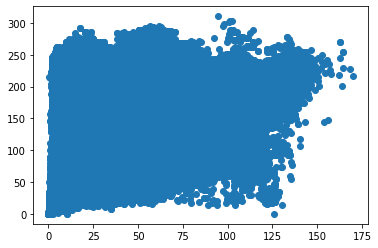

Session Dataset 17: -14.64651068888943


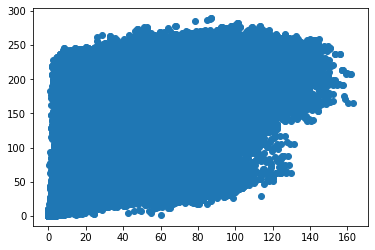

Session Dataset 18: -27.673235118978226


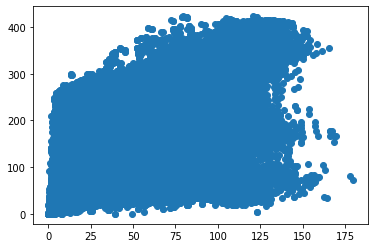

Session Dataset 19: -18.123730101410693


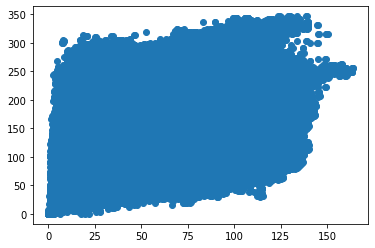

In [ ]:
for j, session_dataset in enumerate(sessions_dataset_list):
    neural_distances = []
    glove_distances = []
    inds = np.random.randint(len(session_dataset.neuraloutputs), size=1000)
    for i in range(len(inds)):
        for k in range(len(inds)-i):
            neural_instance1 = session_dataset.neuraloutputs[inds[i]]
            neural_instance2 = session_dataset.neuraloutputs[inds[i+k]] #+1 is to avoid finding distance between the same points
            glove_instance1 = session_dataset.gloveinputs[inds[i]]
            glove_instance2 = session_dataset.gloveinputs[inds[i+k]] #+1 is to avoid finding distance between the same points
            neural_euc_dist = np.linalg.norm(neural_instance1-neural_instance2)
            glove_euc_dist = np.linalg.norm(glove_instance1-glove_instance2)
            neural_distances.append(neural_euc_dist)
            glove_distances.append(glove_euc_dist)

    r2 = sklearn.metrics.r2_score(np.array(neural_distances),np.array(glove_distances))
    print('Session Dataset {}: {}'.format(j+16, r2))
    plt.scatter(neural_distances,glove_distances)
    plt.show()

# TSNE

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


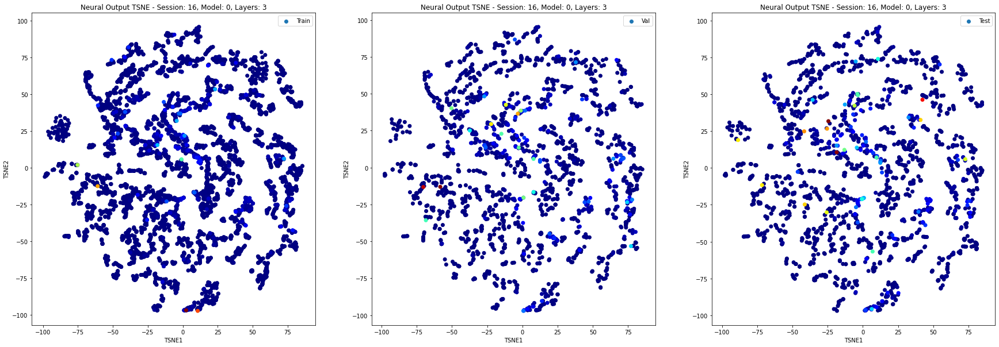

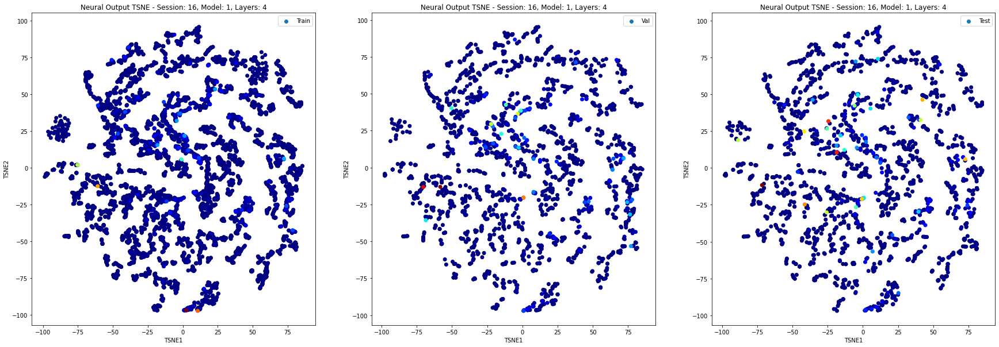

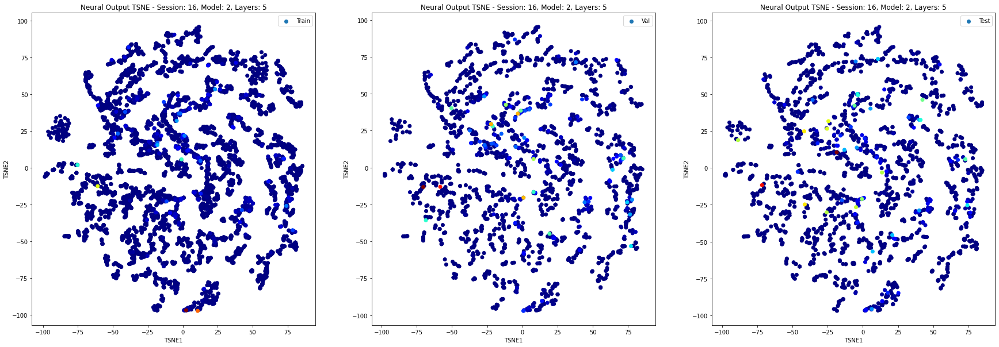

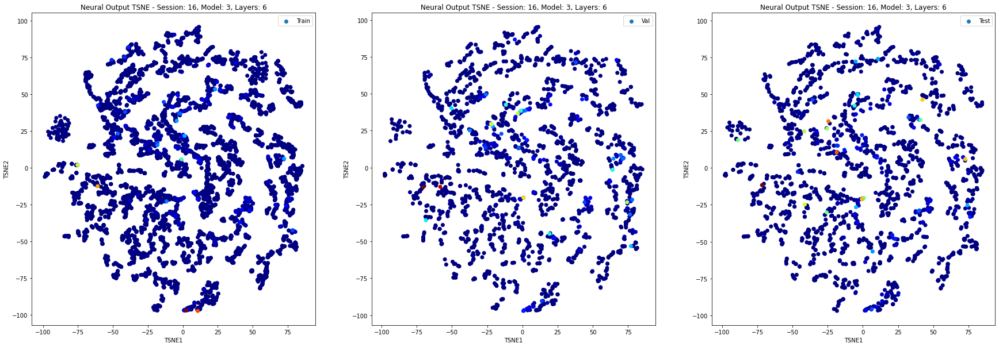

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


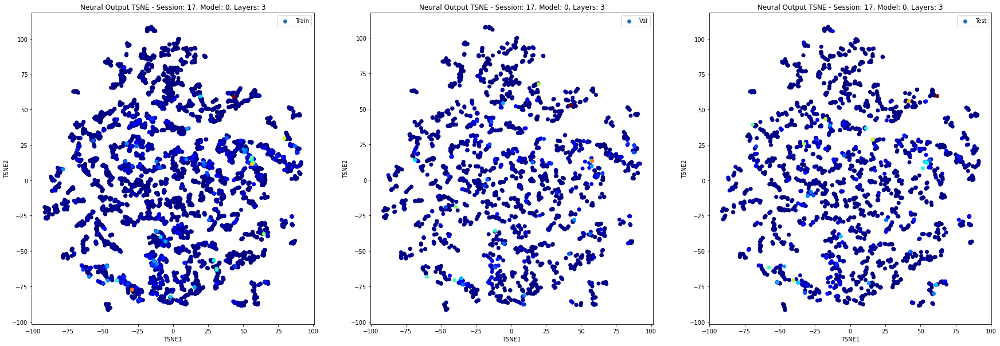

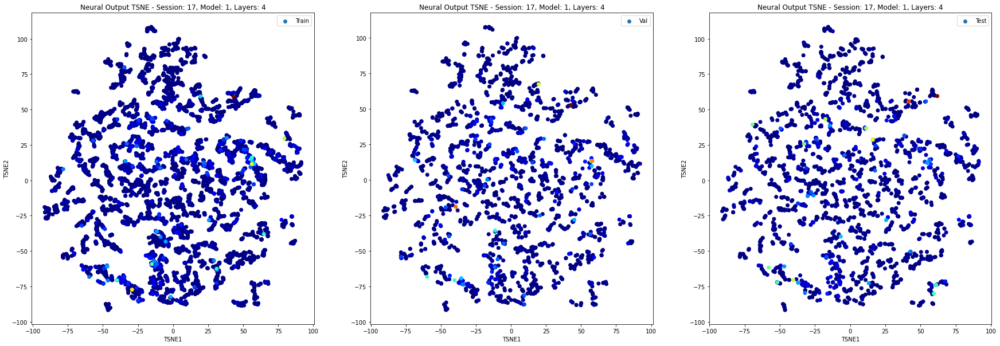

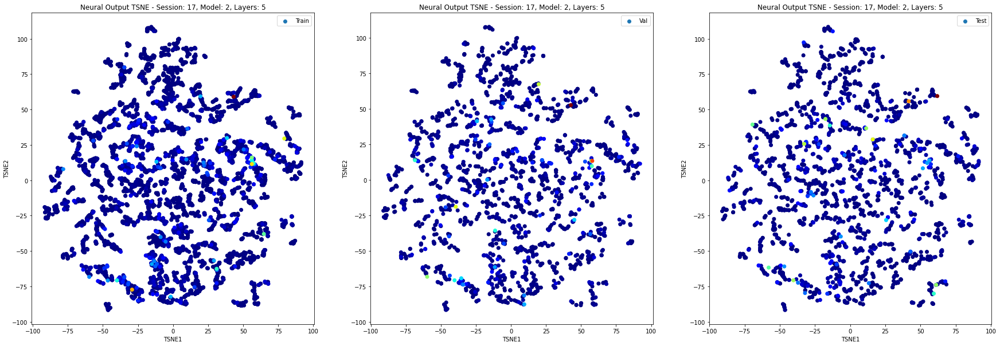

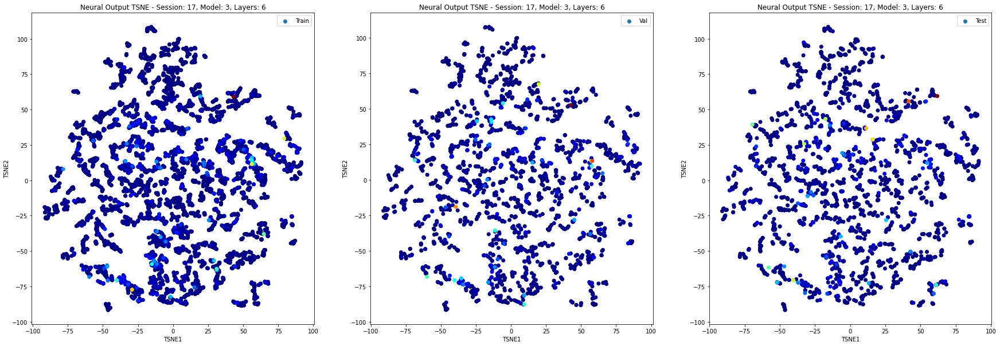

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


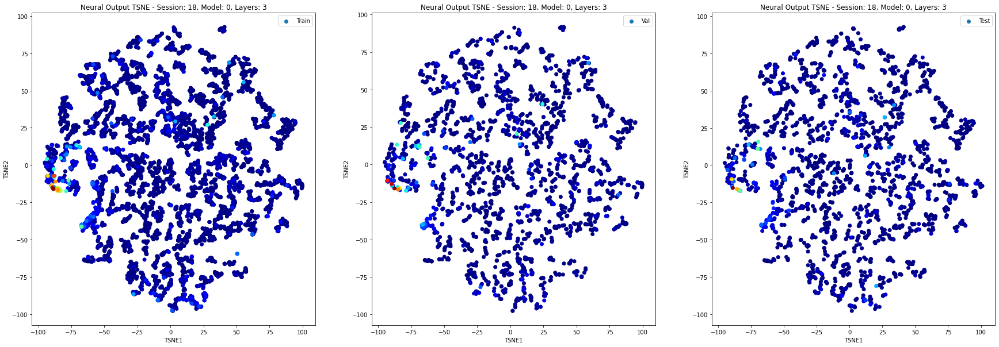

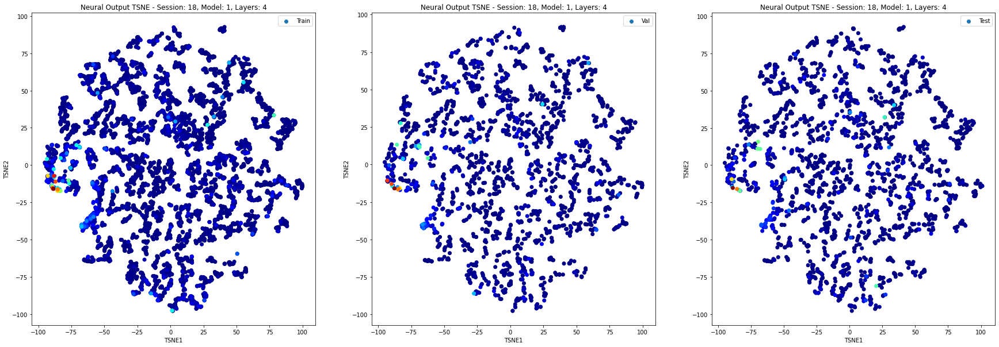

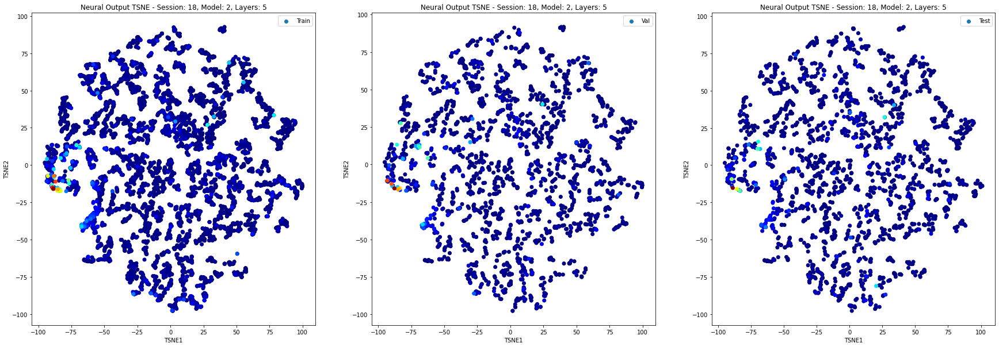

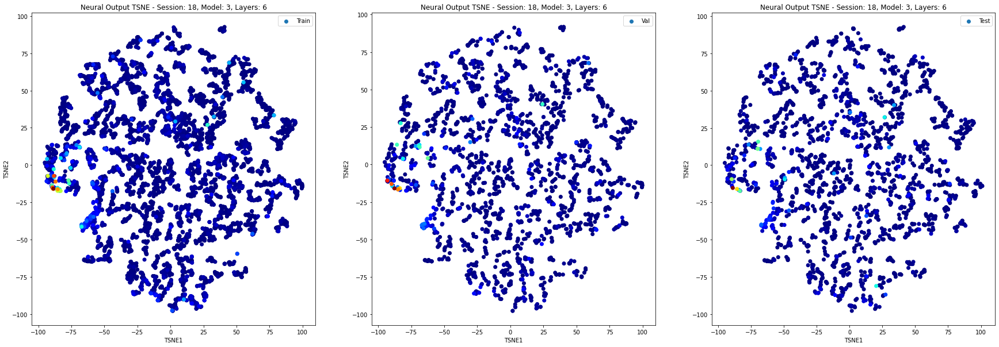

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


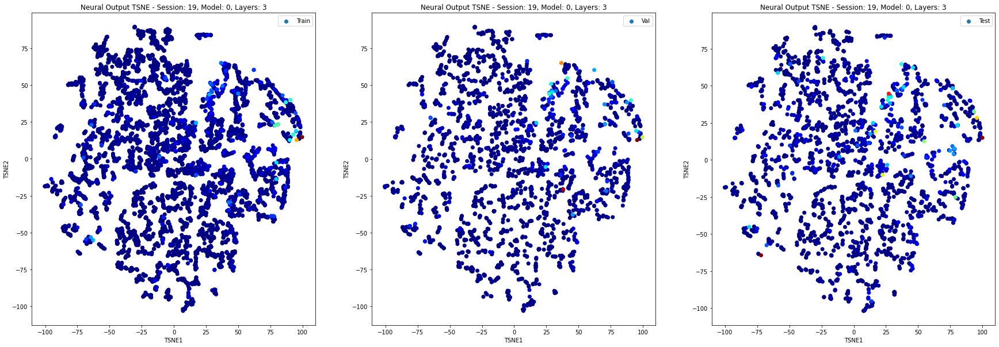

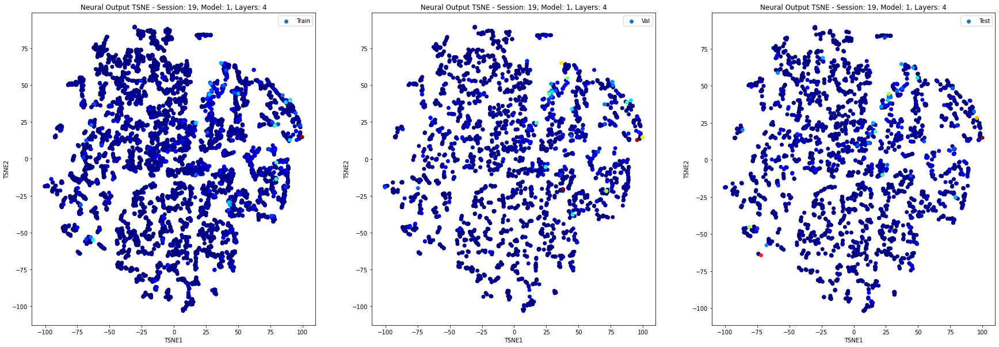

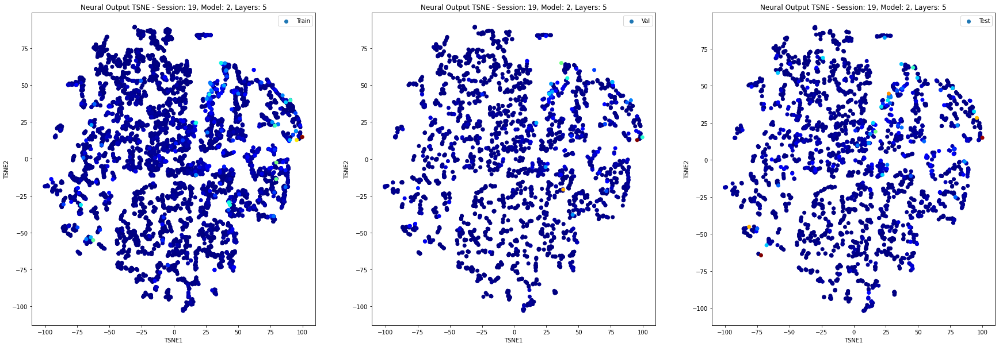

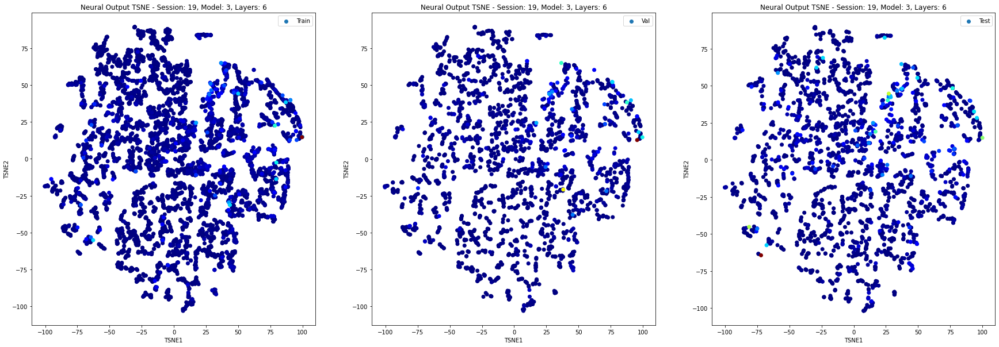

In [ ]:
for j, session_dataset in enumerate(sessions_dataset_list):
    num_instances = len(session_dataset)
    train_split = int(num_instances*.6)
    val_split = int(num_instances*.2)

    tsne = TSNE(n_components = 2)
    tsne_feats = tsne.fit_transform(session_dataset.neuraloutputs)
    tsne_features = [tsne_feats[:train_split,:], tsne_feats[train_split:train_split+val_split,:], tsne_feats[train_split+val_split:,:]]

    for i in range(4):
        labels = ['Train', 'Val', 'Test']
        instance_losses = all_instance_data[j][i]
        fig, ax = plt.subplots(nrows = 1, ncols = 3)
        fig.set_size_inches(30, 10)
        for k in range(3):
            # reorder pca features so highest losses occur on top
            r = instance_losses[k][0].reshape(instance_losses[k][0].shape[0], 1)
            data = np.concatenate((tsne_features[k],r), axis=1)
            data_sorted = data[data[:, 2].argsort()]

            ax[k].scatter(data_sorted[:,0], data_sorted[:,1], c=data_sorted[:,2], cmap='jet', label = labels[k])
            ax[k].set_xlabel('TSNE1')
            ax[k].set_ylabel('TSNE2')
            ax[k].set_title('Neural Output TSNE - Session: {}, Model: {}, Layers: {}'.format(j+16, i, i+3))
            ax[k].legend()
        plt.show()

# UMAP

In [ ]:
for j, session_dataset in enumerate(sessions_dataset_list): #iterate through sessions
    num_instances = len(session_dataset)
    train_split = int(num_instances*.6)
    val_split = int(num_instances*.2)

    umap_reducer = umap.UMAP(random_state=42)
    umap_embeddings = umap_reducer.fit_transform(session_dataset.neuraloutputs)
    umap_ems = [umap_embeddings[:train_split,:], umap_embeddings[train_split:train_split+val_split,:], umap_embeddings[train_split+val_split:,:]]

    for i in range(4): # iterate through models
        labels = ['Train', 'Val', 'Test']
        instance_losses = all_instance_data[j][i]
        fig, ax = plt.subplots(nrows = 1, ncols = 3)
        fig.set_size_inches(30, 10)
        for k in range(3): #plot train, val, test data
            # reorder pca features so highest losses occur on top
            r = instance_losses[k][0].reshape(instance_losses[k][0].shape[0], 1)
            data = np.concatenate((umap_ems[k],r), axis=1)
            data_sorted = data[data[:, 2].argsort()]

            ax[k].scatter(data_sorted[:,0], data_sorted[:,1], c=data_sorted[:,2], cmap='jet', label = labels[k])
            ax[k].set_xlabel('UMAP1')
            ax[k].set_ylabel('UMAP2')
            ax[k].set_title('Neural Output UMAP - Session: {}, Model: {}, Layers: {}'.format(j+16, i, i+3))
            ax[k].legend()
        plt.show()

In [ ]:
# get the top 100 losses for each session

for j, session_dataset in enumerate(sessions_dataset_list): #iterate through sessions
    num_instances = len(session_dataset)
    train_split = int(num_instances*.6)
    val_split = int(num_instances*.2)

    for i in range(4): # iterate through models
        labels = ['Train', 'Val', 'Test']
        instance_data = all_instance_data[j][i]
        for k in range(3): #plot train, val, test data
            # reorder pca features so highest losses occur on top
            print(instance_data[k][0].shape, instance_data[k][1].shape, instance_data[k][2].shape, instance_data[k][3].shape, instance_data[k][4].shape)
            instance_losses = instance_data[k][0].reshape(instance_data[k][0].shape[0], 1)
            instance_inputs = instance_data[k][1]
            instance_targets = instance_data[k][2]
            instance_preds = instance_data[k][3]
            instance_samplenums = instance_data[k][4].reshape(instance_data[k][4].shape[0], 1)
            instance_trialnums = instance_data[k][5].reshape(instance_data[k][5].shape[0], 1)
            session_num = instance_data[k][6]

            instance_losses_r = instance_losses.reshape(instance_losses.shape[0], 1)
            instance_samplenums_r = instance_samplenums.reshape(instance_samplenums.shape[0], 1)
            instance_trialnums_r = instance_trialnums.reshape(instance_trialnums.shape[0], 1)

            data = np.concatenate((instance_losses_r, instance_samplenums_r, instance_trialnums_r), axis=1)
            top_100_losses = data[data[:, 0].argsort()[::-1]][:100,:]
            top_100_losses = top_100_losses[top_100_losses[:, 1].argsort()[::-1]][:100,:]

            print('Top 100 losses for Session {}, Model {}, {} Dataset'.format(session_num, i, labels[k]))
            for l in range(len(top_100_losses)):
              print('Loss Value: {}, Sample Num: {}, Trial Num: {}'\
                      .format(top_100_losses[l][0], top_100_losses[l][1], top_100_losses[l][2]))
                # print('Loss Value: {}, Sample Num: {}, Trial Num: {}'\
                #       .format(top_100_losses[l][0], top_100_losses[l][1], top_100_losses[l][2]))

(6783,) (6783, 19) (6783, 54) (6783, 54) (6783,)
Top 100 losses for Session 16, Model 0, Train Dataset
Loss Value: 32.40071487426758, Sample Num: 10712.0, Trial Num: 151.0
Loss Value: 47.36769104003906, Sample Num: 10711.0, Trial Num: 151.0
Loss Value: 66.76836395263672, Sample Num: 10709.0, Trial Num: 151.0
Loss Value: 27.131681442260742, Sample Num: 10379.0, Trial Num: 145.0
Loss Value: 45.67866897583008, Sample Num: 10377.0, Trial Num: 145.0
Loss Value: 45.62152862548828, Sample Num: 10376.0, Trial Num: 145.0
Loss Value: 150.84017944335938, Sample Num: 10312.0, Trial Num: 145.0
Loss Value: 68.99349212646484, Sample Num: 10131.0, Trial Num: 142.0
Loss Value: 26.304136276245117, Sample Num: 10107.0, Trial Num: 141.0
Loss Value: 23.94358253479004, Sample Num: 9843.0, Trial Num: 138.0
Loss Value: 24.0960693359375, Sample Num: 9700.0, Trial Num: 135.0
Loss Value: 53.527408599853516, Sample Num: 9699.0, Trial Num: 135.0
Loss Value: 25.040605545043945, Sample Num: 9320.0, Trial Num: 127.0


# Load Saved Models and Display r^2 Values

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
neuraloutputs_shapes_list_loading = [54,54,54,54,41,41,41,41,45,45,45,45,28,28,28,28]
layers_loading = [3,4,5,6,3,4,5,6,3,4,5,6,3,4,5,6]
loaded_models_list = []
path = '/content/drive/MyDrive/Miller_Lab/FIU/MLP/'
for shape, layers, filename in zip(neuraloutputs_shapes_list_loading, layers_loading, os.listdir(path)):
    f = os.path.join(path,filename)

    loaded_m = FCNet(input_dim = 19, output_dim=shape, num_layers = layers, hidden_layer_dim = 32)
    loaded_m.load_state_dict(torch.load(f))
    loaded_models_list.append(loaded_m)

In [ ]:
loaded_models_array = np.array(loaded_models_list).reshape((4,4), order='C')

In [ ]:
for m in loaded_models_array[0]:
    print(m.num_layers)

3
4
5
6


In [ ]:
all_instance_data = []
for j, (train_loader, val_loader, test_loader, models_list) in enumerate(zip(train_loaders_list, val_loaders_list, test_loaders_list, loaded_models_array)):

    print('Session Number: {}'.format(j+16))

    model_instance_data = []
    for i, model in enumerate(models_list):

        print('Model Number: {}'.format(i))
        print('Num Layers: {}, Hidden Layer Dimensionality: {}'\
            .format(model.num_layers, model.hidden_layer_dim))

        # get the losses for each sample
        instance_data = [get_instance_losses(train_loader, model),\
                                get_instance_losses(val_loader, model),\
                                get_instance_losses(test_loader, model)]
        model_instance_data.append(instance_data)

    all_instance_data.append(model_instance_data)

Session Number: 16
Model Number: 0
Num Layers: 3, Hidden Layer Dimensionality: 32
Model Number: 1
Num Layers: 4, Hidden Layer Dimensionality: 32
Model Number: 2
Num Layers: 5, Hidden Layer Dimensionality: 32
Model Number: 3
Num Layers: 6, Hidden Layer Dimensionality: 32
Session Number: 17
Model Number: 0
Num Layers: 3, Hidden Layer Dimensionality: 32
Model Number: 1
Num Layers: 4, Hidden Layer Dimensionality: 32
Model Number: 2
Num Layers: 5, Hidden Layer Dimensionality: 32
Model Number: 3
Num Layers: 6, Hidden Layer Dimensionality: 32
Session Number: 18
Model Number: 0
Num Layers: 3, Hidden Layer Dimensionality: 32
Model Number: 1
Num Layers: 4, Hidden Layer Dimensionality: 32
Model Number: 2
Num Layers: 5, Hidden Layer Dimensionality: 32
Model Number: 3
Num Layers: 6, Hidden Layer Dimensionality: 32
Session Number: 19
Model Number: 0
Num Layers: 3, Hidden Layer Dimensionality: 32
Model Number: 1
Num Layers: 4, Hidden Layer Dimensionality: 32
Model Number: 2
Num Layers: 5, Hidden Laye

In [ ]:
for j, session_dataset in enumerate(sessions_dataset_list): #iterate through sessions
    table = np.zeros((4,3))
    for i in range(4): # iterate through models
        labels = ['Train', 'Val', 'Test']
        instance_data = all_instance_data[j][i]
        for k in range(3): #plot train, val, test data
            instance_targets = instance_data[k][2]
            instance_preds = instance_data[k][3]
            session_num = instance_data[k][6]

            r2 = sklearn.metrics.r2_score(instance_targets,instance_preds,multioutput='variance_weighted')
            table[i,k] += r2

    print('Session {} Variance Weighted R^2 Scores'.format(session_dataset.session_num))
    df = pd.DataFrame(table, columns = ['Train','Val','Test'], index = ['3 Layers','4 Layers','5 Layers','6 Layers'])
    display(df)

Session 16 Variance Weighted R^2 Scores


,Train,Val,Test
3 Layers,0.925638,0.917241,0.929038
4 Layers,0.941206,0.932482,0.941653
5 Layers,0.947044,0.930787,0.944705
6 Layers,0.945829,0.929933,0.943716


Session 17 Variance Weighted R^2 Scores


,Train,Val,Test
3 Layers,0.910534,0.906758,0.916190
4 Layers,0.915533,0.909439,0.923115
5 Layers,0.919456,0.913501,0.924727
6 Layers,0.923148,0.913428,0.926432


Session 18 Variance Weighted R^2 Scores


,Train,Val,Test
3 Layers,0.822901,0.786186,0.803011
4 Layers,0.858630,0.823512,0.831072
5 Layers,0.846190,0.807184,0.818297
6 Layers,0.851341,0.816331,0.822963


Session 19 Variance Weighted R^2 Scores


,Train,Val,Test
3 Layers,0.884353,0.878932,0.879464
4 Layers,0.884498,0.875975,0.873474
5 Layers,0.899790,0.886810,0.888645
6 Layers,0.893027,0.882335,0.883822


In [ ]:
len(all_instance_data), len(all_instance_data[0]), len(all_instance_data[0][0]), len(all_instance_data[0][0][0])

(4, 4, 3, 7)

In [ ]:
def visualize_targpreds_histogram(targets, predictions, session_num, fig_suptitle, nrows, ncols):
    fig, ax = plt.subplots(nrows = nrows, ncols = ncols)
    fig.set_size_inches(30, 40)
    fig.suptitle(fig_suptitle)
    fig.tight_layout(pad=1.5)
    fig.subplots_adjust(top=0.95)
    for i in range(nrows*ncols):
        j = math.floor(i/ncols)
        k = i%ncols
        if (session_num == 17) and (i == 41):
            ax[j][k].hist(np.zeros(targets.shape[0]), bins = 300)
        else:
            target_dim_vals = targets[:,i]
            prediction_dim_vals = predictions[:,i]
            assert(target_dim_vals.shape == prediction_dim_vals.shape)
            ax[j][k].hist(target_dim_vals, bins = 300, alpha = 0.4)
            ax[j][k].hist(prediction_dim_vals, bins = 300, alpha = 0.4)
        ax[j][k].set_title('Electrode {}'.format(i))
      
    plt.show()

In [ ]:
# all_data = [all_losses, all_inputs, all_targets, all_preds, all_samplenums, all_trialnums, session_num]
for j in range(4): #iterate through sessions
    nrows, ncols = hist_shapes_list[j]

    i = 2
    labels = ['Train', 'Val', 'Test']
    session_data = all_instance_data[j][i]
    for k in range(3):
        targets = session_data[k][2]
        predictions = session_data[k][3]
        session_num = session_data[k][6]
        assert(predictions.shape == targets.shape)
        print(targets.shape)
        fig_suptitle = 'Target and Prediction Distributions - Session: {}, Model: {}, Layers: {}, {}'\
          .format(j+16, i, i+3, labels[k])

        visualize_targpreds_histogram(targets, predictions, session_num, fig_suptitle, nrows, ncols)

Output hidden; open in https://colab.research.google.com to view.

5 lowest highest for each session and split

In [ ]:
# all_data = [all_losses, all_inputs, all_targets, all_preds, all_samplenums, all_trialnums, session_num]
for j in range(4): #iterate through sessions
    nrows, ncols = hist_shapes_list[j]

    i = 2
    labels = ['Train', 'Val', 'Test']
    session_data = all_instance_data[j][i]
    for k in range(3):
        losses = session_data[k][0].reshape(session_data[k][0].shape[0], 1)
        targets = session_data[k][2]
        s = targets.shape[1]
        print(s)
        predictions = session_data[k][3]
        session_num = session_data[k][6]

        data = np.concatenate((losses, targets, predictions), axis=1)
        top_5_losses = data[data[:, 0].argsort()[::-1]][:5,:]
        t, p = top_5_losses[:,1:(s+1)].reshape((-1, 5)),top_5_losses[:,(s+1):].reshape((-1,5))
        electrodes = np.arange(s)

        for el in range(5):
            print('Loss: {}'.format(top_5_losses[el,0]))
            arr = np.concatenate((t[:,el].reshape((s,1)), p[:,el].reshape((s,1)), np.square(t[:,el]-p[:,el]).reshape((s,1)), electrodes.reshape((s,1))), axis=1)
            df = pd.DataFrame(arr, columns = ['Target','Prediction','Sq. Difference', 'Electrode'])
            df = df.sort_values(by=['Sq. Difference'], ascending=False)
            display(df)

54
Loss: 274.2298278808594


,Target,Prediction,Sq. Difference,Electrode
18,36.491585,-11.862157,2338.084229,18.0
1,36.054237,0.998114,1228.931641,1.0
26,34.040874,2.001326,1026.532593,26.0
53,19.762045,46.648178,722.864136,53.0
51,2.345894,27.591103,637.320557,51.0
14,26.177645,48.411129,494.327820,14.0
39,26.775866,7.339958,377.754486,39.0
10,23.741842,5.689672,325.880829,10.0
50,7.188076,24.792818,309.926941,50.0
22,21.084656,7.873131,174.544388,22.0


Loss: 214.5476837158203


,Target,Prediction,Sq. Difference,Electrode
7,-17.759533,34.798771,2762.375244,7.0
15,0.926750,40.307953,1550.879150,15.0
42,48.214554,20.837860,749.483337,42.0
3,52.786015,27.031979,663.270386,3.0
40,29.093754,4.517693,603.982788,40.0
44,-0.208547,22.232832,503.615417,44.0
28,28.259487,6.926422,455.099670,28.0
39,26.339266,8.530770,317.142487,39.0
11,7.480638,24.431976,287.347931,11.0
24,18.845112,2.140857,279.032104,24.0


Loss: 142.74508666992188


,Target,Prediction,Sq. Difference,Electrode
4,46.689087,1.865928,2009.115479,4.0
50,34.812500,1.110059,1135.854614,50.0
31,51.534382,21.333855,912.071838,31.0
29,32.136486,3.794370,803.275513,29.0
17,5.947231,32.623692,711.633545,17.0
13,1.529675,22.664228,446.669373,13.0
0,28.680540,7.736842,438.638519,0.0
33,22.248371,1.852271,416.000854,33.0
28,28.019638,8.188656,393.267853,28.0
46,25.917196,41.837643,253.460617,46.0


Loss: 122.78490447998047


,Target,Prediction,Sq. Difference,Electrode
39,-4.202909,42.277020,2160.383545,39.0
20,19.567064,57.146732,1412.231323,20.0
18,2.335798,37.392963,1229.005005,18.0
6,36.276699,6.808482,868.375732,6.0
47,0.549970,28.836939,800.152588,47.0
17,7.543757,32.137074,604.831238,17.0
2,26.583948,2.041331,602.340088,2.0
22,25.611366,1.126886,599.489746,22.0
8,25.180525,8.709723,271.287323,8.0
35,42.095158,28.429459,186.751328,35.0


Loss: 109.96331787109375


,Target,Prediction,Sq. Difference,Electrode
9,63.329308,21.101727,1783.168579,9.0
28,-6.630988,35.023899,1735.129761,28.0
7,43.182278,3.651995,1562.643066,7.0
11,-0.050236,30.424543,928.712158,11.0
36,30.670940,2.400080,799.241577,36.0
6,35.505260,8.060063,753.238892,6.0
49,5.927765,24.879314,359.161224,49.0
24,44.503578,27.279400,296.672333,24.0
20,5.339217,20.669979,235.032288,20.0
45,1.107293,16.272350,229.978958,45.0


54
Loss: 341.788330078125


,Target,Prediction,Sq. Difference,Electrode
1,40.824642,1.516458,1545.133423,1.0
18,34.965546,-0.008887,1223.211060,18.0
26,27.234877,2.961505,589.196533,26.0
53,55.500820,33.769897,472.233002,53.0
10,26.217918,5.727516,419.856598,10.0
51,36.300686,16.118948,407.302551,51.0
22,25.525322,7.862799,311.964722,22.0
14,25.848646,42.964455,292.950897,14.0
39,23.543478,8.761221,218.515121,39.0
50,31.197763,16.576252,213.788605,50.0


Loss: 122.77964782714844


,Target,Prediction,Sq. Difference,Electrode
7,-22.907263,33.771828,3212.519531,7.0
15,0.553011,30.469046,894.969116,15.0
3,56.410526,27.061745,861.350952,3.0
42,44.655499,22.403011,495.173187,42.0
40,26.000605,6.254489,389.909119,40.0
44,29.818024,12.314801,306.362823,44.0
24,19.141132,2.807660,266.782349,24.0
28,23.572361,7.898752,245.662018,28.0
6,27.874182,13.258769,213.610291,6.0
10,15.732873,1.170932,212.050125,10.0


Loss: 76.47703552246094


,Target,Prediction,Sq. Difference,Electrode
4,53.169868,2.609828,2556.317627,4.0
50,-7.558825,19.529369,733.770325,50.0
0,31.789433,7.806044,575.202942,0.0
31,42.592510,21.510422,444.454468,31.0
29,25.940058,4.867074,444.070618,29.0
17,6.081890,25.934021,394.107086,17.0
33,20.630125,3.192158,304.082703,33.0
13,1.072343,17.255013,261.878815,13.0
28,23.916828,8.751416,229.989716,28.0
9,14.739697,1.057455,187.203751,9.0


Loss: 75.54352569580078


,Target,Prediction,Sq. Difference,Electrode
6,40.755039,7.576714,1100.801270,6.0
39,2.820824,35.431622,1063.464111,39.0
20,19.665443,48.195248,813.949707,20.0
2,30.216938,2.550258,765.445129,2.0
18,2.415674,28.988901,706.136414,18.0
47,38.829403,15.643596,537.581604,47.0
22,21.946655,1.781726,406.624329,22.0
8,27.879765,9.088202,353.122772,8.0
17,7.220830,25.827423,346.205353,17.0
35,40.571339,28.245514,151.925949,35.0


Loss: 72.18866729736328


,Target,Prediction,Sq. Difference,Electrode
9,68.817139,21.453705,2243.294922,9.0
7,48.223461,4.489004,1912.702881,7.0
6,39.671898,8.551385,968.486389,6.0
11,-0.135139,23.561735,561.541870,11.0
36,27.312637,4.433911,523.436157,36.0
24,43.958908,26.972881,288.525116,24.0
2,17.382812,1.501440,252.217987,2.0
49,31.554802,16.172993,236.600052,49.0
45,22.178904,9.680501,156.210068,45.0
20,5.078724,16.935616,140.585876,20.0


54
Loss: 134.41912841796875


,Target,Prediction,Sq. Difference,Electrode
18,9.401844,35.657349,689.351501,18.0
26,26.729166,1.462203,638.419495,26.0
1,-0.560472,24.108166,608.541687,1.0
53,40.697739,21.333855,374.959991,53.0
51,22.337292,3.794370,343.839935,51.0
14,43.943745,27.974426,255.019135,14.0
39,32.346680,17.874037,209.457397,39.0
50,21.688536,8.188656,182.246750,50.0
10,5.214082,17.338020,146.989883,10.0
35,23.889013,12.293622,134.453094,35.0


Loss: 95.22785186767578


,Target,Prediction,Sq. Difference,Electrode
7,36.247547,-1.507953,1425.477783,7.0
15,30.406315,3.271434,736.301697,15.0
42,57.268219,35.443092,476.336151,42.0
40,38.174370,18.610546,382.743195,40.0
3,26.086027,43.642189,308.218811,3.0
28,22.954027,6.606625,267.237579,28.0
44,17.353888,1.126886,263.315582,44.0
11,22.799053,8.946025,191.906387,11.0
39,32.302910,18.457365,191.699112,39.0
24,15.287571,2.889673,153.707870,24.0


Loss: 89.42670440673828


,Target,Prediction,Sq. Difference,Electrode
4,0.200920,31.398701,973.301514,4.0
50,10.165360,35.023899,617.946960,50.0
31,43.716244,19.673779,578.040161,31.0
29,25.477499,3.592264,478.963501,29.0
33,32.303123,14.418723,319.851746,33.0
17,25.837513,7.957417,319.697845,17.0
28,23.779953,7.779384,256.018188,28.0
13,18.703457,3.311326,236.917694,13.0
0,7.327705,20.321138,168.829300,0.0
46,39.273823,27.279400,143.866180,46.0


Loss: 69.57408905029297


,Target,Prediction,Sq. Difference,Electrode
39,-5.591593,21.275879,721.861023,39.0
20,46.588089,22.001942,604.478638,20.0
18,29.058929,5.122681,572.944031,18.0
47,23.589996,2.001326,466.070709,47.0
6,5.346061,26.549644,449.591919,6.0
22,20.633032,0.992802,385.738647,22.0
17,26.075684,9.041333,290.169128,17.0
2,1.074938,17.666447,275.278168,2.0
35,49.911690,36.666313,175.440002,35.0
8,7.501390,19.224583,137.433243,8.0


Loss: 60.7401123046875


,Target,Prediction,Sq. Difference,Electrode
28,7.086561,40.792885,1136.116333,28.0
9,19.444563,49.302067,891.470520,9.0
7,1.908404,29.803993,778.163940,7.0
36,40.735394,18.359373,500.686279,36.0
11,23.813047,2.309436,462.405365,11.0
6,6.941228,26.495483,382.368866,6.0
49,21.110371,6.926422,201.184402,49.0
24,40.689201,27.049473,186.042191,24.0
45,13.490767,2.140857,128.820435,45.0
20,16.765205,6.047431,114.870705,20.0


41
Loss: 305.67236328125


,Target,Prediction,Sq. Difference,Electrode
38,113.117500,57.361969,3.108679e+03,38.0
33,54.249538,19.759151,1.189587e+03,33.0
24,37.205898,4.117821,1.094821e+03,24.0
15,44.380669,16.475941,7.786738e+02,15.0
20,29.419367,2.082244,7.473182e+02,20.0
17,20.320698,-6.552598,7.221740e+02,17.0
19,38.004768,12.758526,6.373727e+02,19.0
14,23.260168,-1.461814,6.111763e+02,14.0
12,18.920397,-3.378912,4.972592e+02,12.0
11,12.536659,-2.832303,2.362050e+02,11.0


Loss: 242.12062072753906


,Target,Prediction,Sq. Difference,Electrode
5,7.079352,72.344887,4259.589844,5.0
32,4.213430,33.975521,885.782043,32.0
22,27.940897,0.263851,766.018860,22.0
25,-9.197939,18.220360,751.763123,25.0
27,12.831676,38.480473,657.860718,27.0
23,41.337914,17.133253,585.865601,23.0
20,22.020885,-1.842795,569.475220,20.0
0,5.098595,26.741768,468.426941,0.0
31,9.817104,26.792921,288.178345,31.0
37,27.863060,11.712586,260.837830,37.0


Loss: 237.66012573242188


,Target,Prediction,Sq. Difference,Electrode
13,9.816431,63.525501,2884.664062,13.0
7,37.587498,4.699706,1081.606812,7.0
40,25.393965,4.465233,438.011810,40.0
35,32.942619,13.070105,394.916840,35.0
31,16.747429,36.460949,388.622864,31.0
19,51.261894,34.133976,293.365570,19.0
39,30.418663,13.523690,285.440125,39.0
30,1.999779,18.484121,271.733551,30.0
8,5.901894,22.385073,271.695190,8.0
33,9.908217,-5.782825,246.208801,33.0


Loss: 220.1111602783203


,Target,Prediction,Sq. Difference,Electrode
21,6.510018,55.696823,2419.341797,21.0
0,28.786943,-5.710291,1190.059204,0.0
30,30.222334,63.074711,1079.278809,30.0
7,35.209965,2.722318,1055.447266,7.0
15,35.439949,6.276482,850.507812,15.0
3,27.577383,-0.747220,802.283203,3.0
27,33.274319,55.434212,491.060852,27.0
2,32.621220,11.932178,428.036438,2.0
16,5.190724,18.786333,184.840607,16.0
4,16.050011,28.032763,143.586334,4.0


Loss: 203.98582458496094


,Target,Prediction,Sq. Difference,Electrode
29,40.058601,81.722153,1735.851562,29.0
8,30.974920,-6.228895,1384.123901,8.0
23,39.734089,8.641874,966.725830,23.0
38,67.834122,36.875217,958.453735,38.0
24,10.734947,41.601513,952.744873,24.0
15,33.113384,2.818573,917.775574,15.0
6,44.311687,16.406689,778.688965,6.0
5,25.338873,-2.360979,767.281799,5.0
11,25.783571,0.304001,649.208496,11.0
3,20.453876,-4.321489,613.818726,3.0


41
Loss: 205.137451171875


,Target,Prediction,Sq. Difference,Electrode
38,52.581329,24.865187,768.184570,38.0
6,61.082302,38.099197,528.223083,6.0
32,35.487305,16.302731,368.047882,32.0
14,9.247195,25.261095,256.445007,14.0
15,33.166698,45.613091,154.912674,15.0
21,16.294731,28.032763,137.781387,21.0
29,3.111810,14.178948,122.481560,29.0
12,6.371387,17.321598,119.907135,12.0
27,5.502903,16.024658,110.707336,27.0
17,-15.714340,-5.710291,100.081001,17.0


Loss: 150.83663940429688


,Target,Prediction,Sq. Difference,Electrode
5,91.648232,21.585829,4908.740234,5.0
0,43.087788,7.268933,1282.990356,0.0
14,47.298073,72.731895,646.879333,14.0
11,40.941895,62.217228,452.639801,11.0
40,8.767838,25.296886,273.209473,40.0
28,25.284569,9.538260,247.946259,28.0
32,31.225813,16.321291,222.144775,32.0
27,33.523911,21.961557,133.688004,27.0
6,16.013414,5.368081,113.323120,6.0
29,14.803036,25.322895,110.667442,29.0


Loss: 127.37001037597656


,Target,Prediction,Sq. Difference,Electrode
13,52.799065,87.353851,1194.033325,13.0
33,-9.482151,21.797680,978.427795,33.0
8,22.591543,48.109173,651.149414,8.0
40,3.194752,22.193636,360.957611,40.0
22,23.929523,41.160339,296.901001,22.0
30,23.718716,8.256600,239.077011,30.0
36,1.888688,16.812550,222.721664,36.0
4,24.923613,10.928376,195.866638,4.0
28,18.385946,4.582616,190.531937,28.0
2,24.242796,10.979807,175.906876,2.0


Loss: 126.2991714477539


,Target,Prediction,Sq. Difference,Electrode
21,21.653975,72.344887,2569.568359,21.0
16,3.217810,26.741768,553.376587,16.0
39,15.793818,36.135597,413.787994,39.0
4,34.234318,18.791857,238.469604,4.0
38,0.096046,14.228922,199.738190,38.0
6,26.091127,11.973609,199.304321,6.0
36,-2.039010,11.046075,171.219452,36.0
15,18.054953,30.473452,154.219116,15.0
14,27.318157,37.303635,99.709763,14.0
35,-2.073241,7.392619,89.602493,35.0


Loss: 92.95613861083984


,Target,Prediction,Sq. Difference,Electrode
29,8.311289,57.359123,2405.690186,29.0
15,18.673973,45.338978,711.022461,15.0
10,19.650635,46.263531,708.246216,10.0
24,3.940969,23.728724,391.555206,24.0
20,-1.673038,15.539002,296.254333,20.0
14,17.680088,31.424391,188.905853,14.0
22,12.273436,25.775358,182.301910,22.0
18,5.492690,18.646250,173.016159,18.0
11,11.411926,24.557953,172.818008,11.0
23,16.958969,4.699706,150.289536,23.0


41
Loss: 191.11102294921875


,Target,Prediction,Sq. Difference,Electrode
38,24.953312,70.938965,2114.680176,38.0
6,70.091408,39.421741,940.628418,6.0
33,11.539076,35.808823,589.020630,33.0
3,54.762989,34.691639,402.859100,3.0
14,24.835186,9.717540,228.543228,14.0
15,41.929161,27.003666,222.770401,15.0
32,32.570362,17.806173,217.981277,32.0
21,36.976238,24.365189,159.038574,21.0
23,28.624613,17.299946,128.248077,23.0
12,17.054552,6.277617,116.142342,12.0


Loss: 125.60116577148438


,Target,Prediction,Sq. Difference,Electrode
5,108.963226,65.331123,1903.760376,5.0
0,53.938049,23.642212,917.837769,0.0
32,45.152740,20.235209,620.883423,32.0
14,66.452866,42.513912,573.073486,14.0
27,46.512299,25.448174,443.697357,27.0
25,28.584162,9.053407,381.450348,25.0
11,60.542812,41.888577,347.980530,11.0
28,25.891117,11.292021,213.133606,28.0
37,7.266817,19.554340,150.983231,37.0
39,20.239677,30.843428,112.439522,39.0


Loss: 123.76944732666016


,Target,Prediction,Sq. Difference,Electrode
13,76.975876,49.612045,748.779236,13.0
8,41.885361,20.260891,467.617706,8.0
22,65.476715,46.037743,377.873657,22.0
31,44.959885,28.763721,262.315704,31.0
30,26.433104,10.305502,260.099548,30.0
4,28.652582,13.917848,217.112396,4.0
6,38.476570,24.433846,197.198120,6.0
28,18.498041,6.049639,154.962723,28.0
37,18.466406,29.625605,124.527718,37.0
2,27.440838,17.155245,105.793427,2.0


Loss: 95.69322967529297


,Target,Prediction,Sq. Difference,Electrode
21,102.845551,49.192192,2878.682861,21.0
16,49.114525,21.552475,759.666565,16.0
7,30.113272,3.905077,686.869446,7.0
2,35.666283,12.663432,529.131104,2.0
0,16.850321,-5.102787,481.938934,0.0
30,68.391289,49.326832,363.453522,30.0
27,61.596584,44.709991,285.157013,27.0
6,31.191763,15.013587,261.733398,6.0
15,30.824507,18.298262,156.906815,15.0
4,38.381691,26.436764,142.681290,4.0


Loss: 94.77584838867188


,Target,Prediction,Sq. Difference,Electrode
15,42.524128,16.928843,655.118652,15.0
10,45.524017,22.715427,520.231750,10.0
38,41.239952,59.126198,319.917786,38.0
8,23.475950,6.702790,281.338867,8.0
6,33.765469,17.275501,271.919037,6.0
24,42.291431,28.424749,192.284866,24.0
5,12.794086,-0.875171,186.848572,5.0
20,27.833002,14.649007,173.817734,20.0
11,24.227066,11.281724,167.581879,11.0
14,28.227749,15.738462,155.982269,14.0


45
Loss: 379.43511962890625


,Target,Prediction,Sq. Difference,Electrode
44,68.740768,23.294645,2065.349854,44.0
26,68.780067,24.147017,1992.109009,26.0
8,76.814217,33.385132,1886.085449,8.0
35,77.286545,38.265533,1522.639282,35.0
17,72.305893,35.577602,1348.967285,17.0
42,26.328598,4.161197,491.393646,42.0
20,33.394524,11.470789,480.650146,20.0
38,32.005688,10.413496,466.222748,38.0
2,39.406784,18.184433,450.388184,2.0
24,26.445419,5.403404,442.766388,24.0


Loss: 358.4766540527344


,Target,Prediction,Sq. Difference,Electrode
44,41.571503,14.683670,722.955566,44.0
26,41.043736,15.610672,646.840698,26.0
8,45.032459,21.885567,535.778625,8.0
35,45.570175,24.647409,437.762115,35.0
17,42.561974,23.885929,348.794647,17.0
39,22.806482,4.699656,327.857178,39.0
21,22.748676,5.198405,308.011993,21.0
15,20.195000,37.115147,286.291382,15.0
3,26.012995,9.099824,286.055328,3.0
14,21.807602,6.630826,230.334503,14.0


Loss: 322.77191162109375


,Target,Prediction,Sq. Difference,Electrode
14,-36.589077,61.767036,9673.923828,14.0
5,-42.211044,53.904121,9238.125000,5.0
32,-42.946232,45.180584,7766.335449,32.0
23,-26.872103,53.508957,6461.114258,23.0
41,-19.077444,53.102783,5209.985352,41.0
39,37.651073,6.066129,997.608643,39.0
21,37.947075,7.438377,930.780640,21.0
44,39.164280,9.012631,909.121948,44.0
3,44.166306,14.501261,880.014893,3.0
26,38.769985,10.626772,792.040466,26.0


Loss: 310.78204345703125


,Target,Prediction,Sq. Difference,Electrode
42,38.257290,20.966709,2.989642e+02,42.0
24,36.931236,21.083178,2.511610e+02,24.0
6,38.260494,24.002178,2.032996e+02,6.0
12,17.112326,3.705451,1.797443e+02,12.0
37,19.170580,5.890078,1.763717e+02,37.0
33,38.234680,25.225391,1.692416e+02,33.0
19,19.713806,7.061373,1.600841e+02,19.0
3,16.310917,3.660700,1.600280e+02,3.0
13,3.737704,15.331395,1.344137e+02,13.0
21,11.939202,0.605342,1.284564e+02,21.0


Loss: 301.0263977050781


,Target,Prediction,Sq. Difference,Electrode
37,16.988058,3.803247,173.839233,37.0
19,17.042429,4.119384,167.005066,19.0
1,18.708586,6.507228,148.873108,1.0
15,14.694668,26.477757,138.841187,15.0
28,19.380819,7.777030,134.647903,28.0
10,17.163710,7.164528,99.983635,10.0
6,17.160755,24.929371,60.351391,6.0
7,-3.288587,3.186996,41.933178,7.0
33,16.953938,23.427105,41.901897,33.0
16,-2.797190,3.672953,41.862755,16.0


45
Loss: 350.9222106933594


,Target,Prediction,Sq. Difference,Electrode
17,77.961426,35.412083,1810.446655,17.0
35,71.964226,31.912802,1604.116455,35.0
8,78.349190,40.676033,1419.266724,8.0
26,68.461090,31.912802,1335.777222,26.0
44,60.656601,35.577602,628.956177,44.0
2,41.161816,18.312233,522.103455,2.0
11,38.596436,17.159170,459.556335,11.0
1,-2.704814,17.536751,409.720978,1.0
15,31.831432,11.700808,405.242065,15.0
29,37.796219,18.771894,361.924927,29.0


Loss: 319.8676452636719


,Target,Prediction,Sq. Difference,Electrode
17,47.345642,23.076031,589.014038,17.0
35,43.651352,20.833191,520.668457,35.0
8,45.067551,25.471592,384.001587,8.0
5,23.126995,3.981153,366.563263,5.0
26,39.199661,20.833191,337.327240,26.0
12,26.434423,9.730534,279.019928,12.0
6,17.804478,34.051258,263.957886,6.0
30,24.402023,8.646593,248.233582,30.0
3,26.605068,11.570076,226.050995,3.0
14,17.877150,3.703884,200.881454,14.0


Loss: 293.3141784667969


,Target,Prediction,Sq. Difference,Electrode
23,-36.937241,53.572781,8192.064453,23.0
5,-53.800850,34.837429,7856.743652,5.0
14,-31.667730,51.346760,6891.405273,14.0
41,-14.519121,61.767036,5819.577637,41.0
32,-16.452379,53.572781,4903.523438,32.0
12,44.559708,15.502106,844.344238,12.0
30,41.091248,13.644834,753.305664,30.0
17,46.217060,19.397045,719.313232,17.0
3,45.435242,18.714571,713.994263,3.0
35,43.024639,17.887566,631.872437,35.0


Loss: 250.05636596679688


,Target,Prediction,Sq. Difference,Electrode
3,18.183647,2.946786,232.161942,3.0
33,36.957840,22.287388,215.222168,33.0
15,40.505222,26.212454,204.283234,15.0
24,36.409294,22.287388,199.428238,24.0
1,24.477987,11.767356,161.560150,1.0
10,23.746859,12.036719,137.127365,10.0
12,13.505765,2.218164,127.409927,12.0
28,24.598293,13.310970,127.403664,28.0
22,3.553868,14.174814,112.804489,22.0
4,1.640447,11.977043,106.845230,4.0


Loss: 188.0427703857422


,Target,Prediction,Sq. Difference,Electrode
10,20.297796,7.149955,172.865707,10.0
6,13.923747,27.038872,172.006500,6.0
28,17.388300,6.048753,128.585327,28.0
1,19.271616,8.564989,114.631859,1.0
19,16.338259,6.048753,105.873932,19.0
37,13.833961,7.164528,44.481327,37.0
42,20.012472,26.477757,41.799900,42.0
25,-3.141170,3.215364,40.405525,25.0
16,-3.134737,2.921876,36.682560,16.0
7,-3.991805,1.782757,33.345566,7.0


45
Loss: 426.3328857421875


,Target,Prediction,Sq. Difference,Electrode
8,76.108154,28.653456,2251.948242,8.0
17,75.662682,31.927500,1912.766235,17.0
44,69.321770,32.697529,1341.334961,44.0
35,68.641350,32.279926,1322.153076,35.0
26,66.567680,32.697529,1147.187134,26.0
2,37.781002,13.192471,604.595886,2.0
6,30.387983,7.964331,502.820190,6.0
11,36.693359,15.393818,453.670471,11.0
1,1.581813,22.260843,427.622345,1.0
15,29.660238,9.305078,414.332520,15.0


Loss: 337.4231262207031


,Target,Prediction,Sq. Difference,Electrode
8,44.871933,18.988991,669.926697,8.0
17,44.189083,20.140491,578.334778,17.0
44,41.680935,21.797720,395.342224,44.0
35,40.466763,21.372133,364.604858,35.0
3,25.600428,7.046422,344.251099,3.0
5,18.817469,0.685502,328.768250,5.0
12,25.399267,8.164722,297.029541,12.0
26,38.181129,21.797720,268.416107,26.0
14,17.886202,2.986488,222.001465,14.0
6,22.467375,37.046322,212.545700,6.0


Loss: 301.17987060546875


,Target,Prediction,Sq. Difference,Electrode
5,-38.138268,58.765678,9390.375000,5.0
23,-35.391468,59.644501,9031.834961,23.0
14,-41.850822,44.015781,7373.074219,14.0
32,-26.427250,57.366825,7021.446777,32.0
41,-18.169996,59.644501,6055.096191,41.0
3,43.448914,10.558080,1081.807007,3.0
12,43.047749,12.821917,913.600891,12.0
8,43.555706,14.507568,843.794312,8.0
17,42.517307,15.777967,714.992310,17.0
39,39.357082,14.129137,636.449219,39.0


Loss: 277.4190979003906


,Target,Prediction,Sq. Difference,Electrode
6,39.047901,23.867210,230.453369,6.0
15,39.204388,24.144157,226.810532,15.0
3,14.703712,0.216027,209.892990,3.0
1,22.834967,9.150601,187.261856,1.0
24,36.859974,23.715425,172.779160,24.0
33,35.259052,23.313734,142.690628,33.0
10,21.656574,9.712052,142.671600,10.0
42,35.612232,23.715425,141.534012,42.0
12,14.179265,2.362753,139.629929,12.0
22,3.701851,15.010233,127.879501,22.0


Loss: 263.05743408203125


,Target,Prediction,Sq. Difference,Electrode
1,18.670147,5.401871,176.047150,1.0
10,18.479486,6.107450,153.067276,10.0
37,16.506119,6.341516,103.319138,37.0
28,16.291037,6.204870,101.730751,28.0
19,15.870578,6.341516,90.803024,19.0
6,19.492081,27.948463,71.510406,6.0
33,17.870115,24.732809,47.096565,33.0
42,18.680037,25.468485,46.083031,42.0
25,-3.155326,3.559142,45.084080,25.0
7,-3.084209,3.363782,41.576580,7.0


28
Loss: 409.89105224609375


,Target,Prediction,Sq. Difference,Electrode
15,145.885956,73.559418,5231.127930,15.0
4,78.691109,44.928665,1139.902588,4.0
17,30.508240,7.674820,521.365051,17.0
14,36.310726,21.062477,232.509094,14.0
1,27.605818,13.890638,188.106140,1.0
25,28.233368,15.780329,155.078186,25.0
21,28.074472,15.906352,148.063156,21.0
13,17.752819,10.622149,50.846462,13.0
9,8.519879,2.695732,33.920692,9.0
20,17.136591,12.173606,24.631220,20.0


Loss: 340.9355773925781


,Target,Prediction,Sq. Difference,Electrode
26,93.694786,25.918022,4593.689941,26.0
15,84.572571,55.781559,828.922363,15.0
0,33.595238,5.703184,777.966675,0.0
8,4.242327,27.292723,531.320740,8.0
4,28.513397,16.406391,146.579590,4.0
25,25.939482,14.663929,127.138092,25.0
12,28.652750,17.764168,118.561226,12.0
24,13.878820,7.262909,43.770287,24.0
17,21.589249,16.801992,22.917822,17.0
23,8.967101,4.905967,16.492811,23.0


Loss: 270.8714294433594


,Target,Prediction,Sq. Difference,Electrode
9,19.094200,100.346771,6601.980469,9.0
26,71.250031,42.274937,839.556091,26.0
11,38.849884,14.819538,577.457520,11.0
8,8.990001,26.992210,324.079529,8.0
19,32.767899,15.302074,305.055023,19.0
0,20.757433,33.237629,155.755295,0.0
15,30.049244,19.033146,121.354416,15.0
23,23.374578,12.660990,114.780983,23.0
7,5.636444,12.580391,48.218399,7.0
6,14.600348,8.520557,36.963848,6.0


Loss: 266.156982421875


,Target,Prediction,Sq. Difference,Electrode
20,117.957016,47.548214,4957.398926,20.0
9,32.611721,62.246834,878.239929,9.0
2,37.215843,17.274767,397.646515,2.0
22,22.370199,3.397494,359.963562,22.0
19,30.882814,16.411846,209.408920,19.0
6,6.470509,20.885681,207.797195,6.0
26,25.651901,15.636071,100.316849,26.0
11,7.027440,15.510365,71.960022,11.0
24,-3.228047,4.438775,58.780151,24.0
18,16.065887,8.459018,57.864468,18.0


Loss: 231.04197692871094


,Target,Prediction,Sq. Difference,Electrode
3,125.568497,34.960831,8209.749023,3.0
20,78.034447,46.205524,1013.080322,20.0
5,-2.215590,24.015799,688.085693,5.0
2,33.919872,16.078339,318.320312,2.0
13,37.942646,21.035191,285.862061,13.0
17,25.758102,13.356163,153.808105,17.0
9,10.564626,21.781700,125.822762,9.0
1,16.135521,7.913959,67.594086,1.0
4,0.882765,6.673833,33.536469,4.0
16,6.731928,2.807228,15.403271,16.0


28
Loss: 319.0324401855469


,Target,Prediction,Sq. Difference,Electrode
6,53.685165,-17.606823,5082.548340,6.0
15,93.039551,39.536140,2862.614990,15.0
4,79.735909,44.934116,1211.164795,4.0
9,21.601711,2.319699,371.796021,9.0
1,26.619370,13.087744,183.104889,1.0
19,19.884624,7.150607,162.155228,19.0
14,25.881340,16.044830,96.756920,14.0
21,12.290360,21.638075,87.379768,21.0
25,5.082939,14.249855,84.032349,25.0
20,20.135061,28.653875,72.570190,20.0


Loss: 272.85418701171875


,Target,Prediction,Sq. Difference,Electrode
17,17.623226,55.506180,1.435118e+03,17.0
0,31.676006,6.720245,6.227900e+02,0.0
15,70.276306,45.417599,6.179553e+02,15.0
4,28.812635,15.707850,1.717354e+02,4.0
12,23.493385,14.003155,9.006448e+01,12.0
7,20.191059,11.806362,7.030315e+01,7.0
27,6.197510,13.511827,5.349923e+01,27.0
23,15.842196,9.391073,4.161698e+01,23.0
8,18.533978,12.267935,3.926329e+01,8.0
3,17.634983,12.710390,2.425162e+01,3.0


Loss: 152.1083221435547


,Target,Prediction,Sq. Difference,Electrode
26,36.809441,54.844997,325.281311,26.0
9,49.498314,67.209190,313.675140,9.0
11,22.142466,6.070515,258.307617,11.0
10,13.213086,0.401741,164.130585,10.0
19,3.101721,14.518343,130.339264,19.0
15,25.323620,16.142670,84.289848,15.0
23,7.675539,13.924002,39.043293,23.0
7,13.329655,8.635369,22.036316,7.0
22,1.246357,5.546247,18.489050,22.0
0,23.972410,20.128368,14.776657,0.0


Loss: 140.75514221191406


,Target,Prediction,Sq. Difference,Electrode
20,-7.722437,25.478336,1102.291504,20.0
9,66.450394,42.830818,557.884338,9.0
2,34.437389,15.297176,366.347748,2.0
25,11.923261,28.439707,272.792969,25.0
24,-4.742264,6.634839,129.438492,24.0
26,12.121096,21.449438,87.017975,26.0
5,6.805064,0.714810,37.091198,5.0
6,17.507879,11.439951,36.819756,6.0
22,-0.237521,5.089514,28.377302,22.0
19,9.213855,14.289262,25.759756,19.0


Loss: 128.18289184570312


,Target,Prediction,Sq. Difference,Electrode
3,120.021965,42.776104,5966.923828,3.0
22,6.762432,54.801136,2307.717041,22.0
8,30.603857,4.492253,681.815796,8.0
20,29.617743,55.437931,666.682129,20.0
2,32.025742,16.003679,256.706482,2.0
13,28.871323,16.648882,149.388062,13.0
9,25.471279,13.688059,138.844284,9.0
25,9.305407,20.645716,128.602615,25.0
17,2.989334,14.044289,122.212021,17.0
1,16.511995,8.140870,70.075737,1.0


28
Loss: 471.52276611328125


,Target,Prediction,Sq. Difference,Electrode
15,104.065369,46.245689,3343.115234,15.0
6,52.349003,1.134666,2622.908203,6.0
4,88.871490,47.600872,1703.263916,4.0
17,-0.603949,16.270012,284.730530,17.0
1,29.969656,15.119974,220.513046,1.0
9,19.447947,8.630617,117.014618,9.0
25,3.782244,14.373600,112.176826,25.0
14,27.101759,16.859436,104.905182,14.0
21,11.432804,19.210520,60.492863,21.0
13,14.102789,8.530211,31.053619,13.0


Loss: 190.37135314941406


,Target,Prediction,Sq. Difference,Electrode
26,-10.076385,26.125954,1310.609375,26.0
0,39.254765,9.551939,882.257874,0.0
15,70.281418,47.256870,530.129761,15.0
4,31.936396,17.059086,221.334351,4.0
8,17.263195,3.053663,201.910797,8.0
12,22.586100,14.651928,62.951080,12.0
17,4.912296,11.291273,40.691345,17.0
7,18.061428,13.491356,20.885559,7.0
20,8.525692,4.002189,20.462082,20.0
25,9.822495,14.255490,19.651443,25.0


Loss: 167.4820556640625


,Target,Prediction,Sq. Difference,Electrode
26,28.427574,55.264263,720.207886,26.0
9,43.652222,21.194658,504.342163,9.0
11,24.866138,7.595829,298.263580,11.0
19,4.880195,21.491262,275.927551,19.0
23,2.698106,14.095964,129.911163,23.0
15,24.690313,16.557610,66.140869,15.0
8,16.205387,8.896008,53.427017,8.0
0,16.928122,24.016363,50.243168,0.0
10,12.182010,5.811478,40.583679,10.0
22,-0.104936,5.648149,33.097996,22.0


Loss: 158.318115234375


,Target,Prediction,Sq. Difference,Electrode
20,25.661032,79.837784,2935.120361,20.0
9,62.390182,31.742756,939.264771,9.0
2,38.914108,18.898920,400.607758,2.0
24,23.375284,6.295103,291.732574,24.0
19,9.728035,21.838270,146.657791,19.0
11,15.028942,25.454601,108.694366,11.0
6,16.302649,5.980873,106.539047,6.0
26,12.195994,21.613180,88.683388,26.0
25,19.913443,28.597425,75.411560,25.0
22,-1.660014,5.307623,48.547981,22.0


Loss: 153.9800262451172


,Target,Prediction,Sq. Difference,Electrode
3,145.885590,49.976421,9198.567383,3.0
22,17.405014,55.066593,1418.394531,22.0
20,35.331997,56.821396,461.794281,20.0
2,36.564610,18.263844,334.918030,2.0
8,27.424557,10.455025,287.965027,8.0
9,23.472338,10.471344,169.025833,9.0
17,7.294894,18.223515,119.434746,17.0
5,8.758404,-1.609941,107.502563,5.0
13,27.403059,17.216316,103.769730,13.0
1,18.584080,8.779843,96.123055,1.0


5 lowest losses for each session and split

In [ ]:
for j in range(4): #iterate through sessions
    nrows, ncols = hist_shapes_list[j]

    i = 2
    labels = ['Train', 'Val', 'Test']
    session_data = all_instance_data[j][i]
    for k in range(3):
        losses = session_data[k][0].reshape(session_data[k][0].shape[0], 1)
        targets = session_data[k][2]
        s = targets.shape[1]
        print(s)
        predictions = session_data[k][3]
        session_num = session_data[k][6]

        data = np.concatenate((losses, targets, predictions), axis=1)
        top_5_losses = data[data[:, 0].argsort()][:5,:]
        t, p = top_5_losses[:,1:(s+1)].reshape((-1, 5)),top_5_losses[:,(s+1):].reshape((-1,5))
        electrodes = np.arange(s)

        for el in range(5):
            print('Loss: {}'.format(top_5_losses[el,0]))
            arr = np.concatenate((t[:,el].reshape((s,1)), p[:,el].reshape((s,1)), np.square(t[:,el]-p[:,el]).reshape((s,1)), electrodes.reshape((s,1))), axis=1)
            df = pd.DataFrame(arr, columns = ['Target','Prediction','Sq. Difference', 'Electrode'])
            df = df.sort_values(by=['Sq. Difference'], ascending=False)
            display(df)

54
Loss: 0.001478605205193162


,Target,Prediction,Sq. Difference,Electrode
50,21.504011,21.326006,3.168586e-02,50.0
18,18.579067,18.701992,1.511051e-02,18.0
39,18.217487,18.334484,1.368824e-02,39.0
49,11.875173,11.771740,1.069831e-02,49.0
51,22.854128,22.763226,8.263233e-03,51.0
26,18.319250,18.403837,7.154977e-03,26.0
33,7.059302,6.976759,6.813330e-03,33.0
41,12.927238,13.008168,6.549780e-03,41.0
53,40.598351,40.678165,6.370420e-03,53.0
46,7.720186,7.641399,6.207368e-03,46.0


Loss: 0.0021133986301720142


,Target,Prediction,Sq. Difference,Electrode
7,5.853364,5.690706,2.645754e-02,7.0
3,34.947277,34.857887,7.990536e-03,3.0
37,1.564559,1.494058,4.970336e-03,37.0
38,8.649955,8.714117,4.116795e-03,38.0
46,0.141174,0.196798,3.094057e-03,46.0
48,1.470722,1.521675,2.596151e-03,48.0
30,12.856593,12.808814,2.282841e-03,30.0
42,37.943329,37.898247,2.032395e-03,42.0
17,9.462566,9.507481,2.017289e-03,17.0
44,18.126722,18.083010,1.910793e-03,44.0


Loss: 0.002223596442490816


,Target,Prediction,Sq. Difference,Electrode
34,9.041696,9.162398,1.456915e-02,34.0
40,27.943905,27.857765,7.420044e-03,40.0
49,18.858492,18.940998,6.807270e-03,49.0
38,10.837579,10.917656,6.412353e-03,38.0
36,5.213287,5.141850,5.103160e-03,36.0
45,2.857929,2.928210,4.939389e-03,45.0
19,13.968765,14.037990,4.792012e-03,19.0
53,6.825982,6.891603,4.306040e-03,53.0
33,13.677790,13.614278,4.033755e-03,33.0
21,7.085650,7.137497,2.688060e-03,21.0


Loss: 0.00227949651889503


,Target,Prediction,Sq. Difference,Electrode
16,10.091215,10.212402,1.468634e-02,16.0
47,23.591709,23.479828,1.251742e-02,47.0
27,11.001745,10.891569,1.213877e-02,27.0
8,12.886329,12.808814,6.008521e-03,8.0
23,9.164238,9.093134,5.055786e-03,23.0
20,32.097630,32.168274,4.990628e-03,20.0
42,6.243997,6.176707,4.527921e-03,42.0
38,18.608625,18.545872,3.938024e-03,38.0
34,3.030903,2.972277,3.436944e-03,34.0
6,18.128967,18.074800,2.934042e-03,6.0


Loss: 0.0034283504355698824


,Target,Prediction,Sq. Difference,Electrode
28,5.949091,5.690706,6.676290e-02,28.0
49,21.875095,21.721811,2.349601e-02,49.0
12,11.461485,11.601984,1.974000e-02,12.0
18,27.942772,28.065805,1.513725e-02,18.0
16,14.400650,14.495043,8.909997e-03,16.0
43,7.368531,7.462013,8.738977e-03,43.0
51,17.765013,17.687963,5.936588e-03,51.0
45,13.969779,13.897578,5.212952e-03,45.0
7,18.760553,18.690708,4.878352e-03,7.0
5,8.667970,8.604445,4.035451e-03,5.0


54
Loss: 0.0032364914659410715


,Target,Prediction,Sq. Difference,Electrode
18,-12.631200,-12.859345,5.205042e-02,18.0
26,18.271786,18.403837,1.743759e-02,26.0
41,13.340847,13.213338,1.625858e-02,41.0
39,14.433585,14.349653,7.044568e-03,39.0
21,12.564796,12.487152,6.028645e-03,21.0
19,10.503431,10.425806,6.025683e-03,19.0
49,8.430032,8.358224,5.156369e-03,49.0
7,6.193105,6.263123,4.902494e-03,7.0
14,49.028976,48.960789,4.649564e-03,14.0
22,12.165671,12.228140,3.902317e-03,22.0


Loss: 0.0037599981296807528


,Target,Prediction,Sq. Difference,Electrode
11,24.925730,24.762085,2.677962e-02,11.0
49,11.101287,10.939426,2.619881e-02,49.0
42,30.679712,30.564156,1.335336e-02,42.0
40,13.258242,13.157199,1.020964e-02,40.0
45,9.118595,9.024609,8.833464e-03,45.0
7,19.637472,19.722984,7.312330e-03,7.0
34,10.112287,10.196902,7.159818e-03,34.0
8,3.391928,3.471768,6.374493e-03,8.0
39,14.419742,14.343110,5.872394e-03,39.0
27,7.276869,7.343718,4.468692e-03,27.0


Loss: 0.003947149496525526


,Target,Prediction,Sq. Difference,Electrode
50,6.371360,5.941508,0.184773,50.0
33,9.422409,9.235562,0.034912,33.0
0,10.684853,10.868738,0.033814,0.0
16,5.627453,5.747929,0.014514,16.0
46,34.339718,34.228546,0.012359,46.0
4,12.339539,12.446159,0.011368,4.0
31,37.487442,37.591690,0.010868,31.0
13,23.294069,23.215916,0.006108,13.0
9,3.729279,3.789871,0.003671,9.0
8,3.008504,3.068557,0.003606,8.0


Loss: 0.004471892956644297


,Target,Prediction,Sq. Difference,Electrode
39,19.775517,20.068283,8.571226e-02,39.0
2,7.327493,7.475698,2.196495e-02,2.0
27,11.014427,10.891569,1.509410e-02,27.0
18,38.341125,38.234932,1.127707e-02,18.0
13,13.214862,13.316679,1.036673e-02,13.0
22,13.224489,13.319020,8.936121e-03,22.0
6,14.333793,14.427492,8.779588e-03,6.0
14,4.682775,4.759749,5.925131e-03,14.0
31,11.917371,11.989298,5.173503e-03,31.0
23,9.157957,9.093134,4.202041e-03,23.0


Loss: 0.005017855204641819


,Target,Prediction,Sq. Difference,Electrode
28,6.020991,5.690706,1.090882e-01,28.0
36,12.476741,12.307205,2.874233e-02,36.0
7,13.132847,13.279159,2.140713e-02,7.0
11,31.210594,31.091146,1.426775e-02,11.0
51,12.501878,12.386552,1.330007e-02,51.0
15,2.818093,2.716360,1.034950e-02,15.0
5,9.653372,9.751098,9.550345e-03,5.0
6,14.325409,14.405011,6.336517e-03,6.0
38,9.485332,9.556502,5.065284e-03,38.0
17,10.635100,10.570486,4.175007e-03,17.0


54
Loss: 0.002411644207313657


,Target,Prediction,Sq. Difference,Electrode
50,21.513046,21.326006,0.034984,50.0
18,5.785687,5.623387,0.026341,18.0
26,19.564413,19.693279,0.016606,26.0
49,11.890273,11.771740,0.014050,49.0
22,13.035206,13.153334,0.013954,22.0
6,11.004655,10.891569,0.012788,6.0
41,12.954995,12.842714,0.012607,41.0
51,22.864346,22.763226,0.010225,51.0
53,40.596855,40.678165,0.006611,53.0
46,7.719903,7.641399,0.006163,46.0


Loss: 0.0024536852724850178


,Target,Prediction,Sq. Difference,Electrode
7,5.961696,5.690706,7.343526e-02,7.0
42,37.675945,37.550911,1.563358e-02,42.0
24,10.259933,10.383012,1.514851e-02,24.0
28,18.787975,18.899279,1.238843e-02,28.0
38,8.716924,8.618092,9.767790e-03,38.0
15,18.622828,18.712318,8.008620e-03,15.0
40,18.795630,18.721294,5.525707e-03,40.0
41,8.686057,8.615341,5.000739e-03,41.0
46,0.140068,0.196798,3.218305e-03,46.0
44,18.138842,18.083010,3.117202e-03,44.0


Loss: 0.002898908918723464


,Target,Prediction,Sq. Difference,Electrode
33,13.441982,13.343342,0.009730,33.0
31,38.558914,38.652588,0.008775,31.0
13,9.641073,9.732345,0.008330,13.0
50,9.770865,9.679946,0.008266,50.0
16,7.373309,7.282416,0.008262,16.0
4,18.314030,18.403837,0.008065,4.0
40,27.786287,27.696507,0.008061,40.0
49,18.858728,18.940998,0.006768,49.0
29,19.710501,19.791618,0.006580,29.0
38,10.995090,10.914867,0.006436,38.0


Loss: 0.003246580483391881


,Target,Prediction,Sq. Difference,Electrode
39,5.943780,5.722098,4.914273e-02,39.0
35,34.985695,34.829212,2.448683e-02,35.0
47,23.600555,23.479828,1.457514e-02,47.0
31,12.415830,12.507797,8.458036e-03,31.0
16,8.780352,8.694611,7.351527e-03,16.0
12,9.881200,9.965792,7.155784e-03,12.0
17,18.424067,18.496498,5.246331e-03,17.0
27,10.915064,10.848728,4.400422e-03,27.0
19,8.720169,8.659347,3.699375e-03,19.0
20,37.831219,37.771233,3.598334e-03,20.0


Loss: 0.003922741860151291


,Target,Prediction,Sq. Difference,Electrode
28,5.553537,5.362622,0.036448,28.0
49,21.883326,21.721811,0.026087,49.0
51,17.781771,17.687963,0.008800,51.0
45,13.990565,13.897578,0.008647,45.0
43,7.370726,7.462013,0.008333,43.0
18,27.843758,27.769606,0.005499,18.0
16,10.957364,10.883317,0.005483,16.0
32,12.314706,12.249467,0.004256,32.0
12,9.199746,9.136728,0.003971,12.0
9,37.534840,37.591690,0.003232,9.0


41
Loss: 0.0021593456622213125


,Target,Prediction,Sq. Difference,Electrode
24,20.503260,20.692953,3.598361e-02,24.0
17,9.014312,9.162759,2.203652e-02,17.0
29,18.360971,18.504662,2.064685e-02,29.0
13,15.670022,15.558867,1.235555e-02,13.0
38,102.066971,101.979515,7.648508e-03,38.0
19,26.263775,26.349228,7.302221e-03,19.0
20,10.479158,10.551726,5.266106e-03,20.0
25,1.894739,1.962237,4.555976e-03,25.0
5,11.693539,11.760386,4.468629e-03,5.0
27,19.411383,19.476398,4.227053e-03,27.0


Loss: 0.0031103966757655144


,Target,Prediction,Sq. Difference,Electrode
25,8.134601,8.355411,0.048757,25.0
22,9.633553,9.814167,0.032622,22.0
11,40.007153,39.857807,0.022304,11.0
5,22.590853,22.732000,0.019923,5.0
40,22.741295,22.869913,0.016543,40.0
10,9.822553,9.727022,0.009126,10.0
13,11.739823,11.644621,0.009064,13.0
21,16.028791,15.949835,0.006234,21.0
14,39.560921,39.486782,0.005497,14.0
35,26.412823,26.341385,0.005103,35.0


Loss: 0.0044630542397499084


,Target,Prediction,Sq. Difference,Electrode
40,37.570866,37.829182,6.672718e-02,40.0
37,37.300713,37.117992,3.338667e-02,37.0
31,27.323225,27.463837,1.977164e-02,31.0
35,40.911148,41.016716,1.114459e-02,35.0
30,7.928350,7.825661,1.054518e-02,30.0
8,7.977804,8.079311,1.030371e-02,8.0
21,17.925049,17.824926,1.002451e-02,21.0
36,17.825832,17.924767,9.787971e-03,36.0
19,45.676559,45.763340,7.530863e-03,19.0
22,52.372494,52.451420,6.229327e-03,22.0


Loss: 0.005264557898044586


,Target,Prediction,Sq. Difference,Electrode
0,22.865009,22.706318,2.518296e-02,0.0
38,18.555489,18.711023,2.419106e-02,38.0
26,14.766392,14.652361,1.300303e-02,26.0
37,14.707756,14.606825,1.018710e-02,37.0
28,5.137166,5.041188,9.211826e-03,28.0
30,50.682098,50.775963,8.810533e-03,30.0
2,18.999521,19.085157,7.333548e-03,2.0
21,73.083122,73.167351,7.094443e-03,21.0
35,7.816603,7.887221,4.986924e-03,35.0
36,11.423947,11.490602,4.442910e-03,36.0


Loss: 0.005358317866921425


,Target,Prediction,Sq. Difference,Electrode
24,31.429932,31.577389,2.174360e-02,24.0
29,72.068024,72.212570,2.089369e-02,29.0
15,22.306087,22.430996,1.560212e-02,15.0
23,16.454439,16.555246,1.016209e-02,23.0
8,25.200235,25.298267,9.610273e-03,8.0
6,36.235519,36.138512,9.410504e-03,6.0
34,15.318177,15.241846,5.826443e-03,34.0
12,18.994453,18.918766,5.728584e-03,12.0
9,15.366681,15.294394,5.225491e-03,9.0
30,14.158382,14.089486,4.746699e-03,30.0


41
Loss: 0.0013679655967280269


,Target,Prediction,Sq. Difference,Electrode
17,23.369410,23.114386,6.503722e-02,17.0
19,19.167019,19.333294,2.764738e-02,19.0
38,16.516287,16.369776,2.146550e-02,38.0
32,26.021351,25.901493,1.436589e-02,32.0
12,10.293010,10.387480,8.924586e-03,12.0
14,13.059793,13.152130,8.526058e-03,14.0
24,20.858282,20.938322,6.406398e-03,24.0
3,39.236797,39.156811,6.397852e-03,3.0
5,11.821568,11.760386,3.743240e-03,5.0
2,10.212710,10.154673,3.368381e-03,2.0


Loss: 0.0034637912176549435


,Target,Prediction,Sq. Difference,Electrode
25,25.507427,25.298267,4.374784e-02,25.0
40,29.405947,29.580490,3.046539e-02,40.0
23,36.552223,36.437607,1.313692e-02,23.0
5,22.634876,22.732000,9.433091e-03,5.0
28,17.385082,17.288391,9.349175e-03,28.0
29,19.013500,18.918766,8.974567e-03,29.0
22,13.310986,13.401392,8.173320e-03,22.0
26,15.359445,15.294394,4.231643e-03,26.0
20,10.541279,10.592560,2.629739e-03,20.0
27,20.144667,20.094519,2.514823e-03,27.0


Loss: 0.005105451215058565


,Target,Prediction,Sq. Difference,Electrode
40,26.326181,26.580954,6.490887e-02,40.0
33,29.629633,29.863754,5.481279e-02,33.0
31,38.040421,37.811226,5.253018e-02,31.0
13,22.953512,22.732000,4.906750e-02,13.0
36,20.444881,20.584152,1.939635e-02,36.0
21,11.668623,11.789791,1.468172e-02,21.0
35,22.882696,22.989931,1.149934e-02,35.0
8,8.146240,8.058365,7.722080e-03,8.0
29,15.642513,15.558867,6.996783e-03,29.0
18,10.032109,10.114388,6.769711e-03,18.0


Loss: 0.006090719718486071


,Target,Prediction,Sq. Difference,Electrode
27,40.067772,39.857807,4.408520e-02,27.0
30,39.670738,39.486782,3.383986e-02,30.0
38,17.504597,17.668468,2.685396e-02,38.0
39,41.253586,41.401016,2.173573e-02,39.0
21,22.512346,22.622715,1.218126e-02,21.0
36,14.254169,14.361609,1.154335e-02,36.0
0,22.607801,22.706318,9.705494e-03,0.0
35,9.678952,9.777355,9.683146e-03,35.0
15,24.476263,24.567818,8.382252e-03,15.0
22,5.305821,5.396891,8.293604e-03,22.0


Loss: 0.007521520368754864


,Target,Prediction,Sq. Difference,Electrode
8,22.584246,22.706318,1.490163e-02,8.0
20,11.576186,11.476149,1.000752e-02,20.0
38,40.733284,40.828678,9.100041e-03,38.0
11,15.957826,16.035875,6.091749e-03,11.0
15,20.489130,20.566687,6.015028e-03,15.0
24,8.003590,8.079311,5.733782e-03,24.0
35,42.001141,42.075382,5.511821e-03,35.0
22,21.881104,21.815105,4.355746e-03,22.0
18,11.361235,11.297620,4.046849e-03,18.0
12,19.105337,19.045803,3.544306e-03,12.0


41
Loss: 0.0029803721699863672


,Target,Prediction,Sq. Difference,Electrode
17,23.606339,23.311638,0.086848,17.0
19,19.164833,19.394236,0.052626,19.0
15,28.165478,27.939236,0.051185,15.0
33,20.966135,20.792358,0.030198,33.0
29,11.850061,11.706143,0.020712,29.0
24,20.929110,21.071836,0.020371,24.0
31,22.106153,21.964727,0.020001,31.0
39,12.602325,12.481195,0.014672,39.0
27,11.527411,11.410380,0.013696,27.0
5,18.037178,17.931801,0.011104,5.0


Loss: 0.00644847983494401


,Target,Prediction,Sq. Difference,Electrode
25,23.991562,23.721889,7.272320e-02,25.0
40,8.477085,8.714385,5.631125e-02,40.0
22,13.344878,13.487489,2.033777e-02,22.0
29,19.268867,19.132500,1.859618e-02,29.0
23,36.674812,36.554344,1.451257e-02,23.0
10,14.904791,15.024651,1.436635e-02,10.0
39,22.900780,23.013971,1.281234e-02,39.0
12,5.483490,5.576709,8.689657e-03,12.0
20,10.580622,10.667072,7.473702e-03,20.0
11,44.283928,44.369152,7.263156e-03,11.0


Loss: 0.008227824233472347


,Target,Prediction,Sq. Difference,Electrode
40,4.693655,4.965682,7.399844e-02,40.0
31,36.922310,36.707932,4.595808e-02,31.0
13,68.216736,68.422340,4.227323e-02,13.0
33,-6.017543,-6.196185,3.191306e-02,33.0
37,25.077887,24.905159,2.983482e-02,37.0
21,11.616721,11.769044,2.320223e-02,21.0
34,11.972497,12.100180,1.630287e-02,34.0
14,14.084016,14.185727,1.034518e-02,14.0
18,9.973969,10.073008,9.808739e-03,18.0
7,16.669230,16.757439,7.780855e-03,7.0


Loss: 0.008613316342234612


,Target,Prediction,Sq. Difference,Electrode
30,39.367283,39.123566,0.059398,30.0
39,17.384485,17.536333,0.023058,39.0
7,20.732378,20.873447,0.019901,7.0
12,17.491997,17.357857,0.017994,12.0
27,39.513111,39.382362,0.017095,27.0
22,5.260613,5.364836,0.010862,22.0
35,-1.865443,-1.776219,0.007961,35.0
11,2.774837,2.838833,0.004095,11.0
0,9.044305,9.104589,0.003634,0.0
33,5.670568,5.726233,0.003099,33.0


Loss: 0.008797068148851395


,Target,Prediction,Sq. Difference,Electrode
8,8.563081,8.277950,8.129940e-02,8.0
29,22.979359,22.731516,6.142605e-02,29.0
5,9.836974,9.997188,2.566836e-02,5.0
20,11.644238,11.510755,1.781795e-02,20.0
35,35.137127,35.269306,1.747136e-02,35.0
23,24.811708,24.911428,9.944079e-03,23.0
18,11.390185,11.297353,8.617885e-03,18.0
22,21.926485,21.836042,8.179874e-03,22.0
6,28.730242,28.655670,5.560925e-03,6.0
36,6.099448,6.173466,5.478594e-03,36.0


45
Loss: 0.004168916493654251


,Target,Prediction,Sq. Difference,Electrode
26,46.863056,47.119812,0.065924,26.0
44,47.342857,47.535027,0.036929,44.0
20,27.598890,27.777506,0.031904,20.0
33,17.494959,17.316984,0.031675,33.0
38,27.567223,27.744106,0.031288,38.0
31,6.779133,6.932077,0.023392,31.0
28,6.223696,6.362633,0.019303,28.0
35,47.554779,47.425503,0.016712,35.0
6,17.439981,17.311798,0.016431,6.0
9,0.543880,0.417566,0.015955,9.0


Loss: 0.006186811253428459


,Target,Prediction,Sq. Difference,Electrode
14,7.025096,6.826983,0.039249,14.0
11,15.413499,15.249651,0.026846,11.0
33,21.968920,22.107759,0.019276,33.0
29,8.870469,9.008581,0.019075,29.0
44,27.121555,27.253769,0.017480,44.0
17,26.719007,26.597422,0.014783,17.0
26,27.040638,27.161501,0.014608,26.0
41,15.405419,15.515962,0.012220,41.0
39,14.253908,14.359196,0.011085,39.0
21,14.123925,14.225193,0.010255,21.0


Loss: 0.006579346023499966


,Target,Prediction,Sq. Difference,Electrode
42,21.570505,21.904526,0.111570,42.0
24,22.862602,23.159098,0.087910,24.0
12,20.187950,19.950148,0.056550,12.0
32,-4.945595,-4.735257,0.044242,32.0
6,21.636818,21.804861,0.028238,6.0
0,17.655317,17.495872,0.025423,0.0
30,24.203304,24.048100,0.024089,30.0
5,-4.923789,-4.773149,0.022692,5.0
36,17.672058,17.528660,0.020563,36.0
44,24.770275,24.907972,0.018961,44.0


Loss: 0.007002049125730991


,Target,Prediction,Sq. Difference,Electrode
12,4.646882,4.499327,0.021772,12.0
15,28.074633,27.945986,0.016550,15.0
37,16.268511,16.380913,0.012634,37.0
6,24.961946,24.851089,0.012289,6.0
19,16.586111,16.671761,0.007336,19.0
28,16.413925,16.329849,0.007069,28.0
33,24.931997,24.852934,0.006251,33.0
21,12.410855,12.477940,0.004500,21.0
24,24.695215,24.761297,0.004367,24.0
30,12.637278,12.573168,0.004110,30.0


Loss: 0.007369948551058769


,Target,Prediction,Sq. Difference,Electrode
10,8.880042,8.770665,1.196331e-02,10.0
37,9.872393,9.973980,1.031998e-02,37.0
13,8.652183,8.749819,9.532832e-03,13.0
31,5.600212,5.681579,6.620514e-03,31.0
33,13.213877,13.280444,4.431222e-03,33.0
19,9.756710,9.817189,3.657729e-03,19.0
4,5.621358,5.681058,3.564091e-03,4.0
43,-0.311556,-0.370845,3.515225e-03,43.0
34,-0.321839,-0.372606,2.577277e-03,34.0
7,-0.326702,-0.375239,2.355827e-03,7.0


45
Loss: 0.006765942554920912


,Target,Prediction,Sq. Difference,Electrode
26,47.652035,47.421181,5.329359e-02,26.0
24,17.538376,17.311798,5.133748e-02,24.0
4,1.414206,1.614669,4.018539e-02,4.0
37,6.223028,6.031047,3.685646e-02,37.0
15,17.500151,17.311798,3.547670e-02,15.0
17,47.602348,47.421181,3.282170e-02,17.0
44,50.759697,50.939972,3.249906e-02,44.0
22,6.768711,6.937194,2.838661e-02,22.0
1,-1.748535,-1.582584,2.753982e-02,1.0
10,6.207558,6.358040,2.264474e-02,10.0


Loss: 0.009374407120049


,Target,Prediction,Sq. Difference,Electrode
6,11.613548,11.792562,3.204574e-02,6.0
8,23.570635,23.416132,2.387114e-02,8.0
42,22.623079,22.474829,2.197823e-02,42.0
15,21.956261,22.100733,2.087219e-02,15.0
33,27.669470,27.531061,1.915696e-02,33.0
26,27.310013,27.175041,1.821734e-02,26.0
11,8.873827,9.008448,1.812272e-02,11.0
20,8.875572,9.008448,1.765588e-02,20.0
38,9.129754,8.997486,1.749481e-02,38.0
29,13.955356,13.824158,1.721290e-02,29.0


Loss: 0.010257752612233162


,Target,Prediction,Sq. Difference,Electrode
41,-7.488167,-8.008529,2.707760e-01,41.0
27,33.754154,33.332150,1.780880e-01,27.0
33,5.870821,6.246124,1.408529e-01,33.0
14,-5.127483,-4.773149,1.255528e-01,14.0
36,21.029406,20.727861,9.092890e-02,36.0
23,-5.003198,-4.773149,5.292260e-02,23.0
21,24.267239,24.044804,4.947733e-02,21.0
26,25.009979,24.814405,3.824911e-02,26.0
42,20.954205,21.145288,3.651306e-02,42.0
12,24.225449,24.044804,3.263261e-02,12.0


Loss: 0.012137042358517647


,Target,Prediction,Sq. Difference,Electrode
28,8.471844,8.647025,3.068852e-02,28.0
33,22.527582,22.375038,2.326968e-02,33.0
24,24.984966,24.851089,1.792300e-02,24.0
4,4.072346,4.204685,1.751349e-02,4.0
19,16.436440,16.321529,1.320434e-02,19.0
39,12.427528,12.541252,1.293309e-02,39.0
30,5.196133,5.305124,1.187897e-02,30.0
15,24.959608,24.851089,1.177629e-02,15.0
42,26.687376,26.793297,1.121921e-02,42.0
40,6.913777,6.824714,7.932332e-03,40.0


Loss: 0.014722604304552078


,Target,Prediction,Sq. Difference,Electrode
33,19.458797,19.284304,3.044808e-02,33.0
42,14.617779,14.447065,2.914307e-02,42.0
8,2.900647,2.988472,7.713199e-03,8.0
1,8.604079,8.521250,6.860722e-03,1.0
13,5.599458,5.681058,6.658591e-03,13.0
22,5.600965,5.681058,6.414950e-03,22.0
7,-1.183357,-1.115655,4.583649e-03,7.0
6,-0.349522,-0.282958,4.430884e-03,6.0
15,13.228622,13.276973,2.337755e-03,15.0
25,-0.328345,-0.375239,2.199006e-03,25.0


45
Loss: 0.003581398632377386


,Target,Prediction,Sq. Difference,Electrode
26,47.265644,47.544163,7.757265e-02,26.0
38,18.644384,18.874426,5.291909e-02,38.0
35,50.499889,50.668579,2.845622e-02,35.0
29,28.480457,28.638763,2.506083e-02,29.0
8,42.420677,42.578510,2.491129e-02,8.0
20,27.591681,27.740358,2.210510e-02,20.0
44,40.168560,40.316750,2.196014e-02,44.0
40,14.657204,14.509740,2.174557e-02,40.0
11,27.598164,27.744106,2.129927e-02,11.0
42,13.940477,13.823834,1.360558e-02,42.0


Loss: 0.007539663929492235


,Target,Prediction,Sq. Difference,Electrode
26,27.078844,27.255552,0.031226,26.0
35,29.012096,29.160378,0.021987,35.0
41,4.417252,4.563886,0.021502,41.0
21,14.229077,14.362038,0.017678,21.0
36,3.998195,4.123751,0.015764,36.0
24,22.009258,22.132277,0.015133,24.0
42,35.215015,35.338005,0.015126,42.0
14,15.409678,15.515962,0.011296,14.0
5,23.550760,23.652178,0.010286,5.0
15,22.043232,22.141859,0.009727,15.0


Loss: 0.007668281905353069


,Target,Prediction,Sq. Difference,Electrode
15,21.529402,21.904526,1.407180e-01,15.0
33,21.021706,21.392534,1.375139e-01,33.0
42,12.250221,12.601855,1.236465e-01,42.0
9,17.773458,17.528660,5.992638e-02,9.0
32,-7.981599,-7.743311,5.678136e-02,32.0
23,-4.588056,-4.769527,3.293202e-02,23.0
26,24.738239,24.906536,2.832382e-02,26.0
14,-4.857591,-4.695224,2.636300e-02,14.0
27,20.394548,20.233982,2.578155e-02,27.0
44,22.028442,22.170538,2.019115e-02,44.0


Loss: 0.008720111101865768


,Target,Prediction,Sq. Difference,Electrode
28,16.888760,17.022430,1.786789e-02,28.0
33,26.467905,26.598055,1.693898e-02,33.0
1,17.814003,17.939224,1.568036e-02,1.0
10,16.285290,16.380913,9.143761e-03,10.0
4,4.094316,4.185992,8.404532e-03,4.0
24,24.827887,24.911369,6.969368e-03,24.0
43,0.389218,0.472216,6.888694e-03,43.0
19,16.299746,16.371992,5.219564e-03,19.0
38,4.403784,4.475282,5.111884e-03,38.0
41,1.276417,1.338836,3.896064e-03,41.0


Loss: 0.010430573485791683


,Target,Prediction,Sq. Difference,Electrode
37,8.338664,8.527564,3.568321e-02,37.0
19,9.854506,9.977277,1.507255e-02,19.0
43,2.413373,2.296033,1.376875e-02,43.0
24,13.236861,13.317185,6.451973e-03,24.0
6,-0.802708,-0.725043,6.031765e-03,6.0
40,9.065415,9.140352,5.615534e-03,40.0
25,-0.304302,-0.376152,5.162397e-03,25.0
7,-1.124044,-1.056910,4.506961e-03,7.0
10,9.908473,9.973980,4.291159e-03,10.0
41,0.007188,-0.056756,4.088863e-03,41.0


28
Loss: 0.01989652030169964


,Target,Prediction,Sq. Difference,Electrode
15,7.047704,7.522295,0.225236,15.0
6,29.499136,29.970400,0.222090,6.0
17,2.723543,3.172850,0.201877,17.0
0,1.100698,0.872589,0.052034,0.0
20,17.415936,17.642548,0.051353,20.0
1,8.327530,8.106633,0.048795,1.0
24,12.888691,13.093370,0.041894,24.0
12,2.583659,2.393190,0.036278,12.0
21,14.894892,15.071823,0.031305,21.0
25,3.287868,3.152040,0.018449,25.0


Loss: 0.02244609035551548


,Target,Prediction,Sq. Difference,Electrode
23,15.969330,16.246738,0.076956,23.0
15,34.555668,34.294807,0.068048,15.0
20,15.168804,15.374303,0.042230,20.0
8,12.783352,12.951624,0.028315,8.0
12,8.041124,8.208527,0.028024,12.0
2,20.512815,20.639866,0.016142,2.0
4,14.562640,14.438081,0.015515,4.0
27,5.044910,5.158994,0.013015,27.0
18,2.564346,2.677823,0.012877,18.0
19,2.042552,2.135786,0.008693,19.0


Loss: 0.023766471073031425


,Target,Prediction,Sq. Difference,Electrode
0,30.826426,30.387224,0.192898,0.0
9,7.139242,7.522295,0.146729,9.0
6,2.588134,2.393190,0.038003,6.0
11,1.135497,1.314678,0.032106,11.0
18,11.765770,11.941584,0.030910,18.0
19,12.928892,13.103868,0.030617,19.0
17,5.549428,5.669982,0.014533,17.0
2,1.239680,1.344942,0.011080,2.0
3,13.425911,13.521644,0.009165,3.0
8,13.161968,13.255697,0.008785,8.0


Loss: 0.02423943765461445


,Target,Prediction,Sq. Difference,Electrode
11,29.515059,29.970400,0.207336,11.0
25,8.854957,9.263262,0.166713,25.0
24,-5.335650,-4.969172,0.134306,24.0
19,13.866132,14.221960,0.126614,19.0
9,34.543247,34.294807,0.061722,9.0
20,5.857262,6.105512,0.061628,20.0
6,8.063771,8.208527,0.020954,6.0
18,6.105908,6.246322,0.019716,18.0
3,0.502394,0.606525,0.010843,3.0
15,-0.377749,-0.454678,0.005918,15.0


Loss: 0.027333859354257584


,Target,Prediction,Sq. Difference,Electrode
25,7.117892,7.532611,0.171992,25.0
3,8.117654,7.713979,0.162953,3.0
22,-1.199210,-1.455699,0.065787,22.0
5,1.102563,1.314678,0.044993,5.0
13,12.777464,12.951624,0.030332,13.0
16,-0.425372,-0.281425,0.020721,16.0
7,21.001890,21.136745,0.018186,7.0
9,13.950368,14.051330,0.010193,9.0
1,6.040059,6.134793,0.008975,1.0
17,6.836591,6.931128,0.008937,17.0


28
Loss: 0.02716248854994774


,Target,Prediction,Sq. Difference,Electrode
4,55.837643,55.142124,4.837460e-01,4.0
6,29.435402,29.970400,2.862228e-01,6.0
20,8.758981,9.263262,2.542994e-01,20.0
15,7.047062,7.522295,2.258456e-01,15.0
19,-5.347918,-4.969172,1.434486e-01,19.0
24,14.373409,14.632183,6.696388e-02,24.0
12,2.600519,2.393190,4.298533e-02,12.0
23,1.567183,1.746522,3.216249e-02,23.0
14,13.137758,13.255697,1.390961e-02,14.0
26,1.027344,1.137204,1.206939e-02,26.0


Loss: 0.028419841080904007


,Target,Prediction,Sq. Difference,Electrode
20,7.047159,7.532611,2.356634e-01,20.0
2,0.350322,0.060799,8.382367e-02,2.0
25,10.801085,11.002672,4.063759e-02,25.0
8,12.750084,12.951624,4.061837e-02,8.0
26,26.179974,26.001633,3.180548e-02,26.0
12,8.039180,8.208527,2.867834e-02,12.0
27,7.515464,7.682307,2.783673e-02,27.0
3,9.933019,9.778922,2.374576e-02,3.0
0,18.406538,18.266882,1.950382e-02,0.0
24,7.203069,7.342294,1.938360e-02,24.0


Loss: 0.03217915818095207


,Target,Prediction,Sq. Difference,Electrode
9,7.021091,7.522295,2.512050e-01,9.0
11,1.062004,1.314678,6.384390e-02,11.0
18,12.845089,13.093370,6.164369e-02,18.0
26,40.295055,40.060093,5.520736e-02,26.0
13,20.903189,21.136745,5.454876e-02,13.0
6,2.598600,2.393190,4.219317e-02,6.0
15,13.899539,14.051330,2.304039e-02,15.0
22,1.956512,2.107235,2.271735e-02,22.0
17,0.750026,0.900342,2.259494e-02,17.0
14,15.973157,16.109858,1.868706e-02,14.0


Loss: 0.03221029043197632


,Target,Prediction,Sq. Difference,Electrode
11,29.391838,29.970400,0.334734,11.0
24,-1.899043,-1.431436,0.218656,24.0
22,0.657326,1.082590,0.180849,22.0
25,14.909833,15.267625,0.128015,25.0
17,15.966196,16.246738,0.078704,17.0
2,23.745821,23.551294,0.037841,2.0
9,34.478840,34.294807,0.033868,9.0
6,8.034020,8.208527,0.030452,6.0
21,5.004761,5.158994,0.023788,21.0
26,13.801157,13.952638,0.022946,26.0


Loss: 0.03461381793022156


,Target,Prediction,Sq. Difference,Electrode
23,0.959013,1.177421,0.047702,23.0
5,1.096843,1.314678,0.047452,5.0
13,12.746036,12.951624,0.042267,13.0
2,23.634399,23.449116,0.034330,2.0
25,11.374294,11.520114,0.021263,25.0
9,13.928553,14.051330,0.015074,9.0
22,16.532202,16.418680,0.012887,22.0
7,21.026714,21.136745,0.012107,7.0
20,31.656200,31.764996,0.011836,20.0
1,11.008539,10.905438,0.010630,1.0


28
Loss: 0.01738913357257843


,Target,Prediction,Sq. Difference,Electrode
15,80.717209,81.118355,1.609181e-01,15.0
6,9.861235,9.487110,1.399692e-01,6.0
19,0.325533,0.060799,7.008420e-02,19.0
20,9.990565,9.778922,4.479285e-02,20.0
24,12.883477,13.093370,4.405517e-02,24.0
25,3.339254,3.152040,3.504913e-02,25.0
9,3.624681,3.444503,3.246434e-02,9.0
23,0.766884,0.900342,1.781103e-02,23.0
14,23.549362,23.449116,1.004935e-02,14.0
26,1.183654,1.273924,8.148616e-03,26.0


Loss: 0.030226612463593483


,Target,Prediction,Sq. Difference,Electrode
15,55.725182,55.142124,3.399559e-01,15.0
17,9.861235,9.487110,1.399692e-01,17.0
23,15.932468,16.246738,9.876564e-02,23.0
3,15.736044,15.955914,4.834307e-02,3.0
20,3.624681,3.444503,3.246434e-02,20.0
4,13.754432,13.876331,1.485951e-02,4.0
8,23.668756,23.551294,1.379736e-02,8.0
27,5.046905,5.158994,1.256398e-02,27.0
26,23.764862,23.656185,1.181067e-02,26.0
0,0.851033,0.957603,1.135722e-02,0.0


Loss: 0.030226612463593483


,Target,Prediction,Sq. Difference,Electrode
9,80.717209,81.118355,1.609181e-01,9.0
0,29.334562,29.707430,1.390302e-01,0.0
13,0.325533,0.060799,7.008420e-02,13.0
3,12.078045,12.313285,5.533785e-02,3.0
14,9.990565,9.778922,4.479285e-02,14.0
19,23.668756,23.551294,1.379736e-02,19.0
8,23.549362,23.449116,1.004935e-02,8.0
23,6.209431,6.113153,9.269398e-03,23.0
18,10.940805,10.852890,7.729121e-03,18.0
22,0.496046,0.416662,6.301905e-03,22.0


Loss: 0.030226612463593483


,Target,Prediction,Sq. Difference,Electrode
9,55.725182,55.142124,3.399559e-01,9.0
20,80.717209,81.118355,1.609181e-01,20.0
25,8.876084,9.263262,1.499064e-01,25.0
11,9.861235,9.487110,1.399692e-01,11.0
24,-5.319324,-4.969172,1.226068e-01,24.0
14,3.624681,3.444503,3.246434e-02,14.0
1,10.803205,10.905697,1.050468e-02,1.0
19,23.549362,23.449116,1.004935e-02,19.0
26,10.225710,10.136471,7.963621e-03,26.0
21,1.729533,1.654148,5.682822e-03,21.0


Loss: 0.03066195547580719


,Target,Prediction,Sq. Difference,Electrode
20,55.725182,55.142124,3.399559e-01,20.0
25,7.115711,7.532611,1.738057e-01,25.0
3,7.076317,7.475128,1.590501e-01,3.0
22,-1.100843,-1.455699,1.259230e-01,22.0
7,0.325533,0.060799,7.008420e-02,7.0
8,9.990565,9.778922,4.479285e-02,8.0
4,8.357018,8.484807,1.633016e-02,4.0
13,23.668756,23.551294,1.379736e-02,13.0
12,10.940805,10.852890,7.729121e-03,12.0
26,2.428797,2.515603,7.535209e-03,26.0


5 median losses

In [ ]:
for j in range(4): #iterate through sessions
    nrows, ncols = hist_shapes_list[j]

    i = 2
    labels = ['Train', 'Val', 'Test']
    session_data = all_instance_data[j][i]
    for k in range(3):
        losses = session_data[k][0].reshape(session_data[k][0].shape[0], 1)
        targets = session_data[k][2]
        m = int(targets.shape[1]/2)
        s = targets.shape[1]
        print(s)
        predictions = session_data[k][3]
        session_num = session_data[k][6]

        data = np.concatenate((losses, targets, predictions), axis=1)

        top_5_losses = data[data[:, 0].argsort()][m:m+5,:]
        t, p = top_5_losses[:,1:(s+1)].reshape((-1, 5)),top_5_losses[:,(s+1):].reshape((-1,5))
        electrodes = np.arange(s)

        for el in range(5):
            print('Loss: {}'.format(top_5_losses[el,0]))
            arr = np.concatenate((t[:,el].reshape((s,1)), p[:,el].reshape((s,1)), np.square(t[:,el]-p[:,el]).reshape((s,1)), electrodes.reshape((s,1))), axis=1)
            df = pd.DataFrame(arr, columns = ['Target','Prediction','Sq. Difference', 'Electrode'])
            df = df.sort_values(by=['Sq. Difference'], ascending=False)
            display(df)

54
Loss: 0.005705383140593767


,Target,Prediction,Sq. Difference,Electrode
39,34.916828,35.099831,3.348991e-02,39.0
26,43.702244,43.874889,2.980649e-02,26.0
14,50.467266,50.639786,2.976304e-02,14.0
8,27.911501,28.065805,2.380988e-02,8.0
18,-15.038198,-14.910283,1.636210e-02,18.0
51,14.728925,14.602655,1.594395e-02,51.0
50,15.485483,15.359329,1.591482e-02,50.0
2,11.482737,11.601984,1.421995e-02,2.0
1,10.538004,10.646340,1.173679e-02,1.0
46,4.760911,4.656283,1.094704e-02,46.0


Loss: 0.0057448954321444035


,Target,Prediction,Sq. Difference,Electrode
39,34.146935,34.360489,4.560547e-02,39.0
28,34.916828,35.099831,3.348991e-02,28.0
15,43.702244,43.874889,2.980649e-02,15.0
42,60.267529,60.429680,2.629306e-02,42.0
44,10.746149,10.584638,2.608594e-02,44.0
3,32.758377,32.912392,2.372049e-02,3.0
35,13.999339,14.149768,2.262882e-02,35.0
45,11.453066,11.567444,1.308232e-02,45.0
49,14.364460,14.465205,1.014960e-02,49.0
25,14.886650,14.987139,1.009797e-02,25.0


Loss: 0.0057448954321444035


,Target,Prediction,Sq. Difference,Electrode
50,18.362852,18.603554,0.057937,50.0
28,34.146935,34.360489,0.045605,28.0
17,34.916828,35.099831,0.033490,17.0
31,60.267529,60.429680,0.026293,31.0
4,13.870786,14.030460,0.025496,4.0
24,13.999339,14.149768,0.022629,24.0
40,33.307503,33.429733,0.014940,40.0
42,21.946854,22.062160,0.013296,42.0
14,14.886650,14.987139,0.010098,14.0
29,40.356396,40.456108,0.009943,29.0


Loss: 0.0057448954321444035


,Target,Prediction,Sq. Difference,Electrode
47,14.181781,13.960208,4.909454e-02,47.0
17,34.146935,34.360489,4.560547e-02,17.0
35,50.467266,50.639786,2.976304e-02,35.0
20,60.267529,60.429680,2.629306e-02,20.0
6,15.336901,15.492241,2.413058e-02,6.0
13,13.999339,14.149768,2.262882e-02,13.0
43,11.832312,11.702098,1.695562e-02,43.0
39,-15.038198,-14.910283,1.636210e-02,39.0
29,33.307503,33.429733,1.494030e-02,29.0
31,21.946854,22.062160,1.329567e-02,31.0


Loss: 0.005913034081459045


,Target,Prediction,Sq. Difference,Electrode
9,31.931648,32.168274,5.599171e-02,9.0
7,14.479025,14.661273,3.321438e-02,7.0
36,43.702244,43.874889,2.980649e-02,36.0
24,50.467266,50.639786,2.976304e-02,24.0
28,-15.038198,-14.910283,1.636210e-02,28.0
5,10.085545,10.212402,1.609289e-02,5.0
18,33.307503,33.429733,1.494030e-02,18.0
45,8.481195,8.359974,1.469466e-02,45.0
20,21.946854,22.062160,1.329567e-02,20.0
6,15.291379,15.406465,1.324470e-02,6.0


54
Loss: 0.010244001634418964


,Target,Prediction,Sq. Difference,Electrode
1,6.431411,6.740616,9.560777e-02,1.0
51,2.357291,2.631823,7.536786e-02,51.0
18,-12.285635,-12.547637,6.864505e-02,18.0
14,47.351490,47.103073,6.171096e-02,14.0
39,9.601175,9.804860,4.148750e-02,39.0
26,39.523914,39.720715,3.873033e-02,26.0
49,6.888232,7.063823,3.083220e-02,49.0
48,1.856475,1.681803,3.051035e-02,48.0
22,23.335924,23.500870,2.720705e-02,22.0
46,1.412479,1.248191,2.699037e-02,46.0


Loss: 0.01028485968708992


,Target,Prediction,Sq. Difference,Electrode
45,9.794044,10.006111,4.497267e-02,45.0
39,9.848456,10.010952,2.640482e-02,39.0
42,24.458849,24.618576,2.551275e-02,42.0
44,-0.091214,0.064252,2.416976e-02,44.0
34,10.980649,11.133236,2.328277e-02,34.0
51,25.882818,25.748701,1.798740e-02,51.0
48,0.181831,0.315082,1.775570e-02,48.0
38,8.125333,8.255370,1.690970e-02,38.0
3,29.805262,29.681511,1.531423e-02,3.0
24,22.048460,22.163723,1.328556e-02,24.0


Loss: 0.010430715046823025


,Target,Prediction,Sq. Difference,Electrode
4,10.109517,10.418301,9.534727e-02,4.0
40,26.018717,26.321281,9.154535e-02,40.0
7,1.198019,1.454134,6.559487e-02,7.0
29,36.647919,36.884441,5.594297e-02,29.0
17,32.205772,31.978622,5.159711e-02,17.0
19,21.054848,20.858767,3.844782e-02,19.0
38,15.671811,15.832139,2.570504e-02,38.0
34,10.965767,11.095165,1.674393e-02,34.0
28,31.606472,31.707541,1.021484e-02,28.0
33,3.722092,3.626023,9.229363e-03,33.0


Loss: 0.01073523797094822


,Target,Prediction,Sq. Difference,Electrode
39,25.994249,26.295723,0.090886,39.0
27,8.452600,8.165068,0.082675,27.0
20,56.111454,55.836643,0.075521,20.0
35,27.712368,27.976688,0.069865,35.0
22,29.466923,29.674404,0.043049,22.0
42,1.851756,1.701427,0.022599,42.0
25,9.268465,9.397903,0.016754,25.0
52,0.240934,0.369105,0.016428,52.0
2,4.552573,4.675612,0.015139,2.0
23,10.138330,10.018581,0.014340,23.0


Loss: 0.011191495694220066


,Target,Prediction,Sq. Difference,Electrode
28,-12.613252,-13.011321,0.158459,28.0
16,8.525983,8.197168,0.108119,16.0
48,8.391204,8.143156,0.061528,48.0
45,1.135932,1.364324,0.052163,45.0
6,12.971041,13.193319,0.049408,6.0
51,7.791436,8.004666,0.045467,51.0
49,5.814867,6.019956,0.042062,49.0
12,10.116199,9.927317,0.035677,12.0
2,3.355791,3.530746,0.030609,2.0
5,6.898790,6.786026,0.012716,5.0


54
Loss: 0.008802839554846287


,Target,Prediction,Sq. Difference,Electrode
50,23.570623,23.260044,0.096460,50.0
38,7.442709,7.197464,0.060145,38.0
1,16.893803,17.138071,0.059667,1.0
39,16.662569,16.901638,0.057154,39.0
18,-2.172743,-2.368797,0.038437,18.0
46,8.820110,8.625304,0.037949,46.0
45,8.756998,8.571171,0.034532,45.0
35,8.206559,8.368335,0.026171,35.0
53,43.601303,43.448204,0.023439,53.0
47,4.873068,4.738730,0.018047,47.0


Loss: 0.008802839554846287


,Target,Prediction,Sq. Difference,Electrode
15,24.776653,25.036253,6.739200e-02,15.0
7,-2.172743,-2.368797,3.843717e-02,7.0
30,21.240337,21.051783,3.555290e-02,30.0
17,10.631258,10.451053,3.247397e-02,17.0
39,16.884045,17.038000,2.370228e-02,39.0
11,13.909096,14.055818,2.152730e-02,11.0
53,15.189511,15.046767,2.037587e-02,53.0
37,1.465880,1.325142,1.980702e-02,37.0
28,32.360657,32.225616,1.823588e-02,28.0
41,8.504551,8.390377,1.303568e-02,41.0


Loss: 0.008945952169597149


,Target,Prediction,Sq. Difference,Electrode
31,56.403965,56.125965,0.077284,31.0
4,24.776653,25.036253,0.067392,4.0
19,14.449998,14.699678,0.062340,19.0
13,12.990745,13.176276,0.034422,13.0
46,40.324726,40.141190,0.033686,46.0
6,10.631258,10.451053,0.032474,6.0
38,11.242690,11.422842,0.032455,38.0
0,13.909096,14.055818,0.021527,0.0
37,0.509771,0.650837,0.019900,37.0
34,9.077677,9.206071,0.016485,34.0


Loss: 0.009250331670045853


,Target,Prediction,Sq. Difference,Electrode
27,8.454816,8.182121,7.436234e-02,27.0
8,14.449998,14.699678,6.234036e-02,8.0
47,26.861633,26.635715,5.103886e-02,47.0
13,8.444934,8.642330,3.896529e-02,13.0
2,12.990745,13.176276,3.442198e-02,2.0
29,31.970507,31.789871,3.262917e-02,29.0
23,10.165208,9.988051,3.138441e-02,23.0
12,10.232550,10.082058,2.264776e-02,12.0
49,9.349463,9.228721,1.457859e-02,49.0
34,2.756857,2.641842,1.322840e-02,34.0


Loss: 0.00960331130772829


,Target,Prediction,Sq. Difference,Electrode
28,-12.536864,-12.822251,0.081446,28.0
24,47.577541,47.296585,0.078936,24.0
49,24.037012,23.786341,0.062836,49.0
11,16.893803,17.138071,0.059667,11.0
2,8.444934,8.642330,0.038965,2.0
36,16.165819,16.357370,0.036692,36.0
39,0.723946,0.881166,0.024718,39.0
1,10.232550,10.082058,0.022648,1.0
18,27.698973,27.585899,0.012786,18.0
41,4.465001,4.556241,0.008325,41.0


41
Loss: 0.01053662970662117


,Target,Prediction,Sq. Difference,Electrode
38,23.123150,23.438143,0.099221,38.0
24,23.795504,23.518143,0.076929,24.0
3,39.680305,39.470402,0.044060,3.0
19,26.679344,26.476843,0.041007,19.0
5,11.760320,11.563755,0.038638,5.0
13,15.732605,15.542606,0.036099,13.0
2,9.965836,9.777250,0.035564,2.0
29,7.786561,7.626380,0.025658,29.0
31,19.622133,19.466818,0.024123,31.0
33,8.038880,8.175475,0.018658,33.0


Loss: 0.010927213355898857


,Target,Prediction,Sq. Difference,Electrode
32,35.210102,34.936928,0.074624,32.0
11,39.716679,39.470402,0.060652,11.0
25,31.384159,31.614502,0.053058,25.0
13,11.780531,11.563755,0.046992,13.0
40,24.067682,23.854496,0.045448,40.0
10,9.973713,9.777250,0.038598,10.0
22,12.940588,12.757655,0.033464,22.0
0,7.866003,8.029357,0.026685,0.0
27,31.551947,31.407024,0.021002,27.0
31,12.595631,12.454395,0.019947,31.0


Loss: 0.010994271375238895


,Target,Prediction,Sq. Difference,Electrode
33,22.146070,21.841745,0.092614,33.0
19,45.840126,45.605877,0.054873,19.0
40,19.928579,19.712687,0.046610,40.0
22,50.277809,50.091862,0.034576,22.0
4,11.519087,11.690811,0.029489,4.0
36,15.571666,15.409472,0.026307,36.0
14,5.252594,5.096062,0.024502,14.0
8,7.899724,8.029357,0.016805,8.0
29,18.295692,18.411514,0.013415,29.0
21,16.706841,16.607836,0.009802,21.0


Loss: 0.012310951016843319


,Target,Prediction,Sq. Difference,Electrode
0,24.226900,24.559326,0.110507,0.0
39,35.706993,35.418182,0.083412,39.0
21,58.405964,58.214153,0.036791,21.0
12,11.527822,11.690811,0.026565,12.0
30,40.666092,40.531345,0.018157,30.0
1,15.326540,15.193119,0.017801,1.0
38,12.652292,12.520131,0.017467,38.0
7,21.626198,21.756485,0.016975,7.0
35,6.761199,6.657887,0.010673,35.0
36,9.958592,9.860178,0.009685,36.0


Loss: 0.01250125840306282


,Target,Prediction,Sq. Difference,Electrode
29,3.452875,3.133932,0.101724,29.0
8,24.242573,24.559326,0.100333,8.0
24,3.324139,3.107330,0.047006,24.0
23,21.061178,20.858025,0.041271,23.0
4,15.727744,15.542606,0.034276,4.0
9,15.332991,15.193119,0.019564,9.0
35,38.824707,38.688137,0.018651,35.0
10,19.751736,19.620096,0.017329,10.0
38,38.437675,38.320728,0.013677,38.0
22,27.724358,27.616110,0.011718,22.0


41
Loss: 0.026022007688879967


,Target,Prediction,Sq. Difference,Electrode
17,9.096572,8.521930,0.330214,17.0
15,28.536842,28.124813,0.169768,15.0
6,49.499138,49.134502,0.132959,6.0
39,11.699043,11.870883,0.029529,39.0
21,27.732197,27.565218,0.027882,21.0
24,19.327278,19.171970,0.024121,24.0
23,19.681625,19.531815,0.022443,23.0
4,5.574830,5.701261,0.015985,4.0
3,44.154503,44.033543,0.014631,3.0
29,20.447741,20.331532,0.013505,29.0


Loss: 0.026022007688879967


,Target,Prediction,Sq. Difference,Electrode
25,11.489809,10.882919,0.368315,25.0
23,28.536842,28.124813,0.169768,23.0
27,24.626743,24.993925,0.134822,27.0
14,49.499138,49.134502,0.132959,14.0
37,16.270990,15.984630,0.082002,37.0
0,29.002388,28.727158,0.075752,0.0
5,65.861954,65.666924,0.038037,5.0
35,16.846037,16.693304,0.023327,35.0
39,26.726904,26.581125,0.021251,39.0
33,2.580660,2.444419,0.018562,33.0


Loss: 0.026022007688879967


,Target,Prediction,Sq. Difference,Electrode
33,13.524639,12.828697,0.484335,33.0
22,49.499138,49.134502,0.132959,22.0
31,29.260025,28.932110,0.107528,31.0
8,29.002388,28.727158,0.075752,8.0
4,17.083252,16.811283,0.073967,4.0
13,65.861954,65.666924,0.038037,13.0
35,23.469801,23.657660,0.035291,35.0
6,27.758537,27.589388,0.028612,6.0
2,18.134933,17.983007,0.023082,2.0
37,26.032356,25.892809,0.019473,37.0


Loss: 0.026140131056308746


,Target,Prediction,Sq. Difference,Electrode
0,9.096572,8.521930,0.330214,0.0
39,30.954262,30.532495,0.177887,39.0
29,16.388004,16.688398,0.090237,29.0
16,29.002388,28.727158,0.075752,16.0
12,17.083252,16.811283,0.073967,12.0
21,65.861954,65.666924,0.038037,21.0
14,27.758537,27.589388,0.028612,14.0
4,27.732197,27.565218,0.027882,4.0
26,14.153731,14.311821,0.024992,26.0
7,19.327278,19.171970,0.024121,7.0


Loss: 0.027239494025707245


,Target,Prediction,Sq. Difference,Electrode
8,9.096572,8.521930,3.302136e-01,8.0
6,28.536842,28.124813,1.697681e-01,6.0
24,34.359940,34.710091,1.226058e-01,24.0
20,17.083252,16.811283,7.396705e-02,20.0
29,76.557770,76.806793,6.201267e-02,29.0
38,47.665604,47.424282,5.823610e-02,38.0
30,14.229564,14.469445,5.754314e-02,30.0
34,13.428963,13.642035,4.539960e-02,34.0
36,5.475122,5.651185,3.099803e-02,36.0
22,27.758537,27.589388,2.861152e-02,22.0


41
Loss: 0.019167961552739143


,Target,Prediction,Sq. Difference,Electrode
17,21.000338,20.590038,1.683455e-01,17.0
15,28.292061,27.914152,1.428150e-01,15.0
19,25.191914,25.535858,1.182979e-01,19.0
24,25.210369,25.455029,5.985823e-02,24.0
32,24.286720,24.522964,5.581132e-02,32.0
3,64.973343,65.181847,4.347380e-02,3.0
5,26.136087,26.313477,3.146691e-02,5.0
12,4.800781,4.655420,2.112994e-02,12.0
27,11.283077,11.138582,2.087881e-02,27.0
29,11.310337,11.175161,1.827247e-02,29.0


Loss: 0.021031450480222702


,Target,Prediction,Sq. Difference,Electrode
5,90.102638,89.753563,0.121854,5.0
40,26.075136,25.738895,0.113058,40.0
25,22.138330,22.394772,0.065762,25.0
39,32.634804,32.425491,0.043812,39.0
28,15.757943,15.955371,0.038978,28.0
37,21.071920,20.917435,0.023866,37.0
22,16.267393,16.416729,0.022301,22.0
10,14.827155,14.970680,0.020599,10.0
0,49.820530,49.678028,0.020307,0.0
32,20.152826,20.294657,0.020116,32.0


Loss: 0.02120276354253292


,Target,Prediction,Sq. Difference,Electrode
40,36.056751,35.521675,2.863065e-01,40.0
13,71.398537,71.844856,1.992012e-01,13.0
7,31.747257,32.042885,8.739568e-02,7.0
37,31.563190,31.847982,8.110645e-02,37.0
21,15.095520,15.352895,6.624177e-02,21.0
19,43.650108,43.841534,3.664365e-02,19.0
28,10.127430,10.317405,3.609042e-02,28.0
30,12.858796,13.041607,3.341978e-02,30.0
31,35.791107,35.968800,3.157459e-02,31.0
36,19.817739,19.657902,2.554810e-02,36.0


Loss: 0.022176802158355713


,Target,Prediction,Sq. Difference,Electrode
21,29.443178,29.856176,1.705675e-01,21.0
2,50.679195,50.961330,7.960016e-02,2.0
39,37.265553,36.985760,7.828400e-02,39.0
7,47.118103,47.382748,7.003678e-02,7.0
38,20.238319,19.978603,6.745242e-02,38.0
16,12.855574,13.107546,6.348999e-02,16.0
3,25.701532,25.946167,5.984610e-02,3.0
22,8.350989,8.544321,3.737715e-02,22.0
15,15.905182,15.723295,3.308276e-02,15.0
1,14.653616,14.803959,2.260300e-02,1.0


Loss: 0.02282201685011387


,Target,Prediction,Sq. Difference,Electrode
29,22.813128,22.180048,0.400790,29.0
8,9.024009,8.508123,0.266138,8.0
24,7.957723,7.659487,0.088945,24.0
5,27.032740,27.259666,0.051496,5.0
15,19.334881,19.115442,0.048153,15.0
3,18.218826,18.427319,0.043469,3.0
6,43.543854,43.742378,0.039412,6.0
38,63.194603,63.003925,0.036358,38.0
11,9.877970,9.706101,0.029539,11.0
2,12.004664,12.129655,0.015623,2.0


45
Loss: 0.017299506813287735


,Target,Prediction,Sq. Difference,Electrode
44,50.683441,51.053635,1.370432e-01,44.0
26,41.203480,41.559410,1.266864e-01,26.0
6,13.837306,14.083299,6.051239e-02,6.0
15,13.814404,13.594669,4.828312e-02,15.0
28,6.220025,6.031047,3.571240e-02,28.0
29,28.451437,28.638548,3.501049e-02,29.0
42,18.719051,18.903757,3.411621e-02,42.0
20,20.755104,20.938890,3.377744e-02,20.0
22,12.773434,12.608442,2.722215e-02,22.0
0,0.135658,0.289367,2.362628e-02,0.0


Loss: 0.01786002889275551


,Target,Prediction,Sq. Difference,Electrode
44,29.117811,29.398174,0.078603,44.0
8,25.763044,26.011173,0.061568,8.0
20,15.468777,15.249651,0.048016,20.0
29,9.157813,8.997486,0.025705,29.0
15,35.098091,35.257217,0.025321,15.0
9,3.985871,4.141982,0.024370,9.0
32,15.409712,15.560936,0.022869,32.0
33,22.625423,22.474829,0.022679,33.0
2,15.693678,15.842318,0.022094,2.0
21,12.083604,12.227325,0.020656,21.0


Loss: 0.018380582332611084


,Target,Prediction,Sq. Difference,Electrode
14,40.981174,41.518856,0.289101,14.0
27,21.256489,20.727861,0.279447,27.0
24,16.953165,17.461390,0.258292,24.0
36,20.668774,21.175898,0.257175,36.0
33,20.732159,21.145288,0.170676,33.0
15,10.980342,11.367560,0.149938,15.0
5,40.972488,41.343029,0.137300,5.0
26,23.295441,23.587296,0.085179,26.0
6,13.038025,13.323185,0.081316,6.0
32,-7.744982,-8.008529,0.069457,32.0


Loss: 0.018669910728931427


,Target,Prediction,Sq. Difference,Electrode
42,26.569632,26.923214,1.250205e-01,42.0
6,28.137152,28.409822,7.434934e-02,6.0
19,14.329713,14.561712,5.382372e-02,19.0
1,12.998501,13.208046,4.390916e-02,1.0
30,12.394250,12.541252,2.160965e-02,30.0
15,28.628057,28.495476,1.757791e-02,15.0
28,16.894583,17.018143,1.526706e-02,28.0
18,2.352460,2.442289,8.069200e-03,18.0
14,1.285361,1.372455,7.585377e-03,14.0
13,12.744836,12.821743,5.914711e-03,13.0


Loss: 0.01922149397432804


,Target,Prediction,Sq. Difference,Electrode
33,14.667600,14.447065,4.863539e-02,33.0
42,14.384848,14.587517,4.107478e-02,42.0
1,8.415302,8.592161,3.127907e-02,1.0
6,27.064064,27.234707,2.911898e-02,6.0
7,2.110401,2.236075,1.579408e-02,7.0
10,8.376017,8.499952,1.536006e-02,10.0
37,10.889929,10.979321,7.991048e-03,37.0
13,9.081810,9.170097,7.794657e-03,13.0
16,2.304703,2.221945,6.848957e-03,16.0
26,2.568169,2.497204,5.036038e-03,26.0


45
Loss: 0.03644627332687378


,Target,Prediction,Sq. Difference,Electrode
44,50.942741,51.418579,0.226422,44.0
17,47.188637,47.660736,0.222878,17.0
11,27.429846,27.788864,0.128894,11.0
19,19.620901,19.907000,0.081852,19.0
8,32.910206,32.641949,0.071962,8.0
42,18.785032,18.999519,0.046005,42.0
28,19.529186,19.316481,0.045244,28.0
37,6.081262,5.880933,0.040132,37.0
7,11.527135,11.334784,0.036999,7.0
1,13.794136,13.610995,0.033541,1.0


Loss: 0.03910177946090698


,Target,Prediction,Sq. Difference,Electrode
24,36.084736,36.405945,0.103175,24.0
6,27.804930,27.498518,0.093888,6.0
44,29.276863,29.570353,0.086136,44.0
17,27.036524,27.319647,0.080159,17.0
14,15.273417,15.541607,0.071926,14.0
33,35.971561,35.742966,0.052256,33.0
12,14.188459,14.408131,0.048255,12.0
8,19.021574,18.811256,0.044233,8.0
2,14.086760,13.928326,0.025101,2.0
20,16.279329,16.431908,0.023280,20.0


Loss: 0.04154302179813385


,Target,Prediction,Sq. Difference,Electrode
32,47.769566,46.526329,1.545637,32.0
23,49.354549,50.430466,1.157596,23.0
41,-8.513218,-9.476656,0.928213,41.0
0,35.507118,34.764782,0.551063,0.0
14,-4.418409,-4.998036,0.335967,14.0
5,19.628569,19.080893,0.299949,5.0
15,21.342051,21.869604,0.278313,15.0
36,21.338907,21.687344,0.121408,36.0
9,17.921371,17.573217,0.121211,9.0
17,24.648697,24.977409,0.108052,17.0


Loss: 0.04154558107256889


,Target,Prediction,Sq. Difference,Electrode
6,22.914267,22.569134,0.119117,6.0
42,26.785870,27.123882,0.114253,42.0
10,16.169708,16.399487,0.052798,10.0
12,12.424601,12.602495,0.031646,12.0
21,2.978069,2.804600,0.030092,21.0
22,13.780467,13.939457,0.025278,22.0
40,6.801562,6.649277,0.023191,40.0
33,27.731627,27.595026,0.018660,33.0
3,4.871624,4.978765,0.011479,3.0
4,9.872740,9.775086,0.009536,4.0


Loss: 0.04213789850473404


,Target,Prediction,Sq. Difference,Electrode
6,19.912710,19.543715,1.361578e-01,6.0
24,27.502880,27.750448,6.128998e-02,24.0
10,9.833236,10.010801,3.152953e-02,10.0
33,27.706379,27.547121,2.536307e-02,33.0
34,2.731976,2.581238,2.272187e-02,34.0
37,10.978691,11.101311,1.503557e-02,37.0
22,9.266851,9.384193,1.376914e-02,22.0
28,7.959582,8.064786,1.106790e-02,28.0
16,-0.297756,-0.391655,8.817019e-03,16.0
15,13.404666,13.313595,8.293951e-03,15.0


45
Loss: 0.028639962896704674


,Target,Prediction,Sq. Difference,Electrode
8,50.410328,50.100357,0.096082,8.0
40,7.380891,7.687057,0.093738,40.0
17,50.611839,50.915974,0.092498,17.0
1,10.408838,10.692637,0.080542,1.0
11,28.397102,28.673914,0.076625,11.0
6,18.641237,18.411510,0.052774,6.0
35,44.864506,45.079170,0.046081,35.0
10,6.200827,5.995872,0.042006,10.0
38,26.603643,26.410517,0.037298,38.0
15,18.678503,18.868246,0.036002,15.0


Loss: 0.029111141338944435


,Target,Prediction,Sq. Difference,Electrode
41,14.732452,14.330006,0.161963,41.0
6,27.754770,28.038441,0.080469,6.0
24,22.278008,22.547894,0.072838,24.0
33,22.249508,22.514788,0.070373,33.0
2,11.487881,11.735300,0.061216,2.0
14,15.407572,15.618412,0.044454,14.0
17,29.110600,29.303461,0.037196,17.0
35,25.733604,25.920879,0.035072,35.0
38,9.988220,9.820601,0.028096,38.0
0,0.757085,0.913500,0.024466,0.0


Loss: 0.029116421937942505


,Target,Prediction,Sq. Difference,Electrode
23,-0.590480,0.323546,8.354442e-01,23.0
32,-0.517041,0.359037,7.675131e-01,32.0
5,8.384279,9.126855,5.514186e-01,5.0
42,24.155766,23.630087,2.763380e-01,42.0
36,17.373724,17.872585,2.488626e-01,36.0
14,-7.659926,-8.139068,2.295768e-01,14.0
9,21.035580,20.557953,2.281274e-01,9.0
15,20.750538,21.211018,2.120416e-01,15.0
33,22.296040,22.726273,1.851004e-01,33.0
24,22.408890,22.794420,1.486337e-01,24.0


Loss: 0.03026243858039379


,Target,Prediction,Sq. Difference,Electrode
37,16.534813,16.290569,5.965495e-02,37.0
4,8.878633,9.073886,3.812351e-02,4.0
39,11.549227,11.362013,3.504904e-02,39.0
10,16.847635,17.031155,3.367935e-02,10.0
12,12.406545,12.588860,3.323871e-02,12.0
6,29.167324,29.000244,2.791570e-02,6.0
42,24.004137,24.159935,2.427300e-02,42.0
28,15.889958,16.038086,2.194177e-02,28.0
33,23.689564,23.828049,1.917808e-02,33.0
40,8.724437,8.596413,1.639017e-02,40.0


Loss: 0.030980588868260384


,Target,Prediction,Sq. Difference,Electrode
15,14.567061,14.375931,3.653092e-02,15.0
33,12.955749,13.105755,2.250189e-02,33.0
24,13.004708,13.153951,2.227329e-02,24.0
37,9.174126,9.038261,1.845910e-02,37.0
40,6.156385,6.245566,7.953326e-03,40.0
6,20.345570,20.429432,7.032886e-03,6.0
4,6.893761,6.972982,6.276082e-03,4.0
22,5.763173,5.841653,6.159149e-03,22.0
3,-0.108067,-0.032473,5.714361e-03,3.0
31,5.770610,5.844073,5.396737e-03,31.0


28
Loss: 0.03568776324391365


,Target,Prediction,Sq. Difference,Electrode
15,6.488174,7.159621,0.450841,15.0
4,39.761948,40.265633,0.253699,4.0
6,23.155396,22.753393,0.161606,6.0
12,3.010795,2.790985,0.048317,12.0
1,12.064034,12.241982,0.031665,1.0
17,0.411662,0.580013,0.028342,17.0
0,2.934344,3.093618,0.025368,0.0
20,15.248218,15.134418,0.012950,20.0
21,13.253147,13.362056,0.011861,21.0
24,10.575724,10.467270,0.011762,24.0


Loss: 0.03570081666111946


,Target,Prediction,Sq. Difference,Electrode
26,6.488174,7.159621,4.508408e-01,26.0
15,33.386898,32.830658,3.094030e-01,15.0
2,2.321665,1.942813,1.435288e-01,2.0
17,28.401142,28.701332,9.011402e-02,17.0
3,14.435019,14.712798,7.716096e-02,3.0
23,3.010795,2.790985,4.831665e-02,23.0
4,14.566683,14.744943,3.177657e-02,4.0
0,2.177571,2.321851,2.081684e-02,0.0
12,7.964093,8.099779,1.841080e-02,12.0
8,7.396820,7.512590,1.340288e-02,8.0


Loss: 0.036869119852781296


,Target,Prediction,Sq. Difference,Electrode
26,33.386898,32.830658,0.309403,26.0
9,21.339436,21.673292,0.111460,9.0
0,33.634880,33.819096,0.033935,0.0
3,8.369943,8.540745,0.029173,3.0
11,0.411662,0.580013,0.028342,11.0
23,7.964093,8.099779,0.018411,23.0
8,10.781029,10.901306,0.014467,8.0
14,15.248218,15.134418,0.012950,14.0
6,13.178066,13.065268,0.012724,6.0
15,13.253147,13.362056,0.011861,15.0


Loss: 0.036869119852781296


,Target,Prediction,Sq. Difference,Electrode
20,6.488174,7.159621,0.450841,20.0
11,28.401142,28.701332,0.090114,11.0
17,3.010795,2.790985,0.048317,17.0
1,10.318616,10.509851,0.036571,1.0
9,40.872513,41.050251,0.031591,9.0
22,0.411662,0.580013,0.028342,22.0
25,15.248218,15.134418,0.012950,25.0
26,13.253147,13.362056,0.011861,26.0
18,5.704917,5.601887,0.010615,18.0
15,-0.399493,-0.478521,0.006245,15.0


Loss: 0.036869119852781296


,Target,Prediction,Sq. Difference,Electrode
7,0.707490,1.473147,0.586230,7.0
20,33.386898,32.830658,0.309403,20.0
3,23.941607,24.397827,0.208137,3.0
22,28.401142,28.701332,0.090114,22.0
0,5.166904,5.439940,0.074549,0.0
5,0.594305,0.776827,0.033314,5.0
17,7.964093,8.099779,0.018411,17.0
1,6.758784,6.872778,0.012995,1.0
12,10.575724,10.467270,0.011762,12.0
2,13.830760,13.931726,0.010194,2.0


28
Loss: 0.05292303115129471


,Target,Prediction,Sq. Difference,Electrode
15,6.630570,7.347492,0.513976,15.0
19,20.820885,21.499990,0.461185,19.0
4,63.037189,63.595631,0.311857,4.0
12,3.379148,3.799352,0.176571,12.0
17,1.119702,1.450612,0.109501,17.0
14,12.518871,12.200119,0.101603,14.0
16,7.871094,8.109534,0.056854,16.0
21,13.971995,14.177016,0.042034,21.0
9,11.675382,11.478761,0.038660,9.0
6,28.882177,28.701332,0.032705,6.0


Loss: 0.054803311824798584


,Target,Prediction,Sq. Difference,Electrode
26,8.418019,7.494035,0.853747,26.0
17,29.686762,30.364893,0.459862,17.0
0,22.500633,21.957233,0.295283,0.0
7,10.685283,10.467270,0.047530,7.0
20,12.458123,12.630341,0.029659,20.0
15,32.912262,33.083256,0.029239,15.0
23,3.242071,3.085265,0.024588,23.0
2,-0.529939,-0.681190,0.022877,2.0
9,0.406264,0.284403,0.014850,9.0
24,5.948670,5.831388,0.013755,24.0


Loss: 0.05578448623418808


,Target,Prediction,Sq. Difference,Electrode
9,6.462100,7.159621,0.486536,9.0
26,34.915691,34.265610,0.422606,26.0
0,12.881651,13.362141,0.230870,0.0
14,14.690743,15.017692,0.106895,14.0
19,12.786310,13.110683,0.105218,19.0
6,2.983578,2.790985,0.037092,6.0
15,12.938713,13.121187,0.033297,15.0
7,5.776002,5.601887,0.030316,7.0
10,8.277791,8.107014,0.029165,10.0
23,8.341378,8.178267,0.026605,23.0


Loss: 0.05978992208838463


,Target,Prediction,Sq. Difference,Electrode
9,33.616814,32.830658,0.618041,9.0
20,7.168226,7.645143,0.227450,20.0
14,10.697499,11.160877,0.214719,14.0
24,18.630192,19.093473,0.214630,24.0
17,2.618904,2.276633,0.117149,17.0
2,26.735786,26.473560,0.068763,2.0
11,28.710617,28.953056,0.058777,11.0
19,13.168622,13.358134,0.035915,19.0
22,0.921961,0.787525,0.018073,22.0
15,-0.459679,-0.351023,0.011806,15.0


Loss: 0.05986861139535904


,Target,Prediction,Sq. Difference,Electrode
3,94.407547,93.782478,0.390711,3.0
13,12.103060,11.705545,0.158018,13.0
8,15.509582,15.134418,0.140748,8.0
2,26.035404,25.735718,0.089812,2.0
12,10.341057,10.621048,0.078395,12.0
25,12.064800,12.281093,0.046782,25.0
17,8.099936,8.275902,0.030964,17.0
0,8.579250,8.708744,0.016769,0.0
1,12.642360,12.515605,0.016067,1.0
7,18.503130,18.390949,0.012585,7.0


28
Loss: 0.06769362837076187


,Target,Prediction,Sq. Difference,Electrode
15,6.580295,7.481166,0.811569,15.0
6,21.957954,21.142677,0.664677,6.0
17,3.362372,3.850635,0.238401,17.0
4,33.089142,32.635078,0.206174,4.0
20,23.440802,23.887217,0.199286,20.0
12,3.385556,3.750486,0.133173,12.0
19,8.893746,8.596241,0.088509,19.0
14,12.526671,12.244223,0.079777,14.0
16,7.896326,8.138853,0.058820,16.0
1,7.719176,7.925978,0.042767,1.0


Loss: 0.06790865212678909


,Target,Prediction,Sq. Difference,Electrode
26,7.833569,8.302667,0.220053,26.0
17,44.492039,44.047974,0.197194,17.0
2,19.693556,20.135696,0.195488,2.0
0,0.451869,0.883605,0.186396,0.0
15,32.940346,33.263191,0.104229,15.0
7,13.204471,13.457968,0.064261,7.0
4,13.184127,13.430619,0.060758,4.0
20,17.282732,17.519068,0.055855,20.0
3,14.961281,15.171384,0.044143,3.0
9,0.591795,0.737326,0.021179,9.0


Loss: 0.06885341554880142


,Target,Prediction,Sq. Difference,Electrode
26,37.564743,38.584785,1.040487,26.0
0,27.384701,28.095789,0.505646,0.0
9,25.784611,26.292761,0.258217,9.0
6,11.116475,11.496222,0.144207,6.0
3,11.348877,11.702202,0.124838,3.0
14,14.756864,15.101361,0.118679,14.0
18,15.689641,15.972492,0.080005,18.0
15,12.953550,13.188537,0.055219,15.0
8,11.812037,12.041433,0.052622,8.0
7,7.060890,7.275599,0.046100,7.0


Loss: 0.07097761332988739


,Target,Prediction,Sq. Difference,Electrode
20,20.852064,21.720654,7.544475e-01,20.0
9,40.292038,40.867455,3.311042e-01,9.0
24,22.065147,21.538357,2.775083e-01,24.0
14,10.695201,11.184405,2.393209e-01,14.0
17,8.039882,8.405621,1.337649e-01,17.0
11,28.997910,29.347063,1.219082e-01,11.0
2,12.220404,12.541037,1.028055e-01,2.0
18,8.567003,8.876952,9.606833e-02,18.0
22,1.604161,1.370427,5.463181e-02,22.0
19,13.456380,13.597551,1.992938e-02,19.0


Loss: 0.07185471057891846


,Target,Prediction,Sq. Difference,Electrode
22,31.615894,32.112892,0.247007,22.0
3,6.471854,6.907219,0.189543,3.0
7,0.614392,0.239125,0.140826,7.0
0,2.821488,2.455810,0.133721,0.0
5,1.346185,1.683221,0.113593,5.0
13,12.124743,11.811448,0.098154,13.0
12,10.358551,10.625264,0.071136,12.0
2,12.761168,12.984259,0.049770,2.0
8,14.934111,15.083673,0.022369,8.0
23,2.308101,2.173860,0.018021,23.0


# Transfer Learning

In [ ]:
import copy
all_instance_data_tf_learning = []
for s1 in range(4):
    model_s1 = copy.deepcopy(loaded_models_array[s1][2])
    model_instance_data = []
    for s2, (train_loader, val_loader, test_loader) in enumerate(zip(train_loaders_list, val_loaders_list, test_loaders_list)):
        # if s1 == s2:
        #     continue
        model_s2 = copy.deepcopy(loaded_models_array[s2][2])

        #put last layer of model_s2 into model_s1
        model_s1.net[-1] = model_s2.net[-1]

        #get instance losses for model_s1 on train/val/test for session s2
        instance_data = [get_instance_losses(train_loader, model_s1),\
                                get_instance_losses(val_loader, model_s1),\
                                get_instance_losses(test_loader, model_s1)]
        model_instance_data.append(instance_data)

    all_instance_data_tf_learning.append(model_instance_data)

In [ ]:
for s1 in range(4):
    table = np.zeros((4,3))
    s2_labels = []
    for s2 in range(4):
        # if s1 == s2:
        #     continue

        s2_labels.append('Session {}'.format(s2+16))
        instance_data = all_instance_data_tf_learning[s1][s2]

        for k in range(3): #plot train, val, test data
            instance_targets = instance_data[k][2]
            instance_preds = instance_data[k][3]
            session_num = instance_data[k][6]

            r2 = sklearn.metrics.r2_score(instance_targets,instance_preds,multioutput='variance_weighted')
            table[s2,k] += r2

    print('Session {} Variance Weighted R^2 Scores (transfer 1 layer)'.format(s1+16))
    df = pd.DataFrame(table, columns = ['Train','Val','Test'], index = s2_labels)
    display(df)

Session 16 Variance Weighted R^2 Scores (transfer 1 layer)


,Train,Val,Test
Session 16,0.947044,0.930787,0.944705
Session 17,-7.371509,-7.373264,-7.287332
Session 18,-4.792663,-4.861400,-4.792275
Session 19,-2.480303,-2.562705,-2.498220


Session 17 Variance Weighted R^2 Scores (transfer 1 layer)


,Train,Val,Test
Session 16,-2.985199,-2.893739,-3.123712
Session 17,0.919456,0.913501,0.924727
Session 18,-6.746987,-6.752500,-6.660096
Session 19,-2.561293,-2.627503,-2.597511


Session 18 Variance Weighted R^2 Scores (transfer 1 layer)


,Train,Val,Test
Session 16,-3.467856,-3.524556,-3.525323
Session 17,-3.968157,-3.973526,-3.903726
Session 18,0.846190,0.807184,0.818297
Session 19,-5.013852,-5.168232,-5.063980


Session 19 Variance Weighted R^2 Scores (transfer 1 layer)


,Train,Val,Test
Session 16,-4.142392,-4.119313,-4.209656
Session 17,-4.168337,-4.197581,-4.064391
Session 18,-4.750650,-4.735564,-4.771874
Session 19,0.899790,0.886810,0.888645


In [ ]:
import copy
all_instance_data_tf_learning = []
for s1 in range(4):
    model_s1 = copy.deepcopy(loaded_models_array[s1][2])
    model_instance_data = []
    for s2, (train_loader, val_loader, test_loader) in enumerate(zip(train_loaders_list, val_loaders_list, test_loaders_list)):
        # if s1 == s2:
        #     continue
        model_s2 = copy.deepcopy(loaded_models_array[s2][2])

        #put last 2 layers of model_s2 into model_s1
        model_s1.net[-1] = model_s2.net[-1]
        model_s1.net[-3] = model_s2.net[-3]

        #get instance losses for model_s1 on train/val/test for session s2
        instance_data = [get_instance_losses(train_loader, model_s1),\
                                get_instance_losses(val_loader, model_s1),\
                                get_instance_losses(test_loader, model_s1)]
        model_instance_data.append(instance_data)

    all_instance_data_tf_learning.append(model_instance_data)

In [ ]:
for s1 in range(4):
    table = np.zeros((4,3))
    s2_labels = []
    for s2 in range(4):
        # if s1 == s2:
        #     continue

        s2_labels.append('Session {}'.format(s2+16))
        instance_data = all_instance_data_tf_learning[s1][s2]

        for k in range(3): #plot train, val, test data
            instance_targets = instance_data[k][2]
            instance_preds = instance_data[k][3]
            session_num = instance_data[k][6]

            r2 = sklearn.metrics.r2_score(instance_targets,instance_preds,multioutput='variance_weighted')
            table[s2,k] += r2

    print('Session {} Variance Weighted R^2 Scores (transfer 2 layers)'.format(s1+16))
    df = pd.DataFrame(table, columns = ['Train','Val','Test'], index = s2_labels)
    display(df)

Session 16 Variance Weighted R^2 Scores (transfer 2 layers)


,Train,Val,Test
Session 16,0.947044,0.930787,0.944705
Session 17,-3.221985,-3.228162,-3.195544
Session 18,-1.803091,-1.836334,-1.842298
Session 19,-1.085552,-1.129159,-1.093023


Session 17 Variance Weighted R^2 Scores (transfer 2 layers)


,Train,Val,Test
Session 16,-1.258024,-1.287432,-1.331511
Session 17,0.919456,0.913501,0.924727
Session 18,-1.489381,-1.526699,-1.505456
Session 19,-0.711810,-0.733132,-0.757535


Session 18 Variance Weighted R^2 Scores (transfer 2 layers)


,Train,Val,Test
Session 16,-0.499924,-0.491025,-0.481647
Session 17,-2.250697,-2.248938,-2.239479
Session 18,0.846190,0.807184,0.818297
Session 19,-1.598391,-1.645346,-1.609952


Session 19 Variance Weighted R^2 Scores (transfer 2 layers)


,Train,Val,Test
Session 16,-2.591564,-2.613994,-2.649459
Session 17,-2.662634,-2.668551,-2.677510
Session 18,-2.722040,-2.743608,-2.727012
Session 19,0.899790,0.886810,0.888645


In [ ]:
loaded_models_array[0][0]

FCNet(
  (net): ModuleList(
    (0): Linear(in_features=19, out_features=32, bias=True)
    (1): ReLU()
    (2): Linear(in_features=32, out_features=32, bias=True)
    (3): ReLU()
    (4): Linear(in_features=32, out_features=54, bias=True)
  )
)

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 16
Transfer Session: 16
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5590
Epoch: 000, LR: 0.010000, Train Loss: 1.4023415, Val Loss: 1.8449191, Test Loss: 1.4464473
Epoch: 050, LR: 0.002401, Train Loss: 1.3644544, Val Loss: 1.8089762, Test Loss: 1.4083702
Epoch: 100, LR: 0.000282, Train Loss: 1.3542994, Val Loss: 1.7941263, Test Loss: 1.3990341
Epoch: 150, LR: 0.000016, Train Loss: 1.3526317, Val Loss: 1.7934152, Test Loss: 1.3991893
Epoch: 200, LR: 0.000010, Train Loss: 1.3525738, Val Loss: 1.7934002, Test Loss: 1.3992397
Epoch: 250, LR: 0.000010, Train Loss: 1.3525733, Val Loss: 1.7933769, Test Loss: 1.3992483
Epoch: 300, LR: 0.000010, Train Loss: 1.3525730, Val Loss: 1.7933635, Test Loss: 1.3992529


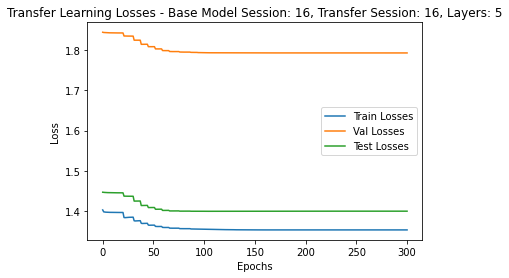

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 16
Transfer Session: 17
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5161
Epoch: 000, LR: 0.010000, Train Loss: 69.1199130, Val Loss: 32.0928198, Test Loss: 32.9965651
Epoch: 050, LR: 0.010000, Train Loss: 15.7272218, Val Loss: 15.7875516, Test Loss: 16.2125725
Epoch: 100, LR: 0.007000, Train Loss: 15.6362780, Val Loss: 15.7042612, Test Loss: 16.0993719
Epoch: 150, LR: 0.000576, Train Loss: 15.5081369, Val Loss: 15.5280138, Test Loss: 15.9994876
Epoch: 200, LR: 0.000047, Train Loss: 15.4922515, Val Loss: 15.4844167, Test Loss: 16.0121984
Epoch: 250, LR: 0.000010, Train Loss: 15.4906677, Val Loss: 15.4820376, Test Loss: 16.0143422
Epoch: 300, LR: 0.000010, Train Loss: 15.4906557, Val Loss: 15.4819473, Test Loss: 16.0143833


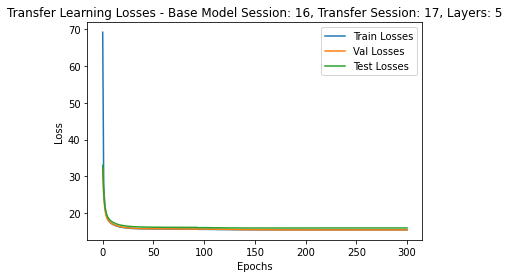

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 16
Transfer Session: 18
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5293
Epoch: 000, LR: 0.010000, Train Loss: 29.6778262, Val Loss: 17.0111443, Test Loss: 17.0675571
Epoch: 050, LR: 0.010000, Train Loss: 12.9978404, Val Loss: 13.9885032, Test Loss: 13.4365172
Epoch: 100, LR: 0.000576, Train Loss: 12.8293268, Val Loss: 13.7693101, Test Loss: 13.2017609
Epoch: 150, LR: 0.000047, Train Loss: 12.8170987, Val Loss: 13.7650519, Test Loss: 13.1977697
Epoch: 200, LR: 0.000010, Train Loss: 12.8160570, Val Loss: 13.7650419, Test Loss: 13.1975554
Epoch: 250, LR: 0.000010, Train Loss: 12.8160441, Val Loss: 13.7650628, Test Loss: 13.1975027
Epoch: 300, LR: 0.000010, Train Loss: 12.8160318, Val Loss: 13.7650927, Test Loss: 13.1974607


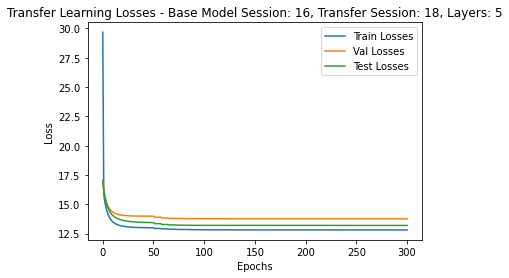

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 16
Transfer Session: 19
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 4732
Epoch: 000, LR: 0.010000, Train Loss: 42.7020517, Val Loss: 27.3494561, Test Loss: 27.5225245
Epoch: 050, LR: 0.010000, Train Loss: 17.4639198, Val Loss: 17.3822463, Test Loss: 16.8425768
Epoch: 100, LR: 0.010000, Train Loss: 17.4230204, Val Loss: 17.3303723, Test Loss: 16.8195357
Epoch: 150, LR: 0.001681, Train Loss: 17.2703173, Val Loss: 17.2162257, Test Loss: 16.7121970
Epoch: 200, LR: 0.000097, Train Loss: 17.2352761, Val Loss: 17.2078999, Test Loss: 16.7056587
Epoch: 250, LR: 0.000010, Train Loss: 17.2326420, Val Loss: 17.2078376, Test Loss: 16.7058490
Epoch: 300, LR: 0.000010, Train Loss: 17.2326292, Val Loss: 17.2078540, Test Loss: 16.7058483


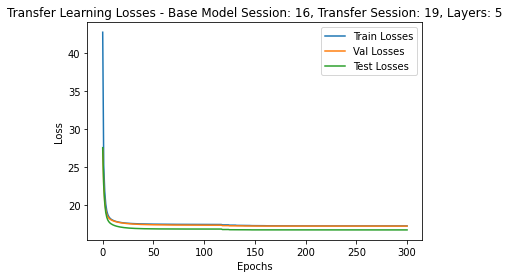

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 17
Transfer Session: 16
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5590
Epoch: 000, LR: 0.010000, Train Loss: 24.4691168, Val Loss: 17.4582166, Test Loss: 16.5854153
Epoch: 050, LR: 0.010000, Train Loss: 9.1083582, Val Loss: 10.0837774, Test Loss: 9.2433383
Epoch: 100, LR: 0.010000, Train Loss: 9.0088072, Val Loss: 9.9590377, Test Loss: 9.1308989
Epoch: 150, LR: 0.010000, Train Loss: 8.9232727, Val Loss: 9.8493169, Test Loss: 9.0331284
Epoch: 200, LR: 0.010000, Train Loss: 8.8471215, Val Loss: 9.7502832, Test Loss: 8.9456195
Epoch: 250, LR: 0.010000, Train Loss: 8.7781235, Val Loss: 9.6596680, Test Loss: 8.8659841
Epoch: 300, LR: 0.010000, Train Loss: 8.7149859, Val Loss: 9.5762011, Test Loss: 8.7929030


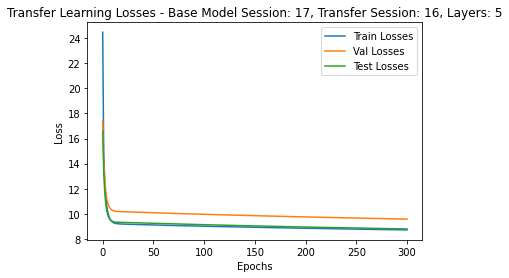

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 17
Transfer Session: 17
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5161
Epoch: 000, LR: 0.010000, Train Loss: 3.5513248, Val Loss: 4.0501880, Test Loss: 3.6260603
Epoch: 050, LR: 0.001176, Train Loss: 3.4395695, Val Loss: 3.6842341, Test Loss: 3.2745116
Epoch: 100, LR: 0.000068, Train Loss: 3.4208560, Val Loss: 3.6626405, Test Loss: 3.2596897
Epoch: 150, LR: 0.000010, Train Loss: 3.4193946, Val Loss: 3.6620896, Test Loss: 3.2595673
Epoch: 200, LR: 0.000010, Train Loss: 3.4193913, Val Loss: 3.6620554, Test Loss: 3.2595233
Epoch: 250, LR: 0.000010, Train Loss: 3.4193883, Val Loss: 3.6620329, Test Loss: 3.2594891
Epoch: 300, LR: 0.000010, Train Loss: 3.4193854, Val Loss: 3.6620147, Test Loss: 3.2594599


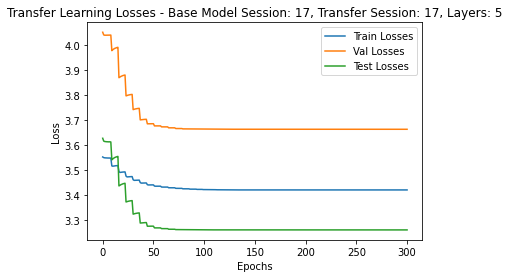

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 17
Transfer Session: 18
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5293
Epoch: 000, LR: 0.010000, Train Loss: 36.6470580, Val Loss: 20.2546449, Test Loss: 19.6575029
Epoch: 050, LR: 0.010000, Train Loss: 15.0142663, Val Loss: 16.1603549, Test Loss: 15.0611358
Epoch: 100, LR: 0.010000, Train Loss: 14.8732695, Val Loss: 16.0252090, Test Loss: 14.9156138
Epoch: 150, LR: 0.010000, Train Loss: 14.7951515, Val Loss: 15.9508634, Test Loss: 14.8342638
Epoch: 200, LR: 0.010000, Train Loss: 14.7333859, Val Loss: 15.8910874, Test Loss: 14.7696613
Epoch: 250, LR: 0.010000, Train Loss: 14.6804611, Val Loss: 15.8396187, Test Loss: 14.7143814
Epoch: 300, LR: 0.010000, Train Loss: 14.6343136, Val Loss: 15.7945149, Test Loss: 14.6659708


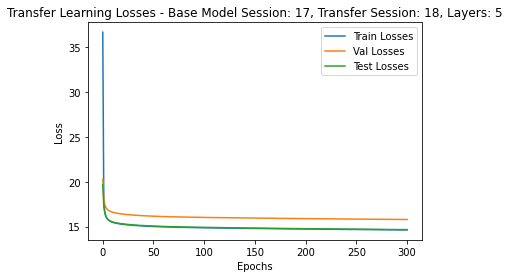

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 17
Transfer Session: 19
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 4732
Epoch: 000, LR: 0.010000, Train Loss: 35.6665922, Val Loss: 25.2890700, Test Loss: 25.9585509
Epoch: 050, LR: 0.010000, Train Loss: 21.1210732, Val Loss: 20.5765255, Test Loss: 20.9611753
Epoch: 100, LR: 0.010000, Train Loss: 21.0270238, Val Loss: 20.5267169, Test Loss: 20.8933963
Epoch: 150, LR: 0.010000, Train Loss: 20.9644791, Val Loss: 20.4848808, Test Loss: 20.8456075
Epoch: 200, LR: 0.010000, Train Loss: 20.9158714, Val Loss: 20.4519701, Test Loss: 20.8082990
Epoch: 250, LR: 0.010000, Train Loss: 20.8763432, Val Loss: 20.4251680, Test Loss: 20.7778061
Epoch: 300, LR: 0.010000, Train Loss: 20.8433393, Val Loss: 20.4027426, Test Loss: 20.7521856


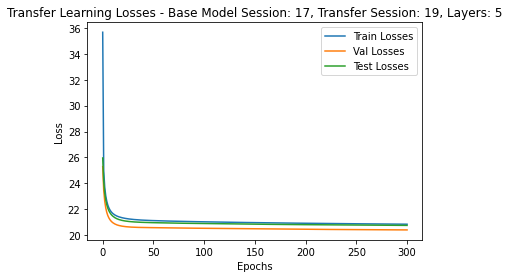

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 18
Transfer Session: 16
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5590
Epoch: 000, LR: 0.010000, Train Loss: 14.0559726, Val Loss: 7.0588222, Test Loss: 6.8621858
Epoch: 050, LR: 0.010000, Train Loss: 5.9614672, Val Loss: 6.1457084, Test Loss: 5.8218264
Epoch: 100, LR: 0.010000, Train Loss: 5.9366314, Val Loss: 6.1173914, Test Loss: 5.8015100
Epoch: 150, LR: 0.010000, Train Loss: 5.9247583, Val Loss: 6.1055885, Test Loss: 5.7898266
Epoch: 200, LR: 0.010000, Train Loss: 5.9171969, Val Loss: 6.0983398, Test Loss: 5.7818830
Epoch: 250, LR: 0.002401, Train Loss: 5.8216026, Val Loss: 6.0313633, Test Loss: 5.7154086
Epoch: 300, LR: 0.000198, Train Loss: 5.7828978, Val Loss: 6.0057756, Test Loss: 5.6880983


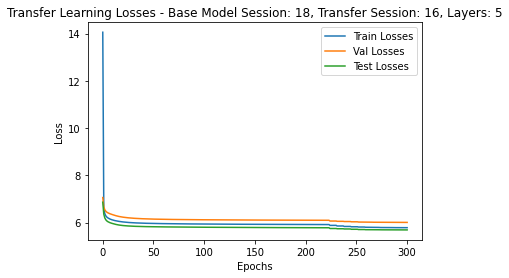

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 18
Transfer Session: 17
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5161
Epoch: 000, LR: 0.010000, Train Loss: 50.4153093, Val Loss: 37.9669030, Test Loss: 38.7741764
Epoch: 050, LR: 0.010000, Train Loss: 23.9198446, Val Loss: 24.0420358, Test Loss: 23.0586234
Epoch: 100, LR: 0.010000, Train Loss: 22.7308392, Val Loss: 22.9798253, Test Loss: 21.9004913
Epoch: 150, LR: 0.010000, Train Loss: 21.8904965, Val Loss: 22.1922794, Test Loss: 21.0836127
Epoch: 200, LR: 0.010000, Train Loss: 21.2363814, Val Loss: 21.5728501, Test Loss: 20.4506324
Epoch: 250, LR: 0.010000, Train Loss: 20.7130746, Val Loss: 21.0748045, Test Loss: 19.9452649
Epoch: 300, LR: 0.010000, Train Loss: 20.2869345, Val Loss: 20.6670842, Test Loss: 19.5336926


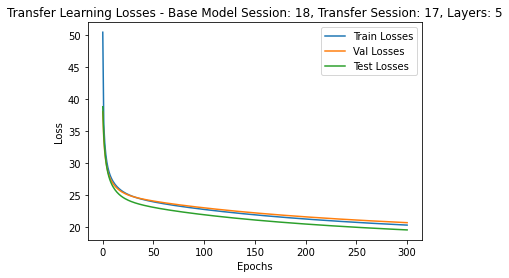

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 18
Transfer Session: 18
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5293
Epoch: 000, LR: 0.010000, Train Loss: 5.1660447, Val Loss: 6.3666653, Test Loss: 6.0762464
Epoch: 050, LR: 0.000824, Train Loss: 5.0265962, Val Loss: 6.2749367, Test Loss: 6.0302072
Epoch: 100, LR: 0.000047, Train Loss: 5.0138843, Val Loss: 6.2734335, Test Loss: 6.0345555
Epoch: 150, LR: 0.000010, Train Loss: 5.0130041, Val Loss: 6.2735798, Test Loss: 6.0347593
Epoch: 200, LR: 0.000010, Train Loss: 5.0129953, Val Loss: 6.2736106, Test Loss: 6.0347806
Epoch: 250, LR: 0.000010, Train Loss: 5.0129869, Val Loss: 6.2736204, Test Loss: 6.0347873
Epoch: 300, LR: 0.000010, Train Loss: 5.0129787, Val Loss: 6.2736208, Test Loss: 6.0347844


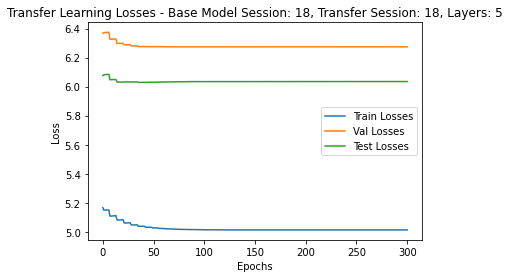

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 18
Transfer Session: 19
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 4732
Epoch: 000, LR: 0.010000, Train Loss: 48.3595515, Val Loss: 29.4137489, Test Loss: 29.7752727
Epoch: 050, LR: 0.010000, Train Loss: 26.6766527, Val Loss: 25.9331984, Test Loss: 25.6220397
Epoch: 100, LR: 0.010000, Train Loss: 26.5083429, Val Loss: 25.7755588, Test Loss: 25.4518365
Epoch: 150, LR: 0.010000, Train Loss: 26.3832757, Val Loss: 25.6538107, Test Loss: 25.3181731
Epoch: 200, LR: 0.010000, Train Loss: 26.2835520, Val Loss: 25.5559443, Test Loss: 25.2088953
Epoch: 250, LR: 0.010000, Train Loss: 26.2021747, Val Loss: 25.4761311, Test Loss: 25.1186892
Epoch: 300, LR: 0.010000, Train Loss: 26.1348381, Val Loss: 25.4102466, Test Loss: 25.0435003


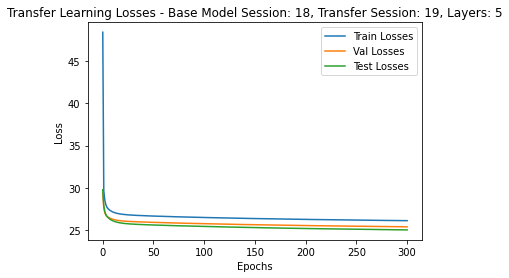

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 19
Transfer Session: 16
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5590
Epoch: 000, LR: 0.010000, Train Loss: 18.3638380, Val Loss: 9.4405851, Test Loss: 8.9859597
Epoch: 050, LR: 0.010000, Train Loss: 6.2122195, Val Loss: 6.5625223, Test Loss: 6.1588644
Epoch: 100, LR: 0.010000, Train Loss: 6.2040129, Val Loss: 6.5531389, Test Loss: 6.1476857
Epoch: 150, LR: 0.003430, Train Loss: 6.0751219, Val Loss: 6.5159430, Test Loss: 6.1241992
Epoch: 200, LR: 0.000282, Train Loss: 6.0233270, Val Loss: 6.4997180, Test Loss: 6.1314036
Epoch: 250, LR: 0.000016, Train Loss: 6.0176796, Val Loss: 6.5012657, Test Loss: 6.1371008
Epoch: 300, LR: 0.000010, Train Loss: 6.0175152, Val Loss: 6.5014330, Test Loss: 6.1375978


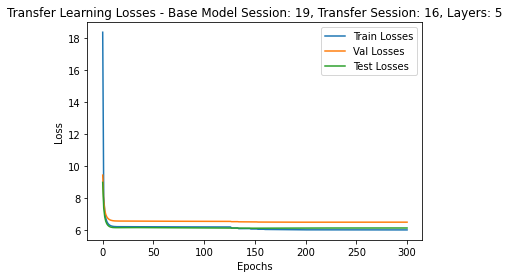

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 19
Transfer Session: 17
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5161
Epoch: 000, LR: 0.010000, Train Loss: 42.4877879, Val Loss: 22.0448860, Test Loss: 22.0594923
Epoch: 050, LR: 0.010000, Train Loss: 16.5139230, Val Loss: 16.5923653, Test Loss: 16.4091003
Epoch: 100, LR: 0.010000, Train Loss: 16.3348531, Val Loss: 16.4014914, Test Loss: 16.2054719
Epoch: 150, LR: 0.010000, Train Loss: 16.1960149, Val Loss: 16.2514099, Test Loss: 16.0797263
Epoch: 200, LR: 0.010000, Train Loss: 16.0876440, Val Loss: 16.1330396, Test Loss: 16.0259646
Epoch: 250, LR: 0.010000, Train Loss: 16.0025889, Val Loss: 16.0387791, Test Loss: 16.0369306
Epoch: 300, LR: 0.010000, Train Loss: 15.9355808, Val Loss: 15.9637659, Test Loss: 16.1111448


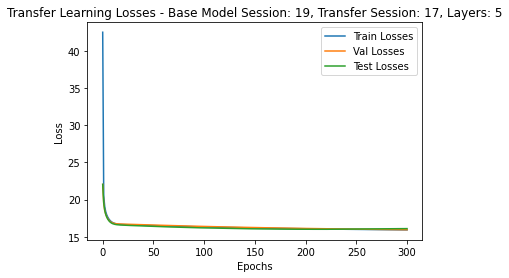

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 19
Transfer Session: 18
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 5293
Epoch: 000, LR: 0.010000, Train Loss: 31.3206433, Val Loss: 15.1842881, Test Loss: 14.8973851
Epoch: 050, LR: 0.003430, Train Loss: 11.4938406, Val Loss: 12.6666425, Test Loss: 12.4711725
Epoch: 100, LR: 0.000282, Train Loss: 11.4294926, Val Loss: 12.5978666, Test Loss: 12.4229571
Epoch: 150, LR: 0.000016, Train Loss: 11.4210307, Val Loss: 12.5986024, Test Loss: 12.4178143
Epoch: 200, LR: 0.000010, Train Loss: 11.4207780, Val Loss: 12.5988695, Test Loss: 12.4177914
Epoch: 250, LR: 0.000010, Train Loss: 11.4207684, Val Loss: 12.5989306, Test Loss: 12.4178173
Epoch: 300, LR: 0.000010, Train Loss: 11.4207593, Val Loss: 12.5989656, Test Loss: 12.4178302


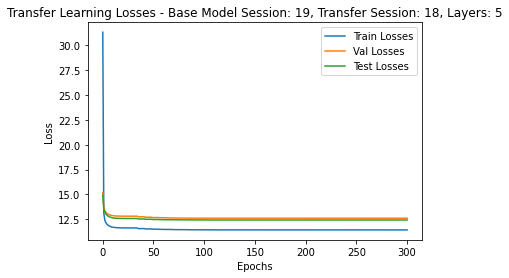

Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen
Base Model Session: 19
Transfer Session: 19
Num Layers: 5, Hidden Layer Dimensionality: 32, Total Parameters: 4732
Epoch: 000, LR: 0.010000, Train Loss: 4.4125968, Val Loss: 4.7444521, Test Loss: 4.7656433
Epoch: 050, LR: 0.000824, Train Loss: 4.2948215, Val Loss: 4.6894908, Test Loss: 4.6873670
Epoch: 100, LR: 0.000068, Train Loss: 4.2820418, Val Loss: 4.6812831, Test Loss: 4.6689642
Epoch: 150, LR: 0.000010, Train Loss: 4.2807428, Val Loss: 4.6805873, Test Loss: 4.6676113
Epoch: 200, LR: 0.000010, Train Loss: 4.2807417, Val Loss: 4.6805870, Test Loss: 4.6676065
Epoch: 250, LR: 0.000010, Train Loss: 4.2807409, Val Loss: 4.6805909, Test Loss: 4.6676052
Epoch: 300, LR: 0.000010, Train Loss: 4.2807402, Val Loss: 4.6805956, Test Loss: 4.6676036


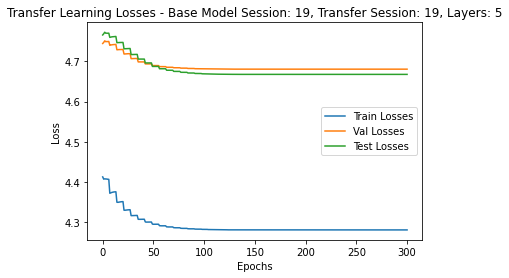

In [ ]:
all_instance_data_tf_learning_aftertrain_freeze = []
for s1 in range(4):
    #make copy of model
    model_s1 = copy.deepcopy(loaded_models_array[s1][2])
    
    #freeze parameters from base model
    for param in model_s1.parameters():
        param.requires_grad = False

    model_instance_data = []
    for s2, (train_loader, val_loader, test_loader) in enumerate(zip(train_loaders_list, val_loaders_list, test_loaders_list)):
        model_s2 = copy.deepcopy(loaded_models_array[s2][2])
        
        #put last layer of model_s2 into model_s1
        model_s1.net[-1] = model_s2.net[-1]

        criterion = torch.nn.MSELoss()
        optimizer = torch.optim.Adam(model_s1.parameters(), lr=0.01)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.7, patience=5, min_lr=0.00001)   
        total_params = sum(p.numel() for p in model_s1.parameters())

        print('Transfer Learning: Swapping 1 layer, Base Model Parameters Frozen')
        print('Base Model Session: {}'.format(s1+16))
        print('Transfer Session: {}'.format(s2+16))
        print('Num Layers: {}, Hidden Layer Dimensionality: {}, Total Parameters: {}'\
            .format(model_s1.num_layers, model_s1.hidden_layer_dim, total_params))
        
        train_losses = []
        val_losses = []
        test_losses = []
        for epoch in range(301):
            # torch.cuda.empty_cache()
            lr = scheduler.optimizer.param_groups[0]['lr']
            train_loss = train(train_loader, model_s1, optimizer, criterion)
            val_loss = test(val_loader, model_s1, optimizer, criterion)
            scheduler.step(val_loss)
            test_loss = test(test_loader, model_s1, optimizer, criterion)
            if epoch % 50==0:
                print('Epoch: {:03d}, LR: {:7f}, Train Loss: {:.7f}, Val Loss: {:.7f}, Test Loss: {:.7f}'\
                      .format(epoch, lr, train_loss, val_loss, test_loss))

            train_losses.append(train_loss)
            val_losses.append(val_loss)
            test_losses.append(test_loss)

        # get the losses for each sample after training is done
        instance_data = [get_instance_losses(train_loader, model_s1),\
                                get_instance_losses(val_loader, model_s1),\
                                get_instance_losses(test_loader, model_s1)]
        model_instance_data.append(instance_data)

        plt.plot(train_losses)
        plt.plot(val_losses)
        plt.plot(test_losses)
        plt.title('Transfer Learning Losses - Base Model Session: {}, Transfer Session: {}, Layers: {}'.format(s1+16, s2+16, model_s1.num_layers))
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend(['Train Losses', 'Val Losses', 'Test Losses'])
        plt.show()

        # save model
        directory = '/content/drive/My Drive/Miller_Lab/FIU/MLP/TransferLearning/1layerswap/'
        model_name = 'basesession{}_transfersession{}_5layers.pth'.format(s1+16, s2+16)
        torch.save(model_s1.state_dict(), directory+model_name)

    all_instance_data_tf_learning_aftertrain_freeze.append(model_instance_data)

In [ ]:
for s1 in range(4):
    table = np.zeros((4,3))
    s2_labels = []
    for s2 in range(4):

        s2_labels.append('Session {}'.format(s2+16))
        instance_data = all_instance_data_tf_learning_aftertrain_freeze[s1][s2]

        for k in range(3): #plot train, val, test data
            instance_targets = instance_data[k][2]
            instance_preds = instance_data[k][3]
            session_num = instance_data[k][6]

            r2 = sklearn.metrics.r2_score(instance_targets,instance_preds,multioutput='variance_weighted')
            table[s2,k] += r2

    print('Base Model Session {} Variance Weighted R^2 Scores (transfer 1 layer)'.format(s1+16))
    df = pd.DataFrame(table, columns = ['Train','Val','Test'], index = s2_labels)
    display(df)

Base Model Session 16 Variance Weighted R^2 Scores (transfer 1 layer)


,Train,Val,Test
Session 16,0.947497,0.930906,0.945068
Session 17,0.635576,0.634384,0.629123
Session 18,0.607427,0.575274,0.600207
Session 19,0.598072,0.582800,0.601952


Base Model Session 17 Variance Weighted R^2 Scores (transfer 1 layer)


,Train,Val,Test
Session 16,0.659999,0.631163,0.654792
Session 17,0.919562,0.913519,0.924821
Session 18,0.552950,0.513161,0.556112
Session 19,0.514702,0.505465,0.505256


Base Model Session 18 Variance Weighted R^2 Scores (transfer 1 layer)


,Train,Val,Test
Session 16,0.775632,0.768562,0.777110
Session 17,0.525621,0.511933,0.552301
Session 18,0.846343,0.807150,0.818317
Session 19,0.388116,0.384284,0.403057


Base Model Session 19 Variance Weighted R^2 Scores (transfer 1 layer)


,Train,Val,Test
Session 16,0.766392,0.749311,0.760159
Session 17,0.629216,0.623005,0.629556
Session 18,0.650197,0.612427,0.624088
Session 19,0.899848,0.886657,0.888678


In [ ]:
# [all_losses, all_inputs, all_targets, all_preds, all_samplenums, all_trialnums, session_num]
all_instance_data_tf_learning_aftertrain_freeze[0][0][2]

#session 16: 5,13,16
#session 17: 1,15,26
#session 18: 2,10,33
#session 19: 4,8,20
session_electrodes_greatest_var = [[5,13,16],[1,15,26],[2,10,33],[4,8,20]]

# base model 16
for j, base_model in enumerate(all_instance_data_tf_learning_aftertrain_freeze):
    for i, (electrodes, tf_model) in enumerate(zip(session_electrodes_greatest_var, base_model)):
        tf_model_test = tf_model[2]

        target_signal = tf_model_test[2]
        prediction_signal = tf_model_test[3]
        sample_nums = tf_model_test[4]
        
        target_signal_ordered = target_signal[sample_nums.argsort()]
        prediction_signal_ordered = prediction_signal[sample_nums.argsort()]

        for elec in electrodes:
            plt.figure(figsize=(30,5))
            plt.plot(target_signal_ordered[:,elec])
            plt.plot(prediction_signal_ordered[:,elec])
            plt.title('Base Session: {}, Transfer Session: {}, Electrode: {}'.format(j+16, i+16, elec))
            plt.legend(['Target', 'Predicted'])
            plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
x = all_instance_data_tf_learning_aftertrain_freeze[0][0][2][4]
x[x.argsort()]

array([    0,     2,    15, ..., 11286, 11289, 11299])

In [ ]:
all_instance_data_tf_learning_aftertrain_freeze2layers = []
for s1 in range(4):
    #make copy of model
    model_s1 = copy.deepcopy(loaded_models_array[s1][2])
    
    #freeze parameters from base model
    for param in model_s1.parameters():
        param.requires_grad = False

    model_instance_data = []
    for s2, (train_loader, val_loader, test_loader) in enumerate(zip(train_loaders_list, val_loaders_list, test_loaders_list)):
        model_s2 = copy.deepcopy(loaded_models_array[s2][2])
        
        #put last layer of model_s2 into model_s1
        model_s1.net[-1] = model_s2.net[-1]
        model_s1.net[-3] = model_s2.net[-3]

        criterion = torch.nn.MSELoss()
        optimizer = torch.optim.Adam(model_s1.parameters(), lr=0.01)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.7, patience=5, min_lr=0.00001)   
        total_params = sum(p.numel() for p in model_s1.parameters())

        print('Transfer Learning: Swapping 2 layers, Base Model Parameters Frozen')
        print('Base Model Session: {}'.format(s1+16))
        print('Transfer Session: {}'.format(s2+16))
        print('Num Layers: {}, Hidden Layer Dimensionality: {}, Total Parameters: {}'\
            .format(model_s1.num_layers, model_s1.hidden_layer_dim, total_params))
        
        train_losses = []
        val_losses = []
        test_losses = []
        for epoch in range(301):
            # torch.cuda.empty_cache()
            lr = scheduler.optimizer.param_groups[0]['lr']
            train_loss = train(train_loader, model_s1, optimizer, criterion)
            val_loss = test(val_loader, model_s1, optimizer, criterion)
            scheduler.step(val_loss)
            test_loss = test(test_loader, model_s1, optimizer, criterion)
            if epoch % 50==0:
                print('Epoch: {:03d}, LR: {:7f}, Train Loss: {:.7f}, Val Loss: {:.7f}, Test Loss: {:.7f}'\
                      .format(epoch, lr, train_loss, val_loss, test_loss))

            train_losses.append(train_loss)
            val_losses.append(val_loss)
            test_losses.append(test_loss)

        # get the losses for each sample after training is done
        instance_data = [get_instance_losses(train_loader, model_s1),\
                                get_instance_losses(val_loader, model_s1),\
                                get_instance_losses(test_loader, model_s1)]
        model_instance_data.append(instance_data)

        plt.plot(train_losses)
        plt.plot(val_losses)
        plt.plot(test_losses)
        plt.title('Transfer Learning Losses - Base Model Session: {}, Transfer Session: {}, Layers: {}'.format(s1+16, s2+16, model_s1.num_layers))
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend(['Train Losses', 'Val Losses', 'Test Losses'])
        plt.show()

        # save model
        directory = '/content/drive/My Drive/Miller_Lab/FIU/MLP/TransferLearning/2layerswap/'
        model_name = 'basesession{}_transfersession{}_5layers.pth'.format(s1+16, s2+16)
        torch.save(model_s1.state_dict(), directory+model_name)

    all_instance_data_tf_learning_aftertrain_freeze2layers.append(model_instance_data)